# Analysis for Designated Motion vs Motion generation vs Actual angle motion

## Making of Master DF

In [42]:
# To collect data from all the main files
import pandas as pd
mg_dir =r"\2023-01-12_23-20-45.967764-B_50-20x5x10x7_256_b32_nw"
train_dir=r"\2023-01-09_20-41-40.094885-B-AC-_50-20x5x10x7_256"

des_dir=[r"\2023-01-19_23-54-29.152547_B-20-_20-50_50F",r"\2023-01-20_01-36-02.327921_B-35-_50diffx5x2x7_256",r"\2023-01-20_00-34-36.824241_B-50-_50-20x5x2x7_20F_256",train_dir]



# df_var=pd.DataFrame({"varience":["DM","ML","Pred","des_ang","servo_values"]})


In [43]:
# for ix in range(3):
#     print()
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)


In [44]:
#get all the data
import pandas as pd
from matplotlib import cm
import numpy as np
import os
import matplotlib.pyplot as plt
def find_csv_filenames( path_to_dir, suffix=".csv" ):
    path_dir=r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping"
    
    filenames = os.listdir(path_dir+path_to_dir)
    return [ int(filename.replace(suffix,"")) for filename in filenames if filename.endswith( suffix ) ]


def find_csv_mg( path_to_dir, suffix=".csv",test_train_range=0):
    # csv_en,csv_st="",""
    path=   r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\logs\prediction_logs\wiping" 
    filenames = os.listdir(path + path_to_dir)
    csv_list=sorted([ filename for filename in filenames if filename.endswith( suffix ) ])
    # print("length = ",len(csv_list))
    print(path_to_dir[:-14]," list => [(csv_list,index)] ", (list(zip (csv_list,(list(range(0,len(csv_list))))))))
    return path + path_to_dir +"\\"+ csv_list[0]




In [45]:
start_ang=[20,20,50]
agstep=[5,5,-5]
diff=7
for sa in range(3):

    angles_list= list(range(start_ang[sa],start_ang[sa]+diff*agstep[sa],agstep[sa]))
    print(angles_list)

[20, 25, 30, 35, 40, 45, 50]
[20, 25, 30, 35, 40, 45, 50]
[50, 45, 40, 35, 30, 25, 20]


In [46]:
np.random.randn(2, 3)

array([[ 1.62434536, -0.61175641, -0.52817175],
       [-1.07296862,  0.86540763, -2.3015387 ]])

In [47]:
import numpy as np
import xarray as xr

#make this example reproducible
np.random.seed(1)

#create 3D dataset
xarray_3d = xr.Dataset(
    {50: (("test_angle", "servo_values","cycle"), np.random.randn(7,6,5))},
    coords={
        "test_angle": [20, 25, 30, 35, 40, 45, 50],
        "servo_values": ["A1","A2","A3","C1","C2","C3"],
        "cycle":[1,2,3,4,5],
        35: ("test_angle", np.random.randn(7)),
        20: ("test_angle", np.random.randn(7)),
        "MG": ("test_angle", np.random.randn(7)),
        "PRED": ("test_angle", np.random.randn(7)),
        "AC": ("test_angle", np.random.randn(7)),
    },
)
print(xarray_3d)
#convert xarray to DataFrame
df_3d = xarray_3d.to_dataframe()

#view 3D DataFrame
display(df_3d.head(5))

<xarray.Dataset>
Dimensions:       (test_angle: 7, servo_values: 6, cycle: 5)
Coordinates:
  * test_angle    (test_angle) int32 20 25 30 35 40 45 50
  * servo_values  (servo_values) <U2 'A1' 'A2' 'A3' 'C1' 'C2' 'C3'
  * cycle         (cycle) int32 1 2 3 4 5
    35            (test_angle) float64 -0.3265 -1.343 1.114 ... 0.8758 0.6234
    20            (test_angle) float64 -0.435 1.408 0.1291 ... 1.559 0.1094
    MG            (test_angle) float64 -1.22 2.449 -0.5458 ... -0.2034 0.2427
    PRED          (test_angle) float64 0.2018 0.661 1.792 ... -1.182 -0.6658
    AC            (test_angle) float64 -1.674 0.825 -0.4982 ... -1.397 -0.8613
Data variables:
    50            (test_angle, servo_values, cycle) float64 1.624 ... 1.956


50        35        20        MG     PRED        AC
test_angle servo_values cycle                                                           
20         A1           1      1.624345 -0.326499 -0.434957 -1.219744  0.20183 -1.674196
                        2     -0.611756 -0.326499 -0.434957 -1.219744  0.20183 -1.674196
                        3     -0.528172 -0.326499 -0.434957 -1.219744  0.20183 -1.674196
                        4     -1.072969 -0.326499 -0.434957 -1.219744  0.20183 -1.674196
                        5      0.865408 -0.326499 -0.434957 -1.219744  0.20183 -1.674196

In [48]:
# df_3d["20"]["MG"]["C1"]=0.008

# df_3d

In [49]:
df_var=pd.DataFrame({"varience":["DM","ML","Pred","des_ang","servo_values"]},columns=["varience",20, 25, 30, 35, 40, 45, 50])
df_var

,varience,20,25,30,35,40,45,50
0,DM,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ML,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Pred,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,des_ang,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,servo_values,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [50]:
data = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\{}\csv\{}.csv".format(des_dir[0],"train",str(37)),skiprows=2)#.zfill(2)
data["C1_"]=(data["C1"]-data["C1"].min())/(data["C1"].max()-data["C1"].min())
data["C1_"]=data["C1_"].diff()#.plot()#.var()
data["C1_"].mode()#.var()

0   -0.005123
1    0.008233
2    0.010611
3    0.010794
Name: C1_, dtype: float64

### Backup variance code

In [51]:
# # Backup
# # # print(colm)
# # # df_var=pd.DataFrame({"varience":["DM","ML","Pred"]})
# # # var_=dict(DM=[],ML=[],Pred=[],des_ang=[],servo_values= [])
# # import numpy as np
# # import xarray as xr
# font = {'family' : 'normal',
#             'weight' : 'bold',
#             'size'   : 60}
# plt.rc('font', **font)
# # #make this example reproducible
# # np.random.seed(1)

# # #create 3D dataset
# # xarray_3d = xr.Dataset(
# #     {50: (("test_angle", "servo_values"), np.random.randn(7,3))},
# #     coords={
# #         "test_angle": [20, 25, 30, 35, 40, 45, 50],
# #         "servo_values": ["C1","C2","C3"],
# #         35: ("test_angle", np.random.randn(7)),
# #         20: ("test_angle", np.random.randn(7)),
# #     },
# # )
# # print(xarray_3d)
# # #convert xarray to DataFrame
# # df_3d = xarray_3d.to_dataframe()

# # #view 3D DataFrame
# # print(df_3d)
# import numpy as np
# import xarray as xr

# #make this example reproducible
# np.random.seed(1)

# #create 3D dataset
# xarray_3d = xr.Dataset(
#     {"50": (("test_angle", "servo_values","cycle"), np.zeros((7,6,5)))},
#     coords={
#         "test_angle": ["20", "25", "30", "35", "40", "45", "50"],
#         "servo_values": ["A1","A2","A3","C1","C2","C3"],
#         "cycle":[1,2,3,4,5],
#         "35": ("test_angle", np.zeros(7)),
#         "20": ("test_angle", np.zeros(7)),
#         "MG": ("test_angle", np.zeros(7)),
#         "PRED": ("test_angle", np.zeros(7)),
#         "AC": ("test_angle", np.zeros(7)),
#     },
# )
# print(xarray_3d)
# #convert xarray to DataFrame
# df_3d = xarray_3d.to_dataframe()

# #view 3D DataFrame
# print(df_3d)
# # df_var=pd.DataFrame({"varience":["DM","ML","Pred","des_ang","servo_values"],20:0, 25:0, 30:0, 35:0, 40:0, 45:0, 50:0})#,columns=["varience",20, 25, 30, 35, 40, 45, 50])
# start_ang=[20,20,50,20]
# agstep=[5,5,-5,5]
# ss=[2,2,2,10]
# data_des={}
# for ix in range(len(des_dir)):
#     _dir=des_dir[ix]
#     csv_=find_csv_mg(mg_dir)
#     print(csv_)
#     train_list=find_csv_filenames(_dir+r"\train\csv")
#     # print(len(train_list))
#     diff=7
#     test_list=find_csv_filenames(_dir+r"\test\csv")
#     # print(len(test_list))
    
#     angles_list= list(range(start_ang[ix],start_ang[ix]+diff*agstep[ix],agstep[ix])) #list(range(start_ang,start_ang+diff*5,5))
#     print(angles_list, angles_list[0])
#     train_list =sorted(train_list)
#     tt_list=sorted(train_list+test_list)
#     print(len(tt_list))
#     trail=ss[ix]
#     print()
#     # print(tt_list,"len(angles_list)",len(angles_list))
#     angles_trails={}
#     for val in tt_list:
#         # print(val)
#         # print(int((val-tt_list[0])/trail),val,tt_list[0])
#         angles_trails[val]=angles_list[int((val-tt_list[0])/trail)]
#     print(angles_trails)
#     limit_seq = -1
#     # load dataset
#     data_mg= pd.read_csv(csv_,skiprows=2, dtype="float64")#.set_index('step')
#     header = [
#                 "time",
#                 "A1",
#                 "A2",
#                 "A3",
#                 "A1p",
#                 "A2p",
#                 "A3p",
#                 "C1",
#                 "C2",
#                 "C3",
#                 "C1p",
#                 "C2p",
#                 "C3p",
#             ] + ["Hid" + str(k) for k in range(26)]
#     data_mg.columns=header
#     # data_=T2
#     an=diff

#     des_angle_=des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4]
#     a_i = {"angle":["A1","A2","A3"],"current":["C1","C2","C3"]}

#     # data_.plot(x="step",y=["train_"+i+"_loss","test_"+i+"_loss"])
    
#     # steps = list(range(len(data_rows)))

#     # print(tt_list[0::ss[ix]])
#     for t,a in enumerate(tt_list[1::ss[ix]]):#range(67,0,-10)):#[7,17,27,37,47,57,67]:#
#         # data1 = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\test\csv\{}.csv".format(_dir,str(a)),skiprows=2)#.zfill(2)
#         if a in train_list:
#             tts="train"
#         else:
#             tts = "test"
#         # data = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\{}\csv\{}.csv".format(_dir,tts,str(a)),skiprows=2)#.zfill(2)
        
#         # print(t,a,data_des[des_angle_].shape,data.shape)
#         # data1=data

        
#         if t ==0:
#             data_des[des_angle_] = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\{}\csv\{}.csv".format(_dir,tts,str(a)),skiprows=2)#.zfill(2)
#             # data_des[des_angle_]["trail"]=a

#             # print(t,a,tt_list[0],data_des[des_angle_].head(-5))
#             # data1[a_i[i][j]+"_"] = data1[a_i[i][j]].apply( lambda n: n*0.00035862)
#             for j in range(3):
#                 for i in ["angle", "current"]:
#                     if i == "angle":
                        
#                         data_des[des_angle_][a_i[i][j]+"_"] = data_des[des_angle_][a_i[i][j]].apply( lambda n: n*0.00035862)
#                         data_des[des_angle_]["d"+a_i[i][j]+"_"] =data_des[des_angle_][a_i[i][j]+"_"].diff()


#                     else:

#                         data_des[des_angle_][a_i[i][j]+"_"] = data_des[des_angle_][a_i[i][j]]#.apply( lambda n: n*0.00035862)
#                         data_des[des_angle_]["d"+a_i[i][j]+"_"] =data_des[des_angle_][a_i[i][j]].diff()
#                         # display(data_des[des_angle_]["d"+a_i[i][j]+"_"])
#                         # print(data_des[des_angle_]["d"+a_i[i][j]+"_"].describe(),data_des[des_angle_]["d"+a_i[i][j]+"_"].var())
#                         # quit()
            
#         else:   
#             data = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\{}\{}\csv\{}.csv".format(_dir,tts,str(a)),skiprows=2)#.zfill(2)
#             for j in range(3):
#                 for i in ["angle", "current"]:
#                     if i == "angle":
                        
#                         data[a_i[i][j]+"_"] = data[a_i[i][j]].apply( lambda n: n*0.00035862)
#                         data["d"+a_i[i][j]+"_"] =data[a_i[i][j]+"_"].diff()


#                     else:


#                         data["d"+a_i[i][j]+"_"] =data[a_i[i][j]].diff()
                        
#                         data[a_i[i][j]+"_"] = data[a_i[i][j]]#.apply( lambda n: n*0.00035862)
#                         # data["trail"]=a
#             data_des[des_angle_] = pd.concat([data_des[des_angle_],data], ignore_index=True)#.reset_index()


#             # print("concat",t,a,data_des[des_angle_].shape,data.shape)
#             # print(data.columns)
#         # print(t,a,data_des[des_angle_].shape,data.shape)
        

#         #


#         # break
#     for i in ["angle", "current"]:
#         for j in range(3):
#             seq = data_mg.shape[0]
#             print(a_i[i][j],"dara_des",data_des[des_angle_].shape,"dara_mg",data_mg.shape,seq)
#             # print(data_mg.columns)
#             if i == "angle":
                
#                 data_mg[a_i[i][j]+"_"] = data_mg[a_i[i][j]].apply( lambda n: n*0.00035862)
#                 data_mg[a_i[i][j]+"p"+"_"] = data_mg[a_i[i][j]+"p"].apply( lambda n: n*0.00035862)
#                 data_mg["d"+a_i[i][j]+"_"] =data_mg[a_i[i][j]+"_"].diff()
#                 data_mg["d"+a_i[i][j]+"p"+"_"] =data_mg[a_i[i][j]+"p_"].diff()
#                 # data_mg["trail"]=a
#             else:
#                 # data_mg[a_i[i][j]+"_"] = data_mg[a_i[i][j]]#.apply( lambda n: n*0.00035862)
#                 data_mg["d"+a_i[i][j]+"_"] =data_mg[a_i[i][j]].diff()
#                 data_mg["d"+a_i[i][j]+"p"+"_"] =data_mg[a_i[i][j]+"p"].diff()
#                 # data_mg["trail"]=a
                
            
            

#             q=int(seq/an)
#             # cyc=q/256
#             x = data_des[des_angle_]["d"+a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
#             # print(q*t,(t+1)*q)
#             y = data_mg["d"+a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
#             y_= data_mg["d"+a_i[i][j]+"p"+"_"]#[:int(q*an)]


#             # print(x.shape,y.shape)
#             time_x=list(range(x.shape[0]))
#             # plt.figure(figsize=(27,20))
#             # plt.scatter(time_x,x,s=30,marker=".",label="Designated Motion_"+a_i[i][j])#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
#             # plt.scatter(time_x,y,s=30,marker="*",label="Motion Generation")
#             # plt.scatter(time_x,y_,s=30,marker="*",label="PRED")
#             # plt.show()
#             # plt.figure(figsize=(35,20))
#             round_val=6
#             for d in range(an):
                
#                 # c=colr[d]
#                 # c1=colr[d*2]
#                 for cycle,cy in enumerate(range(0,q,256)):#percycle
#                     # plt.figure(figsize=(35,20))
#                     qs=q-cy-256
#                     # print(q,qs,cy)
#                     # print("range",d*q+qs,(1+d)*q-cy)
#                     time_xx=time_x[d*q+qs:(1+d)*q-cy]
#                     xx=x[d*q+qs:(1+d)*q-cy]
#                     yy=y[d*q+qs:-1+(1+d)*q-cy]
#                     yy_=y_[d*q+qs:-1+(1+d)*q-cy]
#                     # zz=[d*q+qs:(1+d)*q-cy]
#                     # print(q,d,angles_list[d],"shapes,tx,x,y",len(time_xx),xx.shape,y[d*q+qs:(1+d)*q-cy].shape)
#                     # print(q,d,angles_list[d],"shapes,tx,x,y",len(time_xx),xx.shape,yy.shape)
#                     var_i=dict(DM=xx.var(),MG=yy.var(),PRED=yy_.var(),des_ang=des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4],servo_values= a_i[i][j])

#                     # print(q,d,angles_list[d],"shapes,tx,x,y",len(time_xx[qs:q]),xx[qs:q].shape,y[d*q:-1+(1+d)*q][qs:q].shape)
#                     # plt.scatter(time_xx,xx,s=30,marker="o",label=str(angles_list[d])+"_Designated_Motion("+var_i["des_ang"]+")",alpha=0.6)#,,color=c
#                     # plt.scatter(time_xx,yy,s=30,marker="d",label=str(angles_list[d])+"_MG",alpha=0.6)#,color=c1 #
#                     # plt.scatter(time_xx,yy_,s=30,marker="d",label=str(angles_list[d])+"_Prediction",alpha=0.6)
#                     # plt.show()
#                     df_3d[var_i["des_ang"]][str(angles_list[d])][a_i[i][j]][cycle+1]=round(var_i["DM"],round_val)
#                     # # # df_3d[var_i["des_ang"]][]["C1"]=0.008
#                     # # # df_3d[var_i["des_ang"]][]["C1"]=0.008
#                     df_3d["MG"][str(angles_list[d])][a_i[i][j]][cycle+1]=round(var_i["MG"],round_val)
#                     df_3d["PRED"][str(angles_list[d])][a_i[i][j]][cycle+1]=round(var_i["PRED"],round_val)
#                     # df_3d["PRED"][str(angles_list[d])][a_i[i][j]]=round(var_i["PRED"],2)

#                 # for v in var_i.keys():
#                 #     for vv in list(var_i.values()):

#                 #         var_[v].append(vv)
#                 # print(var_)
#                 # df_var[angles_list[d]].appendlist(var_.values())
#                 # df=pd.DataFrame(var_)# pd.Series(list(var_.values()))]
#                 # df_var.append(var_,ignore_index=True)#
#             # df_var=pd.concat([df_var,pd.Series(var_).to_frame()], ignore_index=True)#dict(DM=x[d*q:(1+d)*q].var(),ML=y[d*q:(1+d)*q].var(),Pred=y_[d*q:(1+d)*q].var())

#                 # df_var[str(angles_list[d])+"_ML"].append(y[d*q:(1+d)*q].var())
#                 # df_var[str(angles_list[d])+"_Pred"].append(y_[d*q:(1+d)*q].var())
#                 # plt.plot(time_x[d*q:(1+d)*q],x[d*q:(1+d)*q])#,s=30,marker="o",label=str(angles_list[d])+"_DM")#,,color=c
#                 # plt.plot(time_x[d*q:(1+d)*q],y[d*q:-1+(1+d)*q])#,s=30,marker="d",label=str(angles_list[d])+"_ML")
#             # plt.scatter(time_x,y,s=30,label = angle_trails[a])

#             # plt.scatter(time_x,x,s=30,marker=".",label="Designated Motion")#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
#             # plt.scatter(time_x,y,s=30,marker="*",label="Motion Generation")
#                 # plt.legend(title ="Change in current for Train data vs Motion generation_" + a_i[i][j]+ "-"+str(angles_list[d]), prop={'size': 20},fontsize=25, ncol=an,handleheight=1.8, labelspacing=0)

#                 # # plt.plot(time_x,x)#,c=cm.tab10(Part[u]),linewidth=3),color=colr[cc]
#                 # # plt.plot(time_x,y)#,color=colr[cc*2]
#                 # # plt.plot(time_x,y)
#                 # plt.show()
#         #             break
#         #     plt.legend(
#         #     loc="lower center",
#         #     bbox_to_anchor=[0.5, 1],
#         #     ncol=diff,
#         #     fontsize=30,
#         #     title_fontsize=30,
#         #     title ="Current Change Designated_Motion" + a_i[i][j])
#         #     plt.xlabel("Steps")
#         #     plt.ylabel("Current in Ampere")
#         #     # plt.plot(time_x,x)#,c=cm.tab10(Part[u]),linewidth=3),color=colr[cc]
#         #     # plt.plot(time_x,y)#,color=colr[cc*2]
#         #     # plt.plot(time_x,y)
#         #     plt.show()
#         #     # break
#         #     break
#         # break
#     # break
# display(df_3d)
# # df_3d.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\50-35-20_MG_PRED_AC_qs_Cycle_ang_cur.csv",index=True)


            
            



### Normalized data variance

In [52]:
for scaling in ["no-scale"]:#,"mm","nz"]:

        
    # df_var=pd.DataFrame({"varience":["DM","ML","Pred","des_ang","servo_values"],20:0, 25:0, 30:0, 35:0, 40:0, 45:0, 50:0})#,columns=["varience",20, 25, 30, 35, 40, 45, 50])
    start_ang=[20,20,50,20]
    agstep=[5,5,-5,5]
    ss=[2,2,2,10]
    data_des={}
    for ix in range(len(des_dir)):
        _dir=des_dir[ix]
        csv_=find_csv_mg(mg_dir)
        # print(csv_)
        train_list=find_csv_filenames(_dir+r"\train\csv")
        # print(len(train_list))
        diff=7
        test_list=find_csv_filenames(_dir+r"\test\csv")
        # print(len(test_list))
        
        angles_list= list(range(start_ang[ix],start_ang[ix]+diff*agstep[ix],agstep[ix])) #list(range(start_ang,start_ang+diff*5,5))
        # print(angles_list, angles_list[0])
        train_list =sorted(train_list)
        tt_list=sorted(train_list+test_list)
        print(len(tt_list),tt_list)
        trail=ss[ix]
        print()
        # print(tt_list,"len(angles_list)",len(angles_list))
        angles_trails={}
        for val in tt_list:
            # print(val)
            # print(int((val-tt_list[0])/trail),val,tt_list[0])
            angles_trails[val]=angles_list[int((val-tt_list[0])/trail)]
        print(angles_trails)
        limit_seq = -1
        tt_list.reverse()
        print(len(tt_list),tt_list)


\2023-01-12_23-20-45.967764-B_50-20x5x1  list => [(csv_list,index)]  [('predict_20230111_151640-2023-01-09_20-41-40.094885-B_50-20x5x10x7_256_b32.csv', 0)]
14 [30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]

{30: 20, 31: 20, 32: 25, 33: 25, 34: 30, 35: 30, 36: 35, 37: 35, 38: 40, 39: 40, 40: 45, 41: 45, 42: 50, 43: 50}
14 [43, 42, 41, 40, 39, 38, 37, 36, 35, 34, 33, 32, 31, 30]
\2023-01-12_23-20-45.967764-B_50-20x5x1  list => [(csv_list,index)]  [('predict_20230111_151640-2023-01-09_20-41-40.094885-B_50-20x5x10x7_256_b32.csv', 0)]
14 [36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]

{36: 20, 37: 20, 38: 25, 39: 25, 40: 30, 41: 30, 42: 35, 43: 35, 44: 40, 45: 40, 46: 45, 47: 45, 48: 50, 49: 50}
14 [49, 48, 47, 46, 45, 44, 43, 42, 41, 40, 39, 38, 37, 36]
\2023-01-12_23-20-45.967764-B_50-20x5x1  list => [(csv_list,index)]  [('predict_20230111_151640-2023-01-09_20-41-40.094885-B_50-20x5x10x7_256_b32.csv', 0)]
14 [36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]

{36

In [53]:
#####
#Normalization
####
# # print(colm)
# df_var=pd.DataFrame({"varience":["DM","ML","Pred"]})
# var_=dict(DM=[],ML=[],Pred=[],des_ang=[],servo_values= [])
# import numpy as np
# import xarray as xr

fontsize= 60
font = {'family' : 'normal',
            'weight' : 'bold',
            'size'   : fontsize}
plt.rc('font', **font)

def me(df):
    return df.mean()
def ma(df):
    return df.max()

def mdn(df):
    return df.median()
def md(df):
    return df.mode()
def mi(df):
    return df.min()
def inv(df):
    return df#.apply(lambda x: 1/x)
def no(df):
    return df
def va(df):
    return df.var()
def su(df):
    return df.sum()
func_var = {'Mean': me,"Var":va,"Sum":su}
functions = {
    'Mean': me,
    'Max': ma,
    'Median': mdn,
    # 'Mode': md,
    'Min' : mi,
    # "Var": va,
}
fun_inv={
        1: inv,
        0:no
}
Inv_pos= [[1,0,0,0],[0,1,0,0],[0,0,1,0],[0,0,0,1]]
# #make this example reproducible
# np.random.seed(1)

# #create 3D dataset
# xarray_3d = xr.Dataset(
#     {50: (("test_angle", "servo_values"), np.random.randn(7,3))},
#     coords={
#         "test_angle": [20, 25, 30, 35, 40, 45, 50],
#         "servo_values": ["C1","C2","C3"],
#         35: ("test_angle", np.random.randn(7)),
#         20: ("test_angle", np.random.randn(7)),
#     },
# )
# print(xarray_3d)
# #convert xarray to DataFrame
# df_3d = xarray_3d.to_dataframe()

# #view 3D DataFrame
# print(df_3d)
import numpy as np
import xarray as xr

#make this example reproducible
np.random.seed(1)
df_3d_dict={}
df_3d_dict_agg={}
df_3d_dict_={}
#create 3D dataset
xarray_3d = xr.Dataset(
    {"50": (("test_angle", "servo_values","cycle"), np.zeros((7,6,5)))},
    coords={
        "test_angle": ["20", "25", "30", "35", "40", "45", "50"],
        "servo_values": ["A1","A2","A3","C1","C2","C3"],
        "cycle":[1,2,3,4,5],
        "35": ("test_angle", np.zeros(7)),
        "20": ("test_angle", np.zeros(7)),
        "MG": ("test_angle", np.zeros(7)),
        "PRED": ("test_angle", np.zeros(7)),
        "AC": ("test_angle", np.zeros(7)),
    },
)
print(xarray_3d)
a_i = {"angle":["A1","A2","A3"],"current":["C1","C2","C3"]}
units  ={"angle":"Angle in degree","current":"Current in milli-ampere"}
#convert xarray to DataFrame
df_3d = xarray_3d.to_dataframe()
def scale(data_,kk,SF="mm"):
    if SF == "mm":
        data_[kk]=(data_[kk]-data_[kk].min())/(data_[kk].max()-data_[kk].min())
    elif SF == "nz":
        data_[kk]=(data_[kk]-data_[kk].mean())/(data_[kk].std())
    else:
        pass
    return data_
#view 3D DataFrame
# print(df_3d)
# scaling = "no"
# for form in func_var.keys()
data_mg=""
data_des=""
for scaling in ["no-scale"]:#,"mm","nz"]:

        
    # df_var=pd.DataFrame({"varience":["DM","ML","Pred","des_ang","servo_values"],20:0, 25:0, 30:0, 35:0, 40:0, 45:0, 50:0})#,columns=["varience",20, 25, 30, 35, 40, 45, 50])
    start_ang=[20,20,50,20]
    agstep=[5,5,-5,5]
    ss=[2,2,2,10]
    data_des={}
    for ix in range(len(des_dir)):
        _dir=des_dir[ix]
        csv_=find_csv_mg(mg_dir)
        # print(csv_)
        train_list=find_csv_filenames(_dir+r"\train\csv")
        # print(len(train_list))
        diff=7
        test_list=find_csv_filenames(_dir+r"\test\csv")
        # print(len(test_list))
        
        angles_list= list(range(start_ang[ix],start_ang[ix]+diff*agstep[ix],agstep[ix])) #list(range(start_ang,start_ang+diff*5,5))
        # print(angles_list, angles_list[0])
        train_list =sorted(train_list)
        tt_list=sorted(train_list+test_list)
        print(len(tt_list))
        trail=ss[ix]
        print()
        # print(tt_list,"len(angles_list)",len(angles_list))
        angles_trails={}
        for val in tt_list:
            # print(val)
            # print(int((val-tt_list[0])/trail),val,tt_list[0])
            angles_trails[val]=angles_list[int((val-tt_list[0])/trail)]
        print(angles_trails)
        limit_seq = -1
        # load dataset
        data_mg= pd.read_csv(csv_,skiprows=2, dtype="float64")#.set_index('step')
        header = [
                    "time",
                    "A1",
                    "A2",
                    "A3",
                    "A1p",
                    "A2p",
                    "A3p",
                    "C1",
                    "C2",
                    "C3",
                    "C1p",
                    "C2p",
                    "C3p",
                ] + ["Hid" + str(k) for k in range(26)]
        data_mg.columns=header
        # data_=T2
        an=diff

        des_angle_=des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4]
        # data1 = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\test\csv\{}.csv".format(_dir,str(a)),skiprows=2)#.zfill(2)


        # data_.plot(x="step",y=["train_"+i+"_loss","test_"+i+"_loss"])
        
        # steps = list(range(len(data_rows)))

        # print(tt_list[0::ss[ix]])
        ##
        ##revese
        if des_angle_ != "50":
            tt_list.reverse()
        ##
        for t,a in enumerate(tt_list[1::ss[ix]]):#range(67,0,-10)):#[7,17,27,37,47,57,67]:#
            print(t,"trailnm",a)
            # data1 = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\test\csv\{}.csv".format(_dir,str(a)),skiprows=2)#.zfill(2)
            if a in train_list:
                tts="train"
            else:
                tts = "test"
            # data = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\{}\csv\{}.csv".format(_dir,tts,str(a)),skiprows=2)#.zfill(2)
            
            # print(t,a,data_des[des_angle_].shape,data.shape)
            # data1=data

            
            if t ==0:
                data_des[des_angle_] = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\{}\csv\{}.csv".format(_dir,tts,str(a)),skiprows=2)#.zfill(2)
                # data_des[des_angle_]["trail"]=a

                # print(t,a,tt_list[0],data_des[des_angle_].head(-5))
                # data1[a_i[i][j]+"_"] = data1[a_i[i][j]].apply( lambda n: n*0.00035862)
                # data_des[des_angle_][a_i[i][j]+"_"]=(data_des[des_angle_][a_i[i][j]+"_"]-data_des[des_angle_][a_i[i][j]+"_"].min())/(data_des[des_angle_][a_i[i][j]+"_"].max()-data_des[des_angle_][a_i[i][j]+"_"].min())
                # data["C1_"]=data["C1_"].diff()
                for j in range(3):
                    for i in ["angle", "current"]:
                        if i == "angle":
                            
                            data_des[des_angle_][a_i[i][j]+"_"] = data_des[des_angle_][a_i[i][j]].apply( lambda n: n*0.00035862)
                            data_des[des_angle_]=scale(data_des[des_angle_],a_i[i][j]+"_",scaling)#[a_i[i][j]+"_"]=(data_des[des_angle_][a_i[i][j]+"_"]-data_des[des_angle_][a_i[i][j]+"_"].min())/(data_des[des_angle_][a_i[i][j]+"_"].max()-data_des[des_angle_][a_i[i][j]+"_"].min())

                            data_des[des_angle_]["d"+a_i[i][j]+"_"] =data_des[des_angle_][a_i[i][j]+"_"].diff()


                        else:

                            data_des[des_angle_][a_i[i][j]+"_"] = data_des[des_angle_][a_i[i][j]]#.apply( lambda n: n*0.00035862)
                            data_des[des_angle_]=scale(data_des[des_angle_],a_i[i][j]+"_",scaling)#[a_i[i][j]+"_"]=(data_des[des_angle_][a_i[i][j]+"_"]-data_des[des_angle_][a_i[i][j]+"_"].min())/(data_des[des_angle_][a_i[i][j]+"_"].max()-data_des[des_angle_][a_i[i][j]+"_"].min())

                            data_des[des_angle_]["d"+a_i[i][j]+"_"] =data_des[des_angle_][a_i[i][j]+"_"].diff()
                            # display(data_des[des_angle_]["d"+a_i[i][j]+"_"])
                            # print(data_des[des_angle_]["d"+a_i[i][j]+"_"].describe(),data_des[des_angle_]["d"+a_i[i][j]+"_"].var())
                            # quit()
                
            else:   
                data = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\{}\{}\csv\{}.csv".format(_dir,tts,str(a)),skiprows=2)#.zfill(2)
                for j in range(3):
                    for i in ["angle", "current"]:
                        if i == "angle":
                            
                            data[a_i[i][j]+"_"] = data[a_i[i][j]].apply( lambda n: n*0.00035862)
                            # data[a_i[i][j]+"_"]=(data[a_i[i][j]+"_"]-data[a_i[i][j]+"_"].min())/(data[a_i[i][j]+"_"].max()-data[a_i[i][j]+"_"].min())
                            data=scale(data,a_i[i][j]+"_",scaling)
                            data["d"+a_i[i][j]+"_"] =data[a_i[i][j]+"_"].diff()


                        else:
                            data[a_i[i][j]+"_"] = data[a_i[i][j]]
                            # data[a_i[i][j]+"_"]=(data[a_i[i][j]+"_"]-data[a_i[i][j]+"_"].min())/(data[a_i[i][j]+"_"].max()-data[a_i[i][j]+"_"].min())
                            data=scale(data,a_i[i][j]+"_",scaling)
                            data["d"+a_i[i][j]+"_"] =data[a_i[i][j]+"_"].diff()
                            
                            #.apply( lambda n: n*0.00035862)
                            # data["trail"]=a
                data_des[des_angle_] = pd.concat([data_des[des_angle_],data], ignore_index=True)#.reset_index()


                # print("concat",t,a,data_des[des_angle_].shape,data.shape)
                # print(data.columns)
            # print(t,a,data_des[des_angle_].shape,data.shape)
            

            #


            # break
        for i in ["angle", "current"]:
            for j in range(3):
                seq = data_mg.shape[0]
                # print(a_i[i][j],"dara_des",data_des[des_angle_].shape,"dara_mg",data_mg.shape,seq)
                # print(data_mg.columns)
                if i == "angle":
                    
                    data_mg[a_i[i][j]+"_"] = data_mg[a_i[i][j]].apply( lambda n: n*0.00035862)
                    data_mg[a_i[i][j]+"p"+"_"] = data_mg[a_i[i][j]+"p"].apply( lambda n: n*0.00035862)

                    # data_mg[a_i[i][j]+"_"]=(data_mg[a_i[i][j]+"_"]-data_mg[a_i[i][j]+"_"].min())/(data_mg[a_i[i][j]+"_"].max()-data_mg[a_i[i][j]+"_"].min())
                    data_mg=scale(data_mg,a_i[i][j]+"_",scaling)
                    # data_mg[a_i[i][j]+"p"+"_"]=(data_mg[a_i[i][j]+"p"+"_"]-data_mg[a_i[i][j]+"p"+"_"].min())/(data_mg[a_i[i][j]+"p"+"_"].max()-data_mg[a_i[i][j]+"p"+"_"].min())
                    data_mg=scale(data_mg,a_i[i][j]+"p"+"_",scaling)

                    data_mg["d"+a_i[i][j]+"_"] =data_mg[a_i[i][j]+"_"].diff()
                    data_mg["d"+a_i[i][j]+"p"+"_"] =data_mg[a_i[i][j]+"p_"].diff()
                    # data_mg["trail"]=a
                else:
                    # data_mg[a_i[i][j]+"_"] = data_mg[a_i[i][j]]#.apply( lambda n: n*0.00035862)
                    data_mg[a_i[i][j]+"_"] = data_mg[a_i[i][j]]#.apply( lambda n: n*0.00035862)
                    data_mg[a_i[i][j]+"p"+"_"] = data_mg[a_i[i][j]+"p"]#.apply( lambda n: n*0.00035862)
                    
                    # data_mg[a_i[i][j]+"_"]=(data_mg[a_i[i][j]+"_"]-data_mg[a_i[i][j]+"_"].min())/(data_mg[a_i[i][j]+"_"].max()-data_mg[a_i[i][j]+"_"].min())
                    data_mg=scale(data_mg,a_i[i][j]+"_",scaling)
                    # data_mg[a_i[i][j]+"p"+"_"]=(data_mg[a_i[i][j]+"p"+"_"]-data_mg[a_i[i][j]+"p"+"_"].min())/(data_mg[a_i[i][j]+"p"+"_"].max()-data_mg[a_i[i][j]+"p"+"_"].min())
                    data_mg=scale(data_mg,a_i[i][j]+"p"+"_",scaling)

                    data_mg["d"+a_i[i][j]+"_"] =data_mg[a_i[i][j]+"_"].diff()
                    data_mg["d"+a_i[i][j]+"p"+"_"] =data_mg[a_i[i][j]+"p_"].diff()
                    # data_mg["trail"]=a
                    
                
                

                q=int(seq/an)
                # cyc=q/256
                x = data_des[des_angle_]["d"+a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
                # print(q*t,(t+1)*q)
                y = data_mg["d"+a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
                y_= data_mg["d"+a_i[i][j]+"p"+"_"]#[:int(q*an)]

                x1 = data_des[des_angle_][a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
                # print(q*t,(t+1)*q)
                y1 = data_mg[a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
                y1_= data_mg[a_i[i][j]+"p"+"_"]#[:int(q*an)]
                print("q",q,x1.shape,y1.shape)
                time_x=list(range(x1.shape[0]))
                # plt.figure(figsize=(27,20))
                # plt.scatter(time_x,x,s=30,marker=".",label="Designated Motion_"+a_i[i][j])#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
                # plt.scatter(time_x,y,s=30,marker="*",label="Motion Generation")
                # plt.scatter(time_x,y_,s=30,marker="*",label="PRED")
                # plt.plot(time_x,x,s=30,marker=".",label="Designated Motion_"+a_i[i][j])#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
                # plt.plot(time_x,y,s=30,marker="*",label="Motion Generation")
                # plt.plot(time_x,y_,s=30,marker="*",label="PRED")
                # plt.show()
                # fig =plt.figure(figsize=(75,35))
                # plt.plot(time_x,x1,lw=3,linestyle="--",label="Test_angle="+str(angles_list[d])+"_Designated_Motion="+des_angle_)#,,color=c
                # plt.plot(time_x,y1,lw=3,linestyle="-.",label="_Motion_Generation")#,color=c1 #
                # plt.plot(time_x,y1_,lw=3,label="Test_angle="+str(angles_list[d])+"_Predicted_Value")
                # for cycle,cy in enumerate(range(0,q,1280)):
                    #     plt.plot(time_x,x1,lw=3,linestyle="--",label="Test_angle="+str(angles_list[d])+"_Designated_Motion="+des_angle_)#,,color=c
                    #     plt.plot(time_x,y1,lw=3,linestyle="-.",label="Test_angle="+str(angles_list[d])+"_Motion_Generation")#,color=c1 #
                    # plt.plot(time_x,y1_,lw=3,label="Test_angle="+str(angles_list[d])+"_Predicted_Value")
                
                        #     plt.plot([cy]*len(y1),y1,linestyle="-")
                        #     plt.annotate(
                        #     "test angle="+str(angles_list[d]),  # this is the text
                        #     (
                        #         cy,
                        #         y1.min(),
                        #     ),  # these are the coordinates to position the label
                        #     textcoords="offset points",
                        #     fontsize=45,  # how to position the text
                        #     xytext=(0, 0),  # distance from text to points (x,y)
                        #     # rotation=90,
                        #     # ha="center",
                        # )   
                sq=1
                var_i={}
                round_val=1000
                for d in range(an):
                    # fig =plt.figure(figsize=(60,35))
                    cy =0
                    qs=0
                    time_xx=time_x[d*q+qs:(1+d)*q-cy]
                    xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                    yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                    yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                    # plt.plot(time_xx,xx1,lw=5,linestyle="--",label="test_angle="+str(angles_list[d])+"_(Designated_Motion="+des_angle_+")")#,,color=c
                    # plt.plot(time_xx,yy1,lw=5,linestyle="-.",label="test_angle="+str(angles_list[d])+"_Motion_Generation")
                    # # plt.plot(time_xx,yy2,lw=5,linestyle="-.",label="test_angle="+str(angles_list[d])+"Train_data")#,color=c1 #
                    # plt.plot(time_xx,yy1_,lw=5,label="test_angle="+str(angles_list[d])+"_Predicted_Value")
                    # for cycle,cy in enumerate(range(0,q,1280)):
                    #     plt.plot(time_x,x1,lw=3,linestyle="--",label="Test_angle="+str(angles_list[d])+"_Designated_Motion="+des_angle_)#,,color=c
                    #     plt.plot(time_x,y1,lw=3,linestyle="-.",label="Test_angle="+str(angles_list[d])+"_Motion_Generation")#,color=c1 #
                    # plt.plot(time_x,y1_,lw=3,label="Test_angle="+str(angles_list[d])+"_Predicted_Value")
                
                        #     plt.plot([cy]*len(y1),y1,linestyle="-")
                        #     plt.annotate(
                        #     "test angle="+str(angles_list[d]),  # this is the text
                        #     (
                        #         cy,
                        #         y1.min(),
                        #     ),  # these are the coordinates to position the label
                        #     textcoords="offset points",
                        #     fontsize=45,  # how to position the text
                        #     xytext=(0, 0),  # distance from text to points (x,y)
                        #     # rotation=90,
                        #     # ha="center",
                        # )
                    # plt.xlabel("Steps")
                    # plt.ylabel(units[i])
                    # # plt.legend(title = "Adaptability Index - "+ i+"-"+str(j)+"-"+scaling,ncol = 3)
                    # plt.legend(
                    # loc="lower center",
                    # bbox_to_anchor=[0.5, 1],
                    # ncol=3,#int(q/2)+1,
                    # fontsize=fontsize-8,
                    # title= "Designated vs Learning - "+ i+"-"+str(j)+"-DM-"+des_angle_+"-TA-"+str(angles_list[d])#name+"-"+des_angle_+"-"+ang_list[j],# dts +str(angles_list[d])
                    # )
                    # plt.savefig("./DM_ML/DM"+des_angle_+"/"+"Adaptability_Index_"+ i+"-"+str(j)+"-DM-"+des_angle_+"-TA-"+str(angles_list[d])+".pdf")#scaling+
                    # plt.close()
                    # plt.show()
                    # c=colr[d]
                    # c1=colr[d*2]

                    for cycle,cy in enumerate(range(0,q,256)):#percycle
                        # plt.figure(figsize=(35,20))
                        qs=q-cy-256
                        # print(q,qs,cy)
                        # print("range",d*q+qs,(1+d)*q-cy)
                        time_xx=time_x[d*q+qs:(1+d)*q-cy]
                        xx=x[d*q+qs:(1+d)*q-cy]**sq
                        yy=y[d*q+qs:-1+(1+d)*q-cy]**sq
                        yy_=y_[d*q+qs:-1+(1+d)*q-cy]**sq
                        xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                        yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                        yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                        # zz=[d*q+qs:(1+d)*q-cy]
                        

                        # print(q,d,angles_list[d],"shapes,tx,x,y",len(time_xx),xx.shape,y[d*q+qs:(1+d)*q-cy].shape)
                        # print(q,d,angles_list[d],"shapes,tx,x,y",len(time_xx),xx.shape,yy.shape)
                        # var_i["DM"]=xx.var()
                        # var_i["MG"]=yy.var()
                        # var_i["PRED"]=yy_.var()
                        fn_v =func_var["Var"]
                        var_i["DM"]=fn_v(xx)
                        var_i["MG"]=fn_v(yy)
                        var_i["PRED"]=fn_v(yy_)
                        var_i["des_ang"]=des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4]
                        var_i["servo_values"]= a_i[i][j]
                        # for iii in var_i.keys():
                            # print(var_i[iii],iii)
                        # print(q,d,angles_list[d],"shapes,tx,x,y",len(time_xx[qs:q]),xx[qs:q].shape,y[d*q:-1+(1+d)*q][qs:q].shape)
                        # plt.scatter(time_xx,xx,s=30,marker="o",label=str(angles_list[d])+"_Designated_Motion("+var_i["des_ang"]+")",alpha=0.6)#,,color=c
                        # plt.scatter(time_xx,yy,s=30,marker="d",label=str(angles_list[d])+"_MG",alpha=0.6)#,color=c1 #
                        # plt.scatter(time_xx,yy_,s=30,marker="d",label=str(angles_list[d])+"_Prediction",alpha=0.6)
                        # plt.plot(time_xx,xx1,lw=3,label=str(angles_list[d])+"_Designated_Motion("+var_i["des_ang"]+")",alpha=0.6)#,,color=c
                        # plt.plot(time_xx,yy1,lw=3,label=str(angles_list[d])+"_MG",alpha=0.6)#,color=c1 #
                        # plt.plot(time_xx,yy1_,lw=3,label=str(angles_list[d])+"_Prediction",alpha=0.6)

                        # plt.show()
                        df_3d[var_i["des_ang"]][str(angles_list[d])][a_i[i][j]][cycle+1]=round(var_i["DM"],round_val)
                        # # # df_3d[var_i["des_ang"]][]["C1"]=0.008
                        # # # df_3d[var_i["des_ang"]][]["C1"]=0.008
                        df_3d["MG"][str(angles_list[d])][a_i[i][j]][cycle+1]=round(var_i["MG"],round_val)
                        df_3d["PRED"][str(angles_list[d])][a_i[i][j]][cycle+1]=round(var_i["PRED"],round_val)
                        # df_3d["PRED"][str(angles_list[d])][a_i[i][j]]=round(var_i["PRED"],2)

                    # for v in var_i.keys():
                    #     for vv in list(var_i.values()):

                    #         var_[v].append(vv)
                    # print(var_)
                    # df_var[angles_list[d]].appendlist(var_.values())
                    # df=pd.DataFrame(var_)# pd.Series(list(var_.values()))]
                    # df_var.append(var_,ignore_index=True)#
                # df_var=pd.concat([df_var,pd.Series(var_).to_frame()], ignore_index=True)#dict(DM=x[d*q:(1+d)*q].var(),ML=y[d*q:(1+d)*q].var(),Pred=y_[d*q:(1+d)*q].var())

                    # df_var[str(angles_list[d])+"_ML"].append(y[d*q:(1+d)*q].var())
                    # df_var[str(angles_list[d])+"_Pred"].append(y_[d*q:(1+d)*q].var())
                    # plt.plot(time_x[d*q:(1+d)*q],x[d*q:(1+d)*q])#,s=30,marker="o",label=str(angles_list[d])+"_DM")#,,color=c
                    # plt.plot(time_x[d*q:(1+d)*q],y[d*q:-1+(1+d)*q])#,s=30,marker="d",label=str(angles_list[d])+"_ML")
                # plt.scatter(time_x,y,s=30,label = angle_trails[a])

                # plt.scatter(time_x,x,s=30,marker=".",label="Designated Motion")#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
                # plt.scatter(time_x,y,s=30,marker="*",label="Motion Generation")
                    # plt.legend(title ="Change in current for Train data vs Motion generation_" + a_i[i][j]+ "-"+str(angles_list[d]), prop={'size': 20},fontsize=25, ncol=an,handleheight=1.8, labelspacing=0)

                    # # plt.plot(time_x,x)#,c=cm.tab10(Part[u]),linewidth=3),color=colr[cc]
                    # # plt.plot(time_x,y)#,color=colr[cc*2]
                    # # plt.plot(time_x,y)
                    # plt.show()
            #             break
            #     plt.legend(
            #     loc="lower center",
            #     bbox_to_anchor=[0.5, 1],
            #     ncol=diff,
            #     fontsize=30,
            #     title_fontsize=30,
            #     title ="Current Change Designated_Motion" + a_i[i][j])
            #     plt.xlabel("Steps")
            #     plt.ylabel("Current in Ampere")
            #     # plt.plot(time_x,x)#,c=cm.tab10(Part[u]),linewidth=3),color=colr[cc]
            #     # plt.plot(time_x,y)#,color=colr[cc*2]
            #     # plt.plot(time_x,y)
            #     plt.show()
            #     # break
        #         break
        #     break
        # break
        # display(df_3d)
    df_3d_dict[scaling]=df_3d
    # df_3d.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\503520_MG_PRED_AC_{}_.csv".format(scaling),index=True)
    df_3d_dict_agg[scaling] = {}
    df_3d_dict_[scaling]={}
# display(df_3d_dict)
    # df_3d.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\50-35-20_MG_PRED_AC_qs_Cycle_ang_cur_nz.csv",index=True)
    for func in functions.keys():
        df_3d_dict_agg[scaling][func]={}
        df_3d_dict_[scaling][func]={}

        f=functions[func]
        df_3d_=f(df_3d.groupby(level=["test_angle","servo_values"]))
        # display(df_3d_)
        ##plot
        df_3d_SV={}
        df_3d_SV_sum={}
        # df_3d_dict_={}

        # df_count = df_3d_.groupby(level=["test_angle","servo_values"]).apply(lambda x: x if "A" in x)
        for k in list(a_i.keys()):
            df_3d_SV[k]=df_3d_[df_3d_.index.get_level_values('servo_values').isin(a_i[k])]#.xs(2, item=["A1","A2","A3"])
            df_3d_SV_sum[k]=(df_3d_SV[k].groupby(level=["test_angle"])).sum()
            # df_3d_SV_sum[k].to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\tool\DM_ML\DI\sumC\50-35-20_{}_{}_{}.csv".format(k,scaling,func),index=True)
            
            # df_3d_SV_sum[k]=df_3d_SV_sum[k].apply(lambda x: 1/x)
            df_3d_dict_[scaling][func][k]=df_3d_SV[k]
            df_3d_dict_agg[scaling][func][k]=df_3d_SV_sum[k]

            df_3a= df_3d_dict_agg[scaling][func][k]#.unstack()
            # print(scaling,func,k,df_3a)
            #.unstack()#.reset_index()#.set_index("test_angle")
            # for ang in df_3a.columns:
            #     print(ang)
            #     # display(df_3a[ang])
            #     df_3a.sort_values(by=ang).reset_index().plot(x="test_angle",y=ang,kind="bar",figsize=(30,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index - "+ k+"-"+scaling+"-"+func)
            # display(df_3a.sort_values(by=["50"])) subplots=True,layout=(2,3)
            #.plot.bar(stacked=True)+
            # df_3a.reset_index().plot(x="test_angle",y=["50","35","20"],kind="bar",stacked=True,figsize=(90,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index")
            # plt.legend(title = "Adaptability Index for designated motion",ncol = 3)

            # df_3d_SV_sum[k].reset_index().plot(x="test_angle",y=["50","35","20"] ,kind="bar",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index - "+ k+"-"+scaling+"-"+func,ncol = 3)
            # df_3d_SV_sum[k].reset_index().plot(x="test_angle" ,kind="bar",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index - "+ k+"-"+scaling+"-"+func,ncol = 3)
            # plt.savefig("./DM_ML/DI/"+ k+"/Adaptability_Index_""-"+scaling+"-"+func+"-_.png")
    #     break
    # break

    #     # df_3d_A
            # display(df_3d_SV[k])
            # display(df_3d_SV_sum[k])
    # for func in functions.keys():
    #     for ff,fi in enumerate(Inv_pos):
            
    #         f=functions[func]
    #         df_3d_=f(fun_inv[fi[0]](df_3d).groupby(level=["test_angle","servo_values"]))
    #         # df_3d_=f(fun_inv[fi[0]](df_3d__))
    #         # display(df_3d_)
    #         ##plot
    #         df_3d_SV={}
    #         df_3d_SV_sum={}
    #         # df_count = df_3d_.groupby(level=["test_angle","servo_values"]).apply(lambda x: x if "A" in x)
    #         for k in list(a_i.keys())[1:]:
    #             df_3d_SV[k]=fun_inv[fi[1]](df_3d_[df_3d_.index.get_level_values('servo_values').isin(a_i[k])])#.xs(2, item=["A1","A2","A3"])
    #             df_3d_SV_sum[k]=f(fun_inv[fi[2]](df_3d_SV[k]).groupby(level=["test_angle"]))
    #             df_3d_SV_sum[k]=fun_inv[fi[3]](df_3d_SV_sum[k])

    #             fig=df_3d_SV_sum[k].reset_index().plot(x="test_angle",y=["50","35","20"] ,kind="bar",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index - "+ k+"-"+scaling+"-"+func+"-"+str(ff),ncol = 3)
    #             # df_3d_SV_sum[k].reset_index().plot(x="test_angle" ,kind="bar",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index - "+ k+"-"+scaling+"-"+func,ncol = 3)
    #             plt.savefig("./DM_ML/DI/"+str(ff)+"/Adaptability_Index_"+ k+"-"+scaling+"-"+func+"-"+str(ff)+"_.png")
        #         break
        #     break
        # break
            # df_3d_A
            # display(df_3d_SV[k])
            # display(df_3d_SV_sum[k])
                
                



<xarray.Dataset>
Dimensions:       (test_angle: 7, servo_values: 6, cycle: 5)
Coordinates:
  * test_angle    (test_angle) <U2 '20' '25' '30' '35' '40' '45' '50'
  * servo_values  (servo_values) <U2 'A1' 'A2' 'A3' 'C1' 'C2' 'C3'
  * cycle         (cycle) int32 1 2 3 4 5
    35            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    20            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    MG            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    PRED          (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    AC            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
Data variables:
    50            (test_angle, servo_values, cycle) float64 0.0 0.0 ... 0.0 0.0
\2023-01-12_23-20-45.967764-B_50-20x5x1  list => [(csv_list,index)]  [('predict_20230111_151640-2023-01-09_20-41-40.094885-B_50-20x5x10x7_256_b32.csv', 0)]
14

{30: 20, 31: 20, 32: 25, 33: 25, 34: 30, 35: 30, 36: 35, 37: 35, 38: 40, 39: 40, 40: 45, 41: 45, 42: 50, 43: 50}
0 trailnm 42
1 trailnm 40


In [54]:
df_3d_SV_sum["current"]

,50,35,20,MG,PRED,AC
test_angle,,,,,,
20,141768.538515,117306.380116,86715.592601,367632.903968,7635.697085,43555.664771
25,99406.367479,87465.507276,67727.298609,387117.680132,7413.424918,41193.130931
30,117564.354246,102437.087056,62089.133963,312347.329213,9994.937957,44600.171293
35,72732.252959,98338.815287,46312.776378,360380.313465,10517.782342,38927.878232
40,64466.009789,85104.339997,102713.518825,378888.736872,10743.608638,46235.575822
45,59536.499075,116325.660738,63471.555781,413825.039001,10963.366737,33850.562913
50,73492.055188,84560.222946,84281.470374,426273.631357,11563.299825,44205.780545


In [55]:
# display(
df_d_dict_["no-scale"]["Mean"]

NameError: name 'df_d_dict_' is not defined

In [ ]:
print(tt_list)

[69, 68, 67, 66, 65, 64, 63, 62, 61, 60, 59, 58, 57, 56, 55, 54, 53, 52, 51, 50, 49, 48, 47, 46, 45, 44, 43, 42, 41, 40, 39, 38, 37, 36, 35, 34, 33, 32, 31, 30, 29, 28, 27, 26, 25, 24, 23, 22, 21, 20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 0]


## diff angles

In [ ]:
des_dir

['\\2023-01-19_23-54-29.152547_B-20-_20-50_50F',
 '\\2023-01-20_01-36-02.327921_B-35-_50diffx5x2x7_256',
 '\\2023-01-20_00-34-36.824241_B-50-_50-20x5x2x7_20F_256',
 '\\2023-01-09_20-41-40.094885-B-AC-_50-20x5x10x7_256']

In [ ]:
#####Difference of angles
####
# # print(colm)
# df_var=pd.DataFrame({"varience":["DM","ML","Pred"]})
# var_=dict(DM=[],ML=[],Pred=[],des_ang=[],servo_values= [])
# import numpy as np
# import xarray as xr
df_diff=pd.DataFrame()


def me(df):
    return df.mean()
def ma(df):
    return df.max()

def mdn(df):
    return df.median()
def md(df):
    return df.mode()
def mi(df):
    return df.min()
def inv(df):
    return df#.apply(lambda x: 1/x)
def no(df):
    return df
def va(df):
    return df.var()
def su(df):
    return df.sum()
func_var = {'Mean': me,"Var":va,"Sum":su}
functions = {
    'Mean': me,
    'Max': ma,
    'Median': mdn,
    # 'Mode': md,
    'Min' : mi,
    # "Var": va,
}
fun_inv={
        1: inv,
        0:no
}
Inv_pos= [[1,0,0,0],[0,1,0,0],[0,0,1,0],[0,0,0,1]]
# #make this example reproducible
# np.random.seed(1)

# #create 3D dataset
# xarray_3d = xr.Dataset(
#     {50: (("test_angle", "servo_values"), np.random.randn(7,3))},
#     coords={
#         "test_angle": [20, 25, 30, 35, 40, 45, 50],
#         "servo_values": ["C1","C2","C3"],
#         35: ("test_angle", np.random.randn(7)),
#         20: ("test_angle", np.random.randn(7)),
#     },
# )
# print(xarray_3d)
# #convert xarray to DataFrame
# df_3d = xarray_3d.to_dataframe()

# #view 3D DataFrame
# print(df_3d)
import numpy as np
import xarray as xr

#make this example reproducible
np.random.seed(1)
df_3d_dict={}
df_3d_dict_agg={}
df_3d_dict_={}
#create 3D dataset
xarray_3d = xr.Dataset(
    {"50": (("test_angle", "servo_values","cycle"), np.zeros((7,6,5)))},
    coords={
        "test_angle": ["20", "25", "30", "35", "40", "45", "50"],
        "servo_values": ["A1","A2","A3","C1","C2","C3"],
        "cycle":[1,2,3,4,5],
        "35": ("test_angle", np.zeros(7)),
        "20": ("test_angle", np.zeros(7)),
        "MG": ("test_angle", np.zeros(7)),
        "PRED": ("test_angle", np.zeros(7)),
        "AC": ("test_angle", np.zeros(7)),
    },
)
print(xarray_3d)
a_i = {"angle":["A1","A2","A3"],"current":["C1","C2","C3"]}
units  ={"angle":"Angle in degree","current":"Current in milli-ampere"}
#convert xarray to DataFrame
df_3d = xarray_3d.to_dataframe()
def scale(data_,kk,SF="mm"):
    if SF == "mm":
        data_[kk]=(data_[kk]-data_[kk].min())/(data_[kk].max()-data_[kk].min())
    elif SF == "nz":
        data_[kk]=(data_[kk]-data_[kk].mean())/(data_[kk].std())
    else:
        pass
    return data_
#view 3D DataFrame
# print(df_3d)
# scaling = "no"
# for form in func_var.keys()
data_mg=""
data_des=""
for scaling in ["no-scale"]:#,"mm","nz"]:

        
    # df_var=pd.DataFrame({"varience":["DM","ML","Pred","des_ang","servo_values"],20:0, 25:0, 30:0, 35:0, 40:0, 45:0, 50:0})#,columns=["varience",20, 25, 30, 35, 40, 45, 50])
    start_ang=[20,20,50,20]
    agstep=[5,5,-5,5]
    ss=[2,2,2,10]
    data_des={}
    for ix in range(len(des_dir)):
        _dir=des_dir[ix]
        csv_=find_csv_mg(mg_dir)
        # print(csv_)
        train_list=find_csv_filenames(_dir+r"\train\csv")
        # print(len(train_list))
        diff=7
        test_list=find_csv_filenames(_dir+r"\test\csv")
        # print(len(test_list))
        
        angles_list= list(range(start_ang[ix],start_ang[ix]+diff*agstep[ix],agstep[ix])) #list(range(start_ang,start_ang+diff*5,5))
        # print(angles_list, angles_list[0])
        train_list =sorted(train_list)
        tt_list=sorted(train_list+test_list)
        print(len(tt_list))
        trail=ss[ix]
        print()
        # print(tt_list,"len(angles_list)",len(angles_list))
        angles_trails={}
        for val in tt_list:
            # print(val)
            # print(int((val-tt_list[0])/trail),val,tt_list[0])
            angles_trails[val]=angles_list[int((val-tt_list[0])/trail)]
        print(angles_trails)
        limit_seq = -1
        # load dataset
        data_mg= pd.read_csv(csv_,skiprows=2, dtype="float64")#.set_index('step')
        header = [
                    "time",
                    "A1",
                    "A2",
                    "A3",
                    "A1p",
                    "A2p",
                    "A3p",
                    "C1",
                    "C2",
                    "C3",
                    "C1p",
                    "C2p",
                    "C3p",
                ] + ["Hid" + str(k) for k in range(26)]
        data_mg.columns=header
        # data_=T2
        an=diff

        des_angle_=des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4]
        # data1 = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\test\csv\{}.csv".format(_dir,str(a)),skiprows=2)#.zfill(2)


        # data_.plot(x="step",y=["train_"+i+"_loss","test_"+i+"_loss"])
        
        # steps = list(range(len(data_rows)))

        # print(tt_list[0::ss[ix]])
        ##
        ##revese
        if des_angle_ != "50":
            tt_list.reverse()
        ##
        for t,a in enumerate(tt_list[1::ss[ix]]):#range(67,0,-10)):#[7,17,27,37,47,57,67]:#
            print(t,"trailnm",a)
            # data1 = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\test\csv\{}.csv".format(_dir,str(a)),skiprows=2)#.zfill(2)
            if a in train_list:
                tts="train"
            else:
                tts = "test"
            # data = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\{}\csv\{}.csv".format(_dir,tts,str(a)),skiprows=2)#.zfill(2)
            
            # print(t,a,data_des[des_angle_].shape,data.shape)
            # data1=data

            
            if t ==0:
                data_des[des_angle_] = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\{}\csv\{}.csv".format(_dir,tts,str(a)),skiprows=2)#.zfill(2)
                # data_des[des_angle_]["trail"]=a

                # print(t,a,tt_list[0],data_des[des_angle_].head(-5))
                # data1[a_i[i][j]+"_"] = data1[a_i[i][j]].apply( lambda n: n*0.00035862)
                # data_des[des_angle_][a_i[i][j]+"_"]=(data_des[des_angle_][a_i[i][j]+"_"]-data_des[des_angle_][a_i[i][j]+"_"].min())/(data_des[des_angle_][a_i[i][j]+"_"].max()-data_des[des_angle_][a_i[i][j]+"_"].min())
                # data["C1_"]=data["C1_"].diff()
                for j in range(3):
                    for i in ["angle", "current"]:
                        if i == "angle":
                            
                            data_des[des_angle_][a_i[i][j]+"_"] = data_des[des_angle_][a_i[i][j]].apply( lambda n: n*0.00035862)
                            data_des[des_angle_]=scale(data_des[des_angle_],a_i[i][j]+"_",scaling)#[a_i[i][j]+"_"]=(data_des[des_angle_][a_i[i][j]+"_"]-data_des[des_angle_][a_i[i][j]+"_"].min())/(data_des[des_angle_][a_i[i][j]+"_"].max()-data_des[des_angle_][a_i[i][j]+"_"].min())

                            data_des[des_angle_]["d"+a_i[i][j]+"_"] =data_des[des_angle_][a_i[i][j]+"_"].diff()


                        else:

                            data_des[des_angle_][a_i[i][j]+"_"] = data_des[des_angle_][a_i[i][j]]#.apply( lambda n: n*0.00035862)
                            data_des[des_angle_]=scale(data_des[des_angle_],a_i[i][j]+"_",scaling)#[a_i[i][j]+"_"]=(data_des[des_angle_][a_i[i][j]+"_"]-data_des[des_angle_][a_i[i][j]+"_"].min())/(data_des[des_angle_][a_i[i][j]+"_"].max()-data_des[des_angle_][a_i[i][j]+"_"].min())

                            data_des[des_angle_]["d"+a_i[i][j]+"_"] =data_des[des_angle_][a_i[i][j]+"_"].diff()
                            # display(data_des[des_angle_]["d"+a_i[i][j]+"_"])
                            # print(data_des[des_angle_]["d"+a_i[i][j]+"_"].describe(),data_des[des_angle_]["d"+a_i[i][j]+"_"].var())
                            # quit()
                
            else:   
                data = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\{}\{}\csv\{}.csv".format(_dir,tts,str(a)),skiprows=2)#.zfill(2)
                for j in range(3):
                    for i in ["angle", "current"]:
                        if i == "angle":
                            
                            data[a_i[i][j]+"_"] = data[a_i[i][j]].apply( lambda n: n*0.00035862)
                            # data[a_i[i][j]+"_"]=(data[a_i[i][j]+"_"]-data[a_i[i][j]+"_"].min())/(data[a_i[i][j]+"_"].max()-data[a_i[i][j]+"_"].min())
                            data=scale(data,a_i[i][j]+"_",scaling)
                            data["d"+a_i[i][j]+"_"] =data[a_i[i][j]+"_"].diff()


                        else:
                            data[a_i[i][j]+"_"] = data[a_i[i][j]]
                            # data[a_i[i][j]+"_"]=(data[a_i[i][j]+"_"]-data[a_i[i][j]+"_"].min())/(data[a_i[i][j]+"_"].max()-data[a_i[i][j]+"_"].min())
                            data=scale(data,a_i[i][j]+"_",scaling)
                            data["d"+a_i[i][j]+"_"] =data[a_i[i][j]+"_"].diff()
                            
                            #.apply( lambda n: n*0.00035862)
                            # data["trail"]=a
                data_des[des_angle_] = pd.concat([data_des[des_angle_],data], ignore_index=True)#.reset_index()


                # print("concat",t,a,data_des[des_angle_].shape,data.shape)
                # print(data.columns)
            # print(t,a,data_des[des_angle_].shape,data.shape)
            

            #


            # break
        for i in ["angle", "current"]:
            for j in range(3):
                seq = data_mg.shape[0]
                # print(a_i[i][j],"dara_des",data_des[des_angle_].shape,"dara_mg",data_mg.shape,seq)
                # print(data_mg.columns)
                if i == "angle":
                    
                    data_mg[a_i[i][j]+"_"] = data_mg[a_i[i][j]].apply( lambda n: n*0.00035862)
                    data_mg[a_i[i][j]+"p"+"_"] = data_mg[a_i[i][j]+"p"].apply( lambda n: n*0.00035862)

                    # data_mg[a_i[i][j]+"_"]=(data_mg[a_i[i][j]+"_"]-data_mg[a_i[i][j]+"_"].min())/(data_mg[a_i[i][j]+"_"].max()-data_mg[a_i[i][j]+"_"].min())
                    data_mg=scale(data_mg,a_i[i][j]+"_",scaling)
                    # data_mg[a_i[i][j]+"p"+"_"]=(data_mg[a_i[i][j]+"p"+"_"]-data_mg[a_i[i][j]+"p"+"_"].min())/(data_mg[a_i[i][j]+"p"+"_"].max()-data_mg[a_i[i][j]+"p"+"_"].min())
                    data_mg=scale(data_mg,a_i[i][j]+"p"+"_",scaling)

                    data_mg["d"+a_i[i][j]+"_"] =data_mg[a_i[i][j]+"_"].diff()
                    data_mg["d"+a_i[i][j]+"p"+"_"] =data_mg[a_i[i][j]+"p_"].diff()
                    # data_mg["trail"]=a
                else:
                    # data_mg[a_i[i][j]+"_"] = data_mg[a_i[i][j]]#.apply( lambda n: n*0.00035862)
                    data_mg[a_i[i][j]+"_"] = data_mg[a_i[i][j]]#.apply( lambda n: n*0.00035862)
                    data_mg[a_i[i][j]+"p"+"_"] = data_mg[a_i[i][j]+"p"]#.apply( lambda n: n*0.00035862)
                    
                    # data_mg[a_i[i][j]+"_"]=(data_mg[a_i[i][j]+"_"]-data_mg[a_i[i][j]+"_"].min())/(data_mg[a_i[i][j]+"_"].max()-data_mg[a_i[i][j]+"_"].min())
                    data_mg=scale(data_mg,a_i[i][j]+"_",scaling)
                    # data_mg[a_i[i][j]+"p"+"_"]=(data_mg[a_i[i][j]+"p"+"_"]-data_mg[a_i[i][j]+"p"+"_"].min())/(data_mg[a_i[i][j]+"p"+"_"].max()-data_mg[a_i[i][j]+"p"+"_"].min())
                    data_mg=scale(data_mg,a_i[i][j]+"p"+"_",scaling)

                    data_mg["d"+a_i[i][j]+"_"] =data_mg[a_i[i][j]+"_"].diff()
                    data_mg["d"+a_i[i][j]+"p"+"_"] =data_mg[a_i[i][j]+"p_"].diff()
                    # data_mg["trail"]=a
                    
                
                

                q=int(seq/an)
                # cyc=q/256
                x = data_des[des_angle_]["d"+a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
                # print(q*t,(t+1)*q)
                y = data_mg["d"+a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
                y_= data_mg["d"+a_i[i][j]+"p"+"_"]#[:int(q*an)]
                # df_diff=
                x1 = data_des[des_angle_][a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
                # print(q*t,(t+1)*q)
                y1 = data_mg[a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
                y1_= data_mg[a_i[i][j]+"p"+"_"]#[:int(q*an)]
                print("q",q,x1.shape,y1.shape)
                time_x=list(range(x1.shape[0]))
                # plt.figure(figsize=(27,20))
                # plt.scatter(time_x,x,s=30,marker=".",label="Designated Motion_"+a_i[i][j])#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
                # plt.scatter(time_x,y,s=30,marker="*",label="Motion Generation")
                # plt.scatter(time_x,y_,s=30,marker="*",label="PRED")
                # plt.plot(time_x,x,s=30,marker=".",label="Designated Motion_"+a_i[i][j])#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
                # plt.plot(time_x,y,s=30,marker="*",label="Motion Generation")
                # plt.plot(time_x,y_,s=30,marker="*",label="PRED")
                # plt.show()
                # fig =plt.figure(figsize=(75,35))
                # plt.plot(time_x,x1,lw=3,linestyle="--",label="Test_angle="+str(angles_list[d])+"_Designated_Motion="+des_angle_)#,,color=c
                # plt.plot(time_x,y1,lw=3,linestyle="-.",label="_Motion_Generation")#,color=c1 #
                # plt.plot(time_x,y1_,lw=3,label="Test_angle="+str(angles_list[d])+"_Predicted_Value")
                # for cycle,cy in enumerate(range(0,q,1280)):
                    #     plt.plot(time_x,x1,lw=3,linestyle="--",label="Test_angle="+str(angles_list[d])+"_Designated_Motion="+des_angle_)#,,color=c
                    #     plt.plot(time_x,y1,lw=3,linestyle="-.",label="Test_angle="+str(angles_list[d])+"_Motion_Generation")#,color=c1 #
                    # plt.plot(time_x,y1_,lw=3,label="Test_angle="+str(angles_list[d])+"_Predicted_Value")
                
                        #     plt.plot([cy]*len(y1),y1,linestyle="-")
                        #     plt.annotate(
                        #     "test angle="+str(angles_list[d]),  # this is the text
                        #     (
                        #         cy,
                        #         y1.min(),
                        #     ),  # these are the coordinates to position the label
                        #     textcoords="offset points",
                        #     fontsize=45,  # how to position the text
                        #     xytext=(0, 0),  # distance from text to points (x,y)
                        #     # rotation=90,
                        #     # ha="center",
                        # )   
                sq=1
                var_i={}
                round_val=10
                angles_list = [50,45,40,35,30,25,20]
                for d in range(an):
                    # fig =plt.figure(figsize=(60,35))
                    cy =0
                    qs=0
                    time_xx=time_x[d*q+qs:(1+d)*q-cy]
                    xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                    yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                    yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                    # plt.plot(time_xx,xx1,lw=5,linestyle="--",label="test_angle="+str(angles_list[d])+"_(Designated_Motion="+des_angle_+")")#,,color=c
                    # plt.plot(time_xx,yy1,lw=5,linestyle="-.",label="test_angle="+str(angles_list[d])+"_Motion_Generation")
                    # # plt.plot(time_xx,yy2,lw=5,linestyle="-.",label="test_angle="+str(angles_list[d])+"Train_data")#,color=c1 #
                    # plt.plot(time_xx,yy1_,lw=5,label="test_angle="+str(angles_list[d])+"_Predicted_Value")
                    # for cycle,cy in enumerate(range(0,q,1280)):
                    #     plt.plot(time_x,x1,lw=3,linestyle="--",label="Test_angle="+str(angles_list[d])+"_Designated_Motion="+des_angle_)#,,color=c
                    #     plt.plot(time_x,y1,lw=3,linestyle="-.",label="Test_angle="+str(angles_list[d])+"_Motion_Generation")#,color=c1 #
                    # plt.plot(time_x,y1_,lw=3,label="Test_angle="+str(angles_list[d])+"_Predicted_Value")
                
                        #     plt.plot([cy]*len(y1),y1,linestyle="-")
                        #     plt.annotate(
                        #     "test angle="+str(angles_list[d]),  # this is the text
                        #     (
                        #         cy,
                        #         y1.min(),
                        #     ),  # these are the coordinates to position the label
                        #     textcoords="offset points",
                        #     fontsize=45,  # how to position the text
                        #     xytext=(0, 0),  # distance from text to points (x,y)
                        #     # rotation=90,
                        #     # ha="center",
                        # )
                    # plt.xlabel("Steps")
                    # plt.ylabel(units[i])
                    # # plt.legend(title = "Adaptability Index - "+ i+"-"+str(j)+"-"+scaling,ncol = 3)
                    # plt.legend(
                    # loc="lower center",
                    # bbox_to_anchor=[0.5, 1],
                    # ncol=3,#int(q/2)+1,
                    # fontsize=fontsize-8,
                    # title= "Designated vs Learning - "+ i+"-"+str(j)+"-DM-"+des_angle_+"-TA-"+str(angles_list[d])#name+"-"+des_angle_+"-"+ang_list[j],# dts +str(angles_list[d])
                    # )
                    # plt.savefig("./DM_ML/DM"+des_angle_+"/"+"Adaptability_Index_"+ i+"-"+str(j)+"-DM-"+des_angle_+"-TA-"+str(angles_list[d])+".pdf")#scaling+
                    # plt.close()
                    # plt.show()
                    # c=colr[d]
                    # c1=colr[d*2]

                    for cycle,cy in enumerate(range(0,q,256)):#percycle
                        # plt.figure(figsize=(35,20))
                        qs=q-cy-256
                        # print(q,qs,cy)
                        # print("range",d*q+qs,(1+d)*q-cy)
                        time_xx=time_x[d*q+qs:(1+d)*q-cy]
                        xx=x[d*q+qs:(1+d)*q-cy]**sq
                        yy=y[d*q+qs:-1+(1+d)*q-cy]**sq
                        yy_=y_[d*q+qs:-1+(1+d)*q-cy]**sq
                        xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                        yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                        yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                        # zz=[d*q+qs:(1+d)*q-cy]
                        

                        # print(q,d,angles_list[d],"shapes,tx,x,y",len(time_xx),xx.shape,y[d*q+qs:(1+d)*q-cy].shape)
                        # print(q,d,angles_list[d],"shapes,tx,x,y",len(time_xx),xx.shape,yy.shape)
                        # var_i["DM"]=xx.var()
                        # var_i["MG"]=yy.var()
                        # var_i["PRED"]=yy_.var()
                        fn_v =func_var["Mean"]
                        var_i["DM"]=fn_v(xx)
                        var_i["MG"]=fn_v(yy)
                        var_i["PRED"]=fn_v(yy_)
                        var_i["des_ang"]=des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4]
                        var_i["servo_values"]= a_i[i][j]
                        # for iii in var_i.keys():
                            # print(var_i[iii],iii)
                        # print(q,d,angles_list[d],"shapes,tx,x,y",len(time_xx[qs:q]),xx[qs:q].shape,y[d*q:-1+(1+d)*q][qs:q].shape)
                        # plt.scatter(time_xx,xx,s=30,marker="o",label=str(angles_list[d])+"_Designated_Motion("+var_i["des_ang"]+")",alpha=0.6)#,,color=c
                        # plt.scatter(time_xx,yy,s=30,marker="d",label=str(angles_list[d])+"_MG",alpha=0.6)#,color=c1 #
                        # plt.scatter(time_xx,yy_,s=30,marker="d",label=str(angles_list[d])+"_Prediction",alpha=0.6)
                        # plt.plot(time_xx,xx1,lw=3,label=str(angles_list[d])+"_Designated_Motion("+var_i["des_ang"]+")",alpha=0.6)#,,color=c
                        # plt.plot(time_xx,yy1,lw=3,label=str(angles_list[d])+"_MG",alpha=0.6)#,color=c1 #
                        # plt.plot(time_xx,yy1_,lw=3,label=str(angles_list[d])+"_Prediction",alpha=0.6)

                        # plt.show()
                        df_3d[var_i["des_ang"]][str(angles_list[d])][a_i[i][j]][cycle+1]=round(var_i["DM"],round_val)
                        # # # df_3d[var_i["des_ang"]][]["C1"]=0.008
                        # # # df_3d[var_i["des_ang"]][]["C1"]=0.008
                        df_3d["MG"][str(angles_list[d])][a_i[i][j]][cycle+1]=round(var_i["MG"],round_val)
                        df_3d["PRED"][str(angles_list[d])][a_i[i][j]][cycle+1]=round(var_i["PRED"],round_val)
                        # df_3d["PRED"][str(angles_list[d])][a_i[i][j]]=round(var_i["PRED"],2)

                    # for v in var_i.keys():
                    #     for vv in list(var_i.values()):

                    #         var_[v].append(vv)
                    # print(var_)
                    # df_var[angles_list[d]].appendlist(var_.values())
                    # df=pd.DataFrame(var_)# pd.Series(list(var_.values()))]
                    # df_var.append(var_,ignore_index=True)#
                # df_var=pd.concat([df_var,pd.Series(var_).to_frame()], ignore_index=True)#dict(DM=x[d*q:(1+d)*q].var(),ML=y[d*q:(1+d)*q].var(),Pred=y_[d*q:(1+d)*q].var())

                    # df_var[str(angles_list[d])+"_ML"].append(y[d*q:(1+d)*q].var())
                    # df_var[str(angles_list[d])+"_Pred"].append(y_[d*q:(1+d)*q].var())
                    # plt.plot(time_x[d*q:(1+d)*q],x[d*q:(1+d)*q])#,s=30,marker="o",label=str(angles_list[d])+"_DM")#,,color=c
                    # plt.plot(time_x[d*q:(1+d)*q],y[d*q:-1+(1+d)*q])#,s=30,marker="d",label=str(angles_list[d])+"_ML")
                # plt.scatter(time_x,y,s=30,label = angle_trails[a])

                # plt.scatter(time_x,x,s=30,marker=".",label="Designated Motion")#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
                # plt.scatter(time_x,y,s=30,marker="*",label="Motion Generation")
                    # plt.legend(title ="Change in current for Train data vs Motion generation_" + a_i[i][j]+ "-"+str(angles_list[d]), prop={'size': 20},fontsize=25, ncol=an,handleheight=1.8, labelspacing=0)

                    # # plt.plot(time_x,x)#,c=cm.tab10(Part[u]),linewidth=3),color=colr[cc]
                    # # plt.plot(time_x,y)#,color=colr[cc*2]
                    # # plt.plot(time_x,y)
                    # plt.show()
            #             break
            #     plt.legend(
            #     loc="lower center",
            #     bbox_to_anchor=[0.5, 1],
            #     ncol=diff,
            #     fontsize=30,
            #     title_fontsize=30,
            #     title ="Current Change Designated_Motion" + a_i[i][j])
            #     plt.xlabel("Steps")
            #     plt.ylabel("Current in Ampere")
            #     # plt.plot(time_x,x)#,c=cm.tab10(Part[u]),linewidth=3),color=colr[cc]
            #     # plt.plot(time_x,y)#,color=colr[cc*2]
            #     # plt.plot(time_x,y)
            #     plt.show()
            #     # break
        #         break
        #     break
        # break
        # display(df_3d)
    df_3d_dict[scaling]=df_3d
    # df_3d.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\503520_MG_PRED_AC_{}_.csv".format(scaling),index=True)
    df_3d_dict_agg[scaling] = {}
    df_3d_dict_[scaling]={}
# display(df_3d_dict)
    # df_3d.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\50-35-20_MG_PRED_AC_qs_Cycle_ang_cur_nz.csv",index=True)
    for func in functions.keys():
        df_3d_dict_agg[scaling][func]={}
        df_3d_dict_[scaling][func]={}

        f=functions[func]
        df_3d_=f(df_3d.groupby(level=["test_angle","servo_values"]))
        # display(df_3d_)
        ##plot
        df_3d_SV={}
        df_3d_SV_sum={}
        # df_3d_dict_={}

        # df_count = df_3d_.groupby(level=["test_angle","servo_values"]).apply(lambda x: x if "A" in x)
        for k in list(a_i.keys()):
            df_3d_SV[k]=df_3d_[df_3d_.index.get_level_values('servo_values').isin(a_i[k])]#.xs(2, item=["A1","A2","A3"])
            df_3d_SV_sum[k]=(df_3d_SV[k].groupby(level=["test_angle"])).sum()
            # df_3d_SV_sum[k].to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\tool\DM_ML\DI\sumC\50-35-20_{}_{}_{}.csv".format(k,scaling,func),index=True)
            
            # df_3d_SV_sum[k]=df_3d_SV_sum[k].apply(lambda x: 1/x)
            df_3d_dict_[scaling][func][k]=df_3d_SV[k]
            df_3d_dict_agg[scaling][func][k]=df_3d_SV_sum[k]

            df_3a= df_3d_dict_agg[scaling][func][k]#.unstack()
            print(scaling,func,k,df_3a)
            #.unstack()#.reset_index()#.set_index("test_angle")
            # for ang in df_3a.columns:
            #     print(ang)
            #     # display(df_3a[ang])
            #     df_3a.sort_values(by=ang).reset_index().plot(x="test_angle",y=ang,kind="bar",figsize=(30,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index - "+ k+"-"+scaling+"-"+func)
            # display(df_3a.sort_values(by=["50"])) subplots=True,layout=(2,3)
            #.plot.bar(stacked=True)+
            # df_3a.reset_index().plot(x="test_angle",y=["50","35","20"],kind="bar",stacked=True,figsize=(90,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index")
            # plt.legend(title = "Adaptability Index for designated motion",ncol = 3)

            # df_3d_SV_sum[k].reset_index().plot(x="test_angle",y=["50","35","20"] ,kind="bar",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index - "+ k+"-"+scaling+"-"+func,ncol = 3)
            # df_3d_SV_sum[k].reset_index().plot(x="test_angle" ,kind="bar",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index - "+ k+"-"+scaling+"-"+func,ncol = 3)
            # plt.savefig("./DM_ML/DI/"+ k+"/Adaptability_Index_""-"+scaling+"-"+func+"-_.png")
    #     break
    # break

    #     # df_3d_A
            # display(df_3d_SV[k])
            # display(df_3d_SV_sum[k])
    # for func in functions.keys():
    #     for ff,fi in enumerate(Inv_pos):
            
    #         f=functions[func]
    #         df_3d_=f(fun_inv[fi[0]](df_3d).groupby(level=["test_angle","servo_values"]))
    #         # df_3d_=f(fun_inv[fi[0]](df_3d__))
    #         # display(df_3d_)
    #         ##plot
    #         df_3d_SV={}
    #         df_3d_SV_sum={}
    #         # df_count = df_3d_.groupby(level=["test_angle","servo_values"]).apply(lambda x: x if "A" in x)
    #         for k in list(a_i.keys())[1:]:
    #             df_3d_SV[k]=fun_inv[fi[1]](df_3d_[df_3d_.index.get_level_values('servo_values').isin(a_i[k])])#.xs(2, item=["A1","A2","A3"])
    #             df_3d_SV_sum[k]=f(fun_inv[fi[2]](df_3d_SV[k]).groupby(level=["test_angle"]))
    #             df_3d_SV_sum[k]=fun_inv[fi[3]](df_3d_SV_sum[k])

    #             fig=df_3d_SV_sum[k].reset_index().plot(x="test_angle",y=["50","35","20"] ,kind="bar",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index - "+ k+"-"+scaling+"-"+func+"-"+str(ff),ncol = 3)
    #             # df_3d_SV_sum[k].reset_index().plot(x="test_angle" ,kind="bar",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index - "+ k+"-"+scaling+"-"+func,ncol = 3)
    #             plt.savefig("./DM_ML/DI/"+str(ff)+"/Adaptability_Index_"+ k+"-"+scaling+"-"+func+"-"+str(ff)+"_.png")
        #         break
        #     break
        # break
            # df_3d_A
            # display(df_3d_SV[k])
            # display(df_3d_SV_sum[k])
                
                



<xarray.Dataset>
Dimensions:       (test_angle: 7, servo_values: 6, cycle: 5)
Coordinates:
  * test_angle    (test_angle) <U2 '20' '25' '30' '35' '40' '45' '50'
  * servo_values  (servo_values) <U2 'A1' 'A2' 'A3' 'C1' 'C2' 'C3'
  * cycle         (cycle) int32 1 2 3 4 5
    35            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    20            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    MG            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    PRED          (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    AC            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
Data variables:
    50            (test_angle, servo_values, cycle) float64 0.0 0.0 ... 0.0 0.0
\2023-01-12_23-20-45.967764-B_50-20x5x1  list => [(csv_list,index)]  [('predict_20230111_151640-2023-01-09_20-41-40.094885-B_50-20x5x10x7_256_b32.csv', 0)]
14

{30: 20, 31: 20, 32: 25, 33: 25, 34: 30, 35: 30, 36: 35, 37: 35, 38: 40, 39: 40, 40: 45, 41: 45, 42: 50, 43: 50}
0 trailnm 42
1 trailnm 40


In [44]:
angles_list

[50, 45, 40, 35, 30, 25, 20]

In [45]:
keyz= list(data_des.keys())
keyz

['20', '35', '50', 'AC']

In [56]:
#direct diff4
import numpy as np
import xarray as xr
fontsize= 60
font = {'family' : 'normal',
            'weight' : 'bold',
            'size'   : fontsize}
plt.rc('font', **font)

def me(df):
    return df.mean()
def ma(df):
    return df.max()

def mdn(df):
    return df.median()
def md(df):
    return df.mode()
def mi(df):
    return df.min()
def inv(df):
    return df#.apply(lambda x: 1/x)
def no(df):
    return df
def va(df):
    return df.var()
def su(df):
    return df.sum()
def cone(df):
    return df.xs(5, level="cycle")

func_var = {'Mean': me,"Var":va,"Max":max, "Sum":su,}
functions = {
    'Mean': me,
    'Max': ma,
    'Median': mdn,
    # 'Mode': md,
    'Min' : mi,
    "1":cone
    # "Var": va,
}
def scale(data_,kk,SF="mm"):
    if SF == "mm":
        data_scale = (data_[kk]-data_[kk].min())/(data_[kk].max()-data_[kk].min())
    elif SF == "nz":
        data_scale =(data_[kk]-data_[kk].mean())/(data_[kk].std())
    else:
        data_scale = data_[kk]
    return data_scale
#make this example reproducible
np.random.seed(1)
df_d_dict={}
df_d_dict_agg={}
df_d_dict_={}
#create 3D dataset
xarray_3d = xr.Dataset(
    {"50": (("test_angle", "servo_values","cycle"), np.zeros((7,6,5)))},
    coords={
        "test_angle": ["20", "25", "30", "35", "40", "45", "50"],
        "servo_values": ["A1","A2","A3","C1","C2","C3"],
        "cycle":[1,2,3,4,5],
        "35": ("test_angle", np.zeros(7)),
        "20": ("test_angle", np.zeros(7)),
        "MG": ("test_angle", np.zeros(7)),
        "PRED": ("test_angle", np.zeros(7)),
        "AC": ("test_angle", np.zeros(7)),
    },
)
print(xarray_3d)
a_i = {"angle":["A1","A2","A3"],"current":["C1","C2","C3"]}
units  ={"angle":"Angle in degree","current":"Current in milli-ampere"}
from sklearn.metrics import mean_squared_error

# rms = mean_squared_error(y_actual, y_predicted, squared=False)
#convert xarray to DataFrame
df_d = xarray_3d.to_dataframe()
# print(df_d)
keyz= list(data_des.keys())
i="current"
j=0
df_diff=pd.DataFrame()
df_diff_=pd.DataFrame()
# i = "angle"
# j= 0
# funcvar="Max"
round_val=10
for scaling in ["no-scale","mm","nz"]:
    df_d_dict[scaling]={}
    df_d_dict[scaling]={}
    df_d_dict_agg[scaling]={}
    df_d_dict_[scaling]={}
    # start_ang=[20,20,50,20]
    # agstep=[5,5,-5,5]
    # ss=[2,2,2,10]
    # data_des={}

        # load dataset
    for funcvar in ["Mean"]:#func_var.keys():#
        df_d_dict[scaling][funcvar]={}
        df_d_dict[scaling][funcvar]={}
        df_d_dict_agg[scaling][funcvar]={}
        df_d_dict_[scaling][funcvar]={}
        for ix,k in enumerate(keyz[:3]):
            # # for ix in range(len(des_dir)):
            # _dir=des_dir[ix]
            # csv_=find_csv_mg(mg_dir)
            # # print(csv_)
            # train_list=find_csv_filenames(_dir+r"\train\csv")
            # # print(len(train_list))
            # diff=7
            # test_list=find_csv_filenames(_dir+r"\test\csv")
            # # print(len(test_list))
            
            # angles_list= list(range(start_ang[ix],start_ang[ix]+diff*agstep[ix],agstep[ix])) #list(range(start_ang,start_ang+diff*5,5))
            # # print(angles_list, angles_list[0])
            # train_list =sorted(train_list)
            # tt_list=sorted(train_list+test_list)
            # print(len(tt_list))
            # trail=ss[ix]
            # print()
            # # print(tt_list,"len(angles_list)",len(angles_list))
            # angles_trails={}
            # for val in tt_list:
            #     # print(val)
            #     # print(int((val-tt_list[0])/trail),val,tt_list[0])
            #     angles_trails[val]=angles_list[int((val-tt_list[0])/trail)]
            # print(angles_trails)
            # limit_seq = -1
            print("k",k)
            angles_list= [20, 25, 30, 35, 40, 45, 50]
            angles_list.reverse()
            for i in a_i.keys():#["angle"]:#
                for j in range(3):
                    # des_angle_=des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4]

                        # for i in a_i.keys():
                    kk=a_i[i][j]
                    # print(kk,k,data_des[k].columns,data_des[k][kk].shape)
                    #     data_des[k].reset_index().plot(x="index",y= kk+"_",kind="scatter",label=k,legend =True,figsize=(60,16),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index for designated motion",ncol = 3)
                    #         # break
                    # print(data_mg.columns)
                    # plt.fig(figsize=(60,16))
                    # plt.figure(figsize=(75,30))
                    # x = data_des["20"]["d"+a_i[i][j]+"_"]
                    # ta = data_des["AC"]["d"+a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
                    # # print(q*t,(t+1)*q)
                    # y = data_mg["d"+a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
                    # y_= data_mg["d"+a_i[i][j]+"p"+"_"]#[:int(q*an)]
                    print(k,data_des[k].shape,data_mg.shape)
                    ta = scale(data_des["AC"],a_i[i][j]+"_",scaling)#data_des["AC"][a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
                    x1 =  scale(data_des[k],a_i[i][j]+"_",scaling)#data_des[k][a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
                    # print(q*t,(t+1)*q)
                    y1 =  scale(data_mg,a_i[i][j]+"_",scaling)#data_mg[a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
                    y1_=  scale(data_mg,a_i[i][j]+"p"+"_",scaling)#data_mg[a_i[i][j]+"p"+"_"]#[:int(q*an)]
                    time_x=list(range(x1.shape[0]))
                    # x1d=x1-ta
                    # y1d=y1-ta
                    # y1_d=y1_-ta
                    # df_diff_["DM"+k+"-Train"]=x1-ta
                    # df_diff_["MG-Train"]=y1-ta
                    # df_diff_["Pred-Train"]=y1_-ta
                    # df_diff_.plot(y=["DM"+k+"-Train","MG-Train","Pred-Train"],legend =True,figsize=(65,30),rot=0,xlabel="steps",ylabel="Angle Change")
                    # plt.legend(title = "difference in "+i + "-" + a_i[i][j]+ "- fixed angle"+k,ncol = 3,bbox_to_anchor=[0.5, 1],loc="lower center")
                    
                    # for cycle,cy in enumerate(range(0,x1.shape[0],1280)):
                    #     # plt.plot(time_x,x1,lw=3,linestyle="--",label="Test_angle="+str(angles_list[d])+"_Designated_Motion="+des_angle_)#,,color=c
                    #     # plt.plot(time_x,y1,lw=3,linestyle="-.",label="Test_angle="+str(angles_list[d])+"_Motion_Generation")#,color=c1 #
                    #     # plt.plot(time_x,y1_,lw=3,label="Test_angle="+str(angles_list[d])+"_Predicted_Value")

                    #     plt.plot([cy]*len(x1d),x1d,linestyle="-",color = "k")
                    #     plt.annotate(
                    #         "test angle="+str(angles_list[cycle]),  # this is the text
                    #         (
                    #             cy,
                    #             max(x1d.max(),y1_d.max(),y1d.max()),
                    #         ),  # these are the coordinates to position the label
                    #         textcoords="offset points",
                    #         fontsize=25,  # how to position the text
                    #         xytext=(0, 0),  # distance from text to points (x,y)
                    #         # rotation=90,
                    #         # ha="center",
                    #     ) 
                    # plt.savefig("./Angle_Diff/difference in "+i + "-" + a_i[i][j]+ "- fixed angle"+k+".pdf")
                    sq=1
                    ssq=2  
                    for d in range(an):
                            # fig =plt.figure(figsize=(60,35))
                            cy =0
                            # qs=0
                            # sq=1
                            # time_xx=time_x[d*q+qs:(1+d)*q-cy]
                            # xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                            # yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                            # yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                            # ta1=ta[d*q+qs:-1+(1+d)*q-cy]**sq

                            # display(df_diff)
                            for cycle,cy in enumerate(range(0,q,256)):#percycle
                                # plt.figure(figsize=(35,20))
                                qs=q-cy-256
                                # print(q,qs,cy)
                                # print("range",d*q+qs,(1+d)*q-cy)
                                time_xx=time_x[d*q+qs:(1+d)*q-cy]
                                # xx=x[d*q+qs:(1+d)*q-cy]**sq
                                # yy=y[d*q+qs:-1+(1+d)*q-cy]**sq
                                # yy_=y_[d*q+qs:-1+(1+d)*q-cy]**sq
                                ta1=ta[d*q+qs:(1+d)*q-cy]**sq
                                xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                                yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                                yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                                # # # zz=[d*q+qs:(1+d)*q-cy]
                                # df_diff["xx1-ta1"]=np.array(xx1)-np.array(ta1)
                                # df_diff["yy1-ta1"]=np.array(yy1)-np.array(ta1)
                                # df_diff["yy1_-ta1"]=np.array(yy1_)-np.array(ta1)
                                # # # display(df_diff)
    
                                # # df_diff.plot(label="MG",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Angle Change").legend(title = "difference in "+i + "-" + a_i[i][j]+ "- fixed angle"+k,ncol = 3)
                                # fn_v =func_var[funcvar]
                                # var_i["DM"]=fn_v(df_diff["xx1-ta1"])
                                # # print(k,"var_i['DM']",var_i["DM"],"-------------------------------")
                                # var_i["MG"]=fn_v(df_diff["yy1-ta1"])
                                # var_i["PRED"]=fn_v(df_diff["yy1_-ta1"])
                                fn_v =func_var[funcvar]
                                # xx1d=fn_v(xx1)-fn_v(ta1)
                                # yy1d=fn_v(yy1)-fn_v(ta1)
                                # yy1_d=fn_v(yy1_)-fn_v(ta1)
                                xx1d=xx1-ta1
                                yy1d=yy1-ta1
                                yy1_d=yy1_-ta1
                                # # display(df_diff)
    
                                # df_diff.plot(label="MG",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Angle Change").legend(title = "difference in "+i + "-" + a_i[i][j]+ "- fixed angle"+k,ncol = 3)
                                
                                var_i["DM"]=fn_v(xx1d**ssq)#fn_v(df_diff["xx1-ta1"])
                                # print(k,"var_i['DM']",var_i["DM"],"-------------------------------")
                                var_i["MG"]=fn_v(yy1d**ssq)#fn_v(df_diff["yy1-ta1"])
                                var_i["PRED"]=fn_v(yy1_d**ssq)#fn_v(df_diff["yy1_-ta1"])
                                print(ta1.shape,xx1.shape,yy1.shape,yy1_.shape)
                                # xx1d=mean_squared_error(ta1, xx1, squared=False)#xx1-ta1
                                # yy1d=mean_squared_error(ta1, yy1, squared=False)#yy1-ta1
                                # yy1_d=mean_squared_error(ta1, yy1_, squared=False)#yy1_-ta1
                                # # display(df_diff)
    
                                # df_diff.plot(label="MG",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Angle Change").legend(title = "difference in "+i + "-" + a_i[i][j]+ "- fixed angle"+k,ncol = 3)
                                
                                # var_i["DM"]=xx1d#fn_v(xx1d**ssq)#fn_v(df_diff["xx1-ta1"])
                                # print(k,"var_i['DM']",var_i["DM"],xx1d,"-------------------------------")
                                # var_i["MG"]=yy1d#fn_v(yy1d**ssq)#fn_v(df_diff["yy1-ta1"])
                                # var_i["PRED"]=yy1_d#fn_v(yy1_d**ssq)

                                var_i["des_ang"]=k#des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4]
                                var_i["servo_values"]= a_i[i][j]
                                # for iii in var_i.keys():
                                # print(var_i[iii],iii)
                                # print(q,d,angles_list[d],"shapes,tx,x,y",len(time_xx[qs:q]),xx[qs:q].shape,y[d*q:-1+(1+d)*q][qs:q].shape)
                                # plt.scatter(time_xx,xx,s=30,marker="o",label=str(angles_list[d])+"_Designated_Motion("+var_i["des_ang"]+")",alpha=0.6)#,,color=c
                                # plt.scatter(time_xx,yy,s=30,marker="d",label=str(angles_list[d])+"_MG",alpha=0.6)#,color=c1 #
                                # plt.scatter(time_xx,yy_,s=30,marker="d",label=str(angles_list[d])+"_Prediction",alpha=0.6)
                                # plt.plot(time_xx,xx1,lw=3,label=str(angles_list[d])+"_Designated_Motion("+var_i["des_ang"]+")",alpha=0.6)#,,color=c
                                # plt.plot(time_xx,yy1,lw=3,label=str(angles_list[d])+"_MG",alpha=0.6)#,color=c1 #
                                # plt.plot(time_xx,yy1_,lw=3,label=str(angles_list[d])+"_Prediction",alpha=0.6)

                                # plt.show()
                                df_d[var_i["des_ang"]][str(angles_list[d])][a_i[i][j]][cycle+1]=round(var_i["DM"],round_val)
                                # # # df_3d[var_i["des_ang"]][]["C1"]=0.008
                                # # # df_3d[var_i["des_ang"]][]["C1"]=0.008
                                df_d["MG"][str(angles_list[d])][a_i[i][j]][cycle+1]=round(var_i["MG"],round_val)
                                df_d["PRED"][str(angles_list[d])][a_i[i][j]][cycle+1]=round(var_i["PRED"],round_val)
                                # df_3d["PRED"][str(angles_list[d])][a_i[i][j]]=round(var_i["PRED"],2)
        df_d_dict[scaling][funcvar]=df_d
        # df_3d.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\503520_MG_PRED_AC_{}_.csv".format(scaling),index=True)
        df_d_dict_agg[scaling][funcvar] = {}
        df_d_dict_[scaling][funcvar]={}
        # display(df_3d_dict)
            # df_3d.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\50-35-20_MG_PRED_AC_qs_Cycle_ang_cur_nz.csv",index=True)
        for func in functions.keys():
            df_d_dict_agg[scaling][funcvar][func]={}
            df_d_dict_[scaling][funcvar][func]={}

            f=functions[func]
            if func == "1":
                df_d_=f(df_d)
                print(df_d_)
            else:
                df_d_=f(df_d.groupby(level=["test_angle","servo_values"]))
            # display(df_3d_)
            ##plot
            df_d_SV={}
            df_d_SV_sum={}
            # df_3d_dict_={}

            # df_count = df_3d_.groupby(level=["test_angle","servo_values"]).apply(lambda x: x if "A" in x)
            for k_ in list(a_i.keys()):
                df_d_SV[k_]=df_d_[df_d_.index.get_level_values('servo_values').isin(a_i[k_])]#.xs(2, item=["A1","A2","A3"])
                df_d_SV_sum[k_]=(df_d_SV[k_].groupby(level=["test_angle"])).sum()
                # df_3d_SV_sum[k].to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\tool\DM_ML\DI\sumC\50-35-20_{}_{}_{}.csv".format(k,scaling,func),index=True)
                
                # df_3d_SV_sum[k]=df_3d_SV_sum[k].apply(lambda x: 1/x)
                df_d_dict_[scaling][funcvar][func][k_]=df_d_SV[k_]
                df_d_dict_agg[scaling][funcvar][func][k_]=df_d_SV_sum[k_]

                df_a= df_d_dict_agg[scaling][funcvar][func][k_]#.unstack()
                # print(scaling,func,k_,df_a)

<xarray.Dataset>
Dimensions:       (test_angle: 7, servo_values: 6, cycle: 5)
Coordinates:
  * test_angle    (test_angle) <U2 '20' '25' '30' '35' '40' '45' '50'
  * servo_values  (servo_values) <U2 'A1' 'A2' 'A3' 'C1' 'C2' 'C3'
  * cycle         (cycle) int32 1 2 3 4 5
    35            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    20            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    MG            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    PRED          (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    AC            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
Data variables:
    50            (test_angle, servo_values, cycle) float64 0.0 0.0 ... 0.0 0.0
k 20
20 (8960, 20) (8960, 63)
(256,) (256,) (256,) (256,)
(256,) (256,) (256,) (256,)
(256,) (256,) (256,) (256,)
(256,) (256,) (256,) (256,)
(256,) (256,) (256,) (256,)
(256,) (256,) (256,) (256,)
(256,) (256,) (256,) (256,)
(256,) (256,) (256,) (256,)
(256,) (256,) (256,) (256,)
(256,) (256,) (25

no-scale Mean Mean angle


FileNotFoundError: [Errno 2] No such file or directory: './mse1/Performance Index for Fixed motion vs Learning motion - no-scale-angle_difference-Mean-Mean.pdf'

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


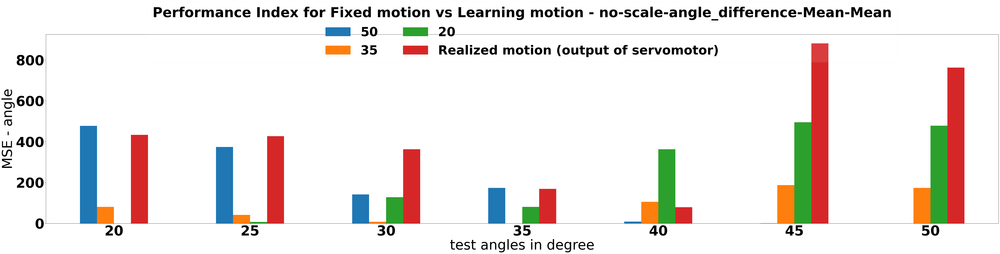

In [57]:
scaling = "no-scale"
func= "Mean"

for scaling in ["no-scale"]:#,"nz","mm"]:
    for funcvar in ["Mean"]:#func_var.keys():#
        for func in functions.keys():
            # fig, ax = plt.subplots(nrows=2, ncols=1)
            # ax =ax.reshape(-1)
            for kk_,k in enumerate(list(a_i.keys())):
                df_3d_sum_all= df_d_dict_agg[scaling][funcvar][func][k]
                print(scaling,funcvar,func,k)
                # display(df_3d_sum_all)
                # df_3d_sum_all.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\503520_MG_PRED_T_{}-{}-{}_.csv".format(scaling,func,k),index=True)
                # plt.subplot(2,1,kk_+1)
                # df_3a.reset_index().plot(x="test_angle",y=["50","35","20"],subplots=True,layout=(1,3),kind="bar",figsize=(90,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index")#.legend(title = "Adaptability Index for designated motion",ncol = 3)legend =True
                df_3d_sum_all.columns=["50","35","20","Realized motion (output of servomotor)","Generated motion (input of servomotor)","Train data"]#,"Motion Generation","Predicted"
                # # df1.columns =["Weight","Top-Bottom","Side-Bottom","Side-Side","6plate"]
                # if k 
                df_3d_sum_all.reset_index().plot(x="test_angle",y=["50","35","20","Realized motion (output of servomotor)"] ,kind="bar",legend =True,figsize=(75,15),rot=0,xlabel="test angles in degree",ylabel="MSE - "+k)#funcvar+"("+k+"_difference)^2")
                # if k == "current":ax=ax[kk_],
                plt.legend(title = "Performance Index for Fixed motion vs Learning motion - "+scaling+"-"+ k+"_difference-"+funcvar+"-"+func,ncol = 2,fontsize = 55, fancybox=True, framealpha=0.1,bbox_to_anchor=[0.5, 0.82],loc="lower center")
                plt.savefig("./mse1/Performance Index for Fixed motion vs Learning motion - "+scaling+"-"+ k+"_difference-"+funcvar+"-"+func+".pdf")
                # break
    #         break
    #     break
    # break


## min max

### find peaks

#### peaks for 1280

In [19]:
import numpy as np
import matplotlib.pyplot as plt
# from scipy import electrocardiogram
import scipy
# import scipy.datasets as electrocardiogram
from scipy.signal import find_peaks

In [58]:
#extreme diff min max peaks 1280

import numpy as np
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
# from scipy import electrocardiogram
import scipy
# import scipy.datasets as electrocardiogram
from scipy.signal import find_peaks
fontsize= 60
font = {'family' : 'normal',
            'weight' : 'bold',
            'size'   : fontsize}
plt.rc('font', **font)

def me(df):
    return df.mean()
def ma(df):
    return df.max()

def mdn(df):
    return df.median()
def md(df):
    return df.mode()
def mi(df):
    return df.min()
def inv(df):
    return df#.apply(lambda x: 1/x)
def no(df):
    return df
def va(df):
    return df.var()
def su(df):
    return df.sum()
def cone(df):
    return df.xs(5, level="cycle")
func_var = {'Mean': me,"Var":va,"Max":max, "Sum":su,}
functions = {
    'Mean': me,
    'Max': ma,
    'Median': mdn,
    # 'Mode': md,
    'Min' : mi,
    "1":cone
    # "Var": va,
}
def scale(data_,kk,SF="mm"):
    if SF == "mm":
        data_scale = (data_[kk]-data_[kk].min())/(data_[kk].max()-data_[kk].min())
    elif SF == "nz":
        data_scale =(data_[kk]-data_[kk].mean())/(data_[kk].std())
    else:
        data_scale = data_[kk]
    return data_scale
#make this example reproducible
np.random.seed(1)
df_d_dict={}
df_d_dict_agg={}
df_d_dict_={}
#create 3D dataset
xarray_3d = xr.Dataset(
    {"50": (("test_angle", "servo_values","cycle"), np.zeros((7,6,5)))},
    coords={
        "test_angle": ["20", "25", "30", "35", "40", "45", "50"],
        "servo_values": ["A1","A2","A3","C1","C2","C3"],
        "cycle":[1,2,3,4,5],
        "35": ("test_angle", np.zeros(7)),
        "20": ("test_angle", np.zeros(7)),
        "MG": ("test_angle", np.zeros(7)),
        "PRED": ("test_angle", np.zeros(7)),
        "AC": ("test_angle", np.zeros(7)),
    },
)
print(xarray_3d)
a_i = {"angle":["A1","A2","A3"],"current":["C1","C2","C3"]}
units  ={"angle":"Angle in degree","current":"Current in milli-ampere"}
from sklearn.metrics import mean_squared_error
def get_peaks(k,FA,TA,df_p,p=0.8,w=20):
    import numpy as np
    import matplotlib.pyplot as plt
    # from scipy import electrocardiogram
    import scipy
    # import scipy.datasets as electrocardiogram
    from scipy.signal import find_peaks
    x= np.array(df_p)#.reset_index()
    peaks, properties = find_peaks(x, prominence=p, width=w)
    # properties["prominences"], properties["widths"]
    # print("maxima",peaks)
    peaks_, properties_ = find_peaks(-1*x, prominence=p, width=w)
    # print("minima",peaks_)

    # properties["prominences"], properties["widths"]
    # (array([1.495, 2.3  ]), array([36.93773946, 39.32723577]))
    plt.figure(figsize=(35,20))
    plt.plot(x)
    plt.scatter(peaks, x[peaks], marker ="o",s=100,color = "orange",label = k + "-" + FA)
    plt.scatter(peaks_, x[peaks_], marker ="o",s=100)
    # for cycle,cy in enumerate(range(0,x.shape[0],1280)):
        # plt.plot(time_x,x1,lw=3,linestyle="--",label="Test_angle="+str(angles_list[d])+"_Designated_Motion="+des_angle_)#,,color=c
        # plt.plot(time_x,y1,lw=3,linestyle="-.",label="Test_angle="+str(angles_list[d])+"_Motion_Generation")#,color=c1 #
        # plt.plot(time_x,y1_,lw=3,label="Test_angle="+str(angles_list[d])+"_Predicted_Value")

    plt.plot([cy]*len(x),x,linestyle="-",color = "k")
    plt.annotate(
        "test angle="+TA,  # this is the text
        (
            cy,
        x.max()# max(x1d.max(),y1_d.max(),y1d.max()),
        ),  # these are the coordinates to position the label
        textcoords="offset points",
        fontsize=25,  # how to position the text
        xytext=(0, 0),  # distance from text to points (x,y)
        # rotation=90,
        # ha="center",
    ) 
    # plt.vlines(x=peaks, ymin=x[peaks] - properties["prominences"],
    #        ymax = x[peaks], color = "C1")
    # plt.hlines(y=properties["width_heights"], xmin=properties["left_ips"],
    #         xmax=properties["right_ips"], color = "C1")

    # plt.vlines(x=peaks_, ymin=(x[peaks_] - properties_["prominences"]),
    #         ymax = x[peaks_], color = "C1")
    # plt.hlines(y=properties_["width_heights"], xmin=properties_["left_ips"],
    #         xmax=properties_["right_ips"], color = "C1")
    # plt.show()
    plt.close()
    # plt.savefig("./peaks/data_mg"+k+".png")
    return x[peaks],x[peaks_]

# for df in 
p_ = [0.8,1,0.8]
# rms = mean_squared_error(y_actual, y_predicted, squared=False)
#convert xarray to DataFrame
df_d = xarray_3d.to_dataframe()
# print(df_d)
keyz= list(data_des.keys())
i="current"
j=0
df_diff=pd.DataFrame()
df_diff_=pd.DataFrame()
# i = "angle"
# j= 0
# funcvar="Max"
def peakmm(df_AC, df_p,k ,FA,TA, p):
    maxima,minima = get_peaks(k,FA,TA,df_p,p,50)
    min_val_diff = (minima - df_AC.min())**2
    max_val_diff = (maxima - df_AC.max())**2
    print(k,FA,TA,min_val_diff,df_AC.min(),max_val_diff,df_AC.max())
    return min_val_diff.mean()+max_val_diff.mean()

def minmax(actual,pred):

    min_val_diff = (pred.min() - actual.min())**2
    max_val_diff = (pred.max() - actual.max())**2

    return min_val_diff+max_val_diff
round_val=10
for scaling in ["no-scale"]:#,"mm","nz"]:
    df_d_dict[scaling]={}
    df_d_dict[scaling]={}
    df_d_dict_agg[scaling]={}
    df_d_dict_[scaling]={}
    # start_ang=[20,20,50,20]
    # agstep=[5,5,-5,5]
    # ss=[2,2,2,10]
    # data_des={}

        # load dataset
    for funcvar in ["Mean"]:#func_var.keys():#
        df_d_dict[scaling][funcvar]={}
        df_d_dict[scaling][funcvar]={}
        df_d_dict_agg[scaling][funcvar]={}
        df_d_dict_[scaling][funcvar]={}
        for ix,k in enumerate(keyz[:3]):
            # # for ix in range(len(des_dir)):
            # _dir=des_dir[ix]
            # csv_=find_csv_mg(mg_dir)
            # # print(csv_)
            # train_list=find_csv_filenames(_dir+r"\train\csv")
            # # print(len(train_list))
            # diff=7
            # test_list=find_csv_filenames(_dir+r"\test\csv")
            # # print(len(test_list))
            
            # angles_list= list(range(start_ang[ix],start_ang[ix]+diff*agstep[ix],agstep[ix])) #list(range(start_ang,start_ang+diff*5,5))
            # # print(angles_list, angles_list[0])
            # train_list =sorted(train_list)
            # tt_list=sorted(train_list+test_list)
            # print(len(tt_list))
            # trail=ss[ix]
            # print()
            # # print(tt_list,"len(angles_list)",len(angles_list))
            # angles_trails={}
            # for val in tt_list:
            #     # print(val)
            #     # print(int((val-tt_list[0])/trail),val,tt_list[0])
            #     angles_trails[val]=angles_list[int((val-tt_list[0])/trail)]
            # print(angles_trails)
            # limit_seq = -1
            print("k",k)
            angles_list= [20, 25, 30, 35, 40, 45, 50]
            angles_list.reverse()
            for i in a_i.keys():#["angle"]:#
                for j in range(3):
                    # des_angle_=des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4]

                        # for i in a_i.keys():
                    kk=a_i[i][j]
                    # print(kk,k,data_des[k].columns,data_des[k][kk].shape)
                    #     data_des[k].reset_index().plot(x="index",y= kk+"_",kind="scatter",label=k,legend =True,figsize=(60,16),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index for designated motion",ncol = 3)
                    #         # break
                    # print(data_mg.columns)
                    # plt.fig(figsize=(60,16))
                    # plt.figure(figsize=(75,30))
                    # x = data_des["20"]["d"+a_i[i][j]+"_"]
                    # ta = data_des["AC"]["d"+a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
                    # # print(q*t,(t+1)*q)
                    # y = data_mg["d"+a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
                    # y_= data_mg["d"+a_i[i][j]+"p"+"_"]#[:int(q*an)]
                    print(k,data_des[k].shape,data_mg.shape)
                    ta = scale(data_des["AC"],a_i[i][j]+"_",scaling)#data_des["AC"][a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
                    x1 =  scale(data_des[k],a_i[i][j]+"_",scaling)#data_des[k][a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
                    # print(q*t,(t+1)*q)
                    y1 =  scale(data_mg,a_i[i][j]+"_",scaling)#data_mg[a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
                    y1_=  scale(data_mg,a_i[i][j]+"p"+"_",scaling)#data_mg[a_i[i][j]+"p"+"_"]#[:int(q*an)]

                    # x1d=x1-ta
                    # y1d=y1-ta
                    # y1_d=y1_-ta
                    # df_diff_["DM"+k+"-Train"]=x1-ta
                    # df_diff_["MG-Train"]=y1-ta
                    # df_diff_["Pred-Train"]=y1_-ta
                    # df_diff_.plot(y=["DM"+k+"-Train","MG-Train","Pred-Train"],legend =True,figsize=(65,30),rot=0,xlabel="steps",ylabel="Angle Change")
                    # plt.legend(title = "difference in "+i + "-" + a_i[i][j]+ "- fixed angle"+k,ncol = 3,bbox_to_anchor=[0.5, 1],loc="lower center")
                    
                    # for cycle,cy in enumerate(range(0,x1.shape[0],1280)):
                    #     # plt.plot(time_x,x1,lw=3,linestyle="--",label="Test_angle="+str(angles_list[d])+"_Designated_Motion="+des_angle_)#,,color=c
                    #     # plt.plot(time_x,y1,lw=3,linestyle="-.",label="Test_angle="+str(angles_list[d])+"_Motion_Generation")#,color=c1 #
                    #     # plt.plot(time_x,y1_,lw=3,label="Test_angle="+str(angles_list[d])+"_Predicted_Value")

                    #     plt.plot([cy]*len(x1d),x1d,linestyle="-",color = "k")
                    #     plt.annotate(
                    #         "test angle="+str(angles_list[cycle]),  # this is the text
                    #         (
                    #             cy,
                    #             max(x1d.max(),y1_d.max(),y1d.max()),
                    #         ),  # these are the coordinates to position the label
                    #         textcoords="offset points",
                    #         fontsize=25,  # how to position the text
                    #         xytext=(0, 0),  # distance from text to points (x,y)
                    #         # rotation=90,
                    #         # ha="center",
                    #     ) 
                    # plt.savefig("./Angle_Diff/difference in "+i + "-" + a_i[i][j]+ "- fixed angle"+k+".pdf")
                    sq=1
                    ssq=2  
                    for d in range(an):
                            # fig =plt.figure(figsize=(60,35))
                            cy =0
                            qs=0
                            sq=1
                            # time_xx=time_x[d*q+qs:(1+d)*q-cy]
                            # xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                            # yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                            # yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                            # ta1=ta[d*q+qs:-1+(1+d)*q-cy]**sq

                            # display(df_diff)
                            # for cycle,cy in enumerate(range(0,q,256)):#percycle
                                # plt.figure(figsize=(35,20))
                            # qs=q-cy-256
                            # print(q,qs,cy)
                            print("range",d*q+qs,(1+d)*q-cy)
                            time_xx=time_x[d*q+qs:(1+d)*q-cy]
                            # xx=x[d*q+qs:(1+d)*q-cy]**sq
                            # yy=y[d*q+qs:-1+(1+d)*q-cy]**sq
                            # yy_=y_[d*q+qs:-1+(1+d)*q-cy]**sq
                            ta1=ta[d*q+qs:(1+d)*q-cy]**sq
                            xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                            yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                            yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                            # # # zz=[d*q+qs:(1+d)*q-cy]
                            # df_diff["xx1-ta1"]=np.array(xx1)-np.array(ta1)
                            # df_diff["yy1-ta1"]=np.array(yy1)-np.array(ta1)
                            # df_diff["yy1_-ta1"]=np.array(yy1_)-np.array(ta1)
                            # # # display(df_diff)

                            # # df_diff.plot(label="MG",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Angle Change").legend(title = "difference in "+i + "-" + a_i[i][j]+ "- fixed angle"+k,ncol = 3)
                            # fn_v =func_var[funcvar]
                            # var_i["DM"]=fn_v(df_diff["xx1-ta1"])
                            # # print(k,"var_i['DM']",var_i["DM"],"-------------------------------")
                            # var_i["MG"]=fn_v(df_diff["yy1-ta1"])
                            # var_i["PRED"]=fn_v(df_diff["yy1_-ta1"])
                            # fn_v =func_var[funcvar]
                            # xx1d=fn_v(xx1)-fn_v(ta1)
                            # yy1d=fn_v(yy1)-fn_v(ta1)
                            # yy1_d=fn_v(yy1_)-fn_v(ta1)peakmm
                            # xx1d=minmax(ta1, xx1)#xx1-ta1
                            # yy1d=minmax(ta1, yy1)#yy1-ta1
                            # yy1_d=minmax(ta1, yy1_)#yy1_-ta1
                                                            # yy1_d=fn_v(yy1_)-fn_v(ta1)peakmm
                            xx1d=peakmm(ta1, xx1,a_i[i][j],k,str(angles_list[d]),p_[j])#xx1-ta1
                            yy1d=peakmm(ta1, yy1,a_i[i][j],k,str(angles_list[d]),p_[j])#yy1-ta1
                            yy1_d=peakmm(ta1, yy1_,a_i[i][j],k,str(angles_list[d]),p_[j])
                            # # display(df_diff)

                            # df_diff.plot(label="MG",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Angle Change").legend(title = "difference in "+i + "-" + a_i[i][j]+ "- fixed angle"+k,ncol = 3)
                            
                            # var_i["DM"]=fn_v(xx1d**ssq)#fn_v(df_diff["xx1-ta1"])
                            # print(k,"var_i['DM']",var_i["DM"],xx1d,"-------------------------------")
                            # var_i["MG"]=fn_v(yy1d**ssq)#fn_v(df_diff["yy1-ta1"])
                            # var_i["PRED"]=fn_v(yy1_d**ssq)#fn_v(df_diff["yy1_-ta1"])
                            # print(ta1.shape,xx1.shape,yy1.shape,yy1_.shape)
                            # xx1d=mean_squared_error(ta1, xx1, squared=False)#xx1-ta1
                            # yy1d=mean_squared_error(ta1, yy1, squared=False)#yy1-ta1
                            # yy1_d=mean_squared_error(ta1, yy1_, squared=False)#yy1_-ta1
                            # # display(df_diff)

                            # df_diff.plot(label="MG",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Angle Change").legend(title = "difference in "+i + "-" + a_i[i][j]+ "- fixed angle"+k,ncol = 3)
                            
                            var_i["DM"]=xx1d#fn_v(xx1d**ssq)#fn_v(df_diff["xx1-ta1"])
                            print(k,"var_i['DM']",xx1d,"-------------------------------")
                            var_i["MG"]=yy1d#fn_v(yy1d**ssq)#fn_v(df_diff["yy1-ta1"])
                            var_i["PRED"]=yy1_d#fn_v(yy1_d**ssq)

                            var_i["des_ang"]=k#des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4]
                            var_i["servo_values"]= a_i[i][j]
                            # for iii in var_i.keys():
                            # print(var_i[iii],iii)
                            # print(q,d,angles_list[d],"shapes,tx,x,y",len(time_xx[qs:q]),xx[qs:q].shape,y[d*q:-1+(1+d)*q][qs:q].shape)
                            # plt.scatter(time_xx,xx,s=30,marker="o",label=str(angles_list[d])+"_Designated_Motion("+var_i["des_ang"]+")",alpha=0.6)#,,color=c
                            # plt.scatter(time_xx,yy,s=30,marker="d",label=str(angles_list[d])+"_MG",alpha=0.6)#,color=c1 #
                            # plt.scatter(time_xx,yy_,s=30,marker="d",label=str(angles_list[d])+"_Prediction",alpha=0.6)
                            # plt.plot(time_xx,xx1,lw=3,label=str(angles_list[d])+"_Designated_Motion("+var_i["des_ang"]+")",alpha=0.6)#,,color=c
                            # plt.plot(time_xx,yy1,lw=3,label=str(angles_list[d])+"_MG",alpha=0.6)#,color=c1 #
                            # plt.plot(time_xx,yy1_,lw=3,label=str(angles_list[d])+"_Prediction",alpha=0.6)

                            # plt.show()
                            df_d[var_i["des_ang"]][str(angles_list[d])][a_i[i][j]]=round(var_i["DM"],round_val)
                            # # # df_3d[var_i["des_ang"]][]["C1"]=0.008
                            # # # df_3d[var_i["des_ang"]][]["C1"]=0.008
                            df_d["MG"][str(angles_list[d])][a_i[i][j]]=round(var_i["MG"],round_val)
                            df_d["PRED"][str(angles_list[d])][a_i[i][j]]=round(var_i["PRED"],round_val)
            #         break
            #     break
            # break
        # break
    # break

                                # df_3d["PRED"][str(angles_list[d])][a_i[i][j]]=round(var_i["PRED"],2)
        df_d_dict[scaling][funcvar]=df_d
        # df_3d.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\503520_MG_PRED_AC_{}_.csv".format(scaling),index=True)
        df_d_dict_agg[scaling][funcvar] = {}
        df_d_dict_[scaling][funcvar]={}
        # display(df_3d_dict)
            # df_3d.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\50-35-20_MG_PRED_AC_qs_Cycle_ang_cur_nz.csv",index=True)
        for func in functions.keys():
            df_d_dict_agg[scaling][funcvar][func]={}
            df_d_dict_[scaling][funcvar][func]={}

            f=functions[func]
            if func == "1":
                pass
                # df_d_=f(df_d)
                # print(df_d_)
            else:
                df_d_=f(df_d.groupby(level=["test_angle","servo_values"]))
            # display(df_3d_)
            ##plot
            df_d_SV={}
            df_d_SV_sum={}
            # df_3d_dict_={}

            # df_count = df_3d_.groupby(level=["test_angle","servo_values"]).apply(lambda x: x if "A" in x)
            for k_ in list(a_i.keys()):
                df_d_SV[k_]=df_d_[df_d_.index.get_level_values('servo_values').isin(a_i[k_])]#.xs(2, item=["A1","A2","A3"])
                df_d_SV_sum[k_]=(df_d_SV[k_].groupby(level=["test_angle"])).sum()
                # df_3d_SV_sum[k].to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\tool\DM_ML\DI\sumC\50-35-20_{}_{}_{}.csv".format(k,scaling,func),index=True)
                
                # df_3d_SV_sum[k]=df_3d_SV_sum[k].apply(lambda x: 1/x)
                df_d_dict_[scaling][funcvar][func][k_]=df_d_SV[k_]
                df_d_dict_agg[scaling][funcvar][func][k_]=df_d_SV_sum[k_]

                df_a= df_d_dict_agg[scaling][funcvar][func][k_]#.unstack()
                # print(scaling,func,k_,df_a)

<xarray.Dataset>
Dimensions:       (test_angle: 7, servo_values: 6, cycle: 5)
Coordinates:
  * test_angle    (test_angle) <U2 '20' '25' '30' '35' '40' '45' '50'
  * servo_values  (servo_values) <U2 'A1' 'A2' 'A3' 'C1' 'C2' 'C3'
  * cycle         (cycle) int32 1 2 3 4 5
    35            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    20            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    MG            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    PRED          (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
    AC            (test_angle) float64 0.0 0.0 0.0 0.0 0.0 0.0 0.0
Data variables:
    50            (test_angle, servo_values, cycle) float64 0.0 0.0 ... 0.0 0.0
k 20
20 (8960, 20) (8960, 63)
range 0 1280
A1 20 50 [243.07942132 243.07942132 243.07942132 243.07942132 243.07942132] 15.591004499999999 [0. 0. 0. 0.] 76.51516319999999
A1 20 50 [23.03090816 36.15163438 21.72143024 36.37623181 21.69803703 35.86327463] 15.591004499999999 [ 93.47786574   8.89401738 

C:\Users\81809\AppData\Local\Temp\ipykernel_340\3458325489.py:150: RuntimeWarning: Mean of empty slice.
  return min_val_diff.mean()+max_val_diff.mean()
c:\Users\81809\anaconda3\envs\3dof\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


C3 20 40 [] -442.0 [  225. 10816.  9801. 16900. 11449.] 243.0
C3 20 40 [3295.89450438 2247.58402085 2083.75755697 2171.07707519] -442.0 [11862.51232459 12738.47846569 12750.68821049 12723.90609384
 12596.69193687] 243.0
20 var_i['DM'] nan -------------------------------
range 3840 5120
C3 20 35 [] -800.0 [1225. 1600. 1521. 1369.] 291.0
C3 20 35 [] -800.0 [ 169. 5776. 2401. 5329. 2916.] 291.0
C3 20 35 [94137.65546328 99879.89815821 99019.79096241 98058.58003831
 98664.45023076] -800.0 [24737.56439621 25773.26091981 25817.39316586 25646.19269377
 25678.90836868] 291.0
20 var_i['DM'] nan -------------------------------
range 5120 6400
C3 20 30 [] -730.0 [ 400. 2601. 2916. 3136. 3600.] 312.0
C3 20 30 [207936. 199809.] -730.0 [ 784. 3025. 4761. 3969. 4900.] 312.0
C3 20 30 [58672.00739423 62590.13562372 63318.18153981 62750.7239694
 62719.72096876] -730.0 [31665.53345324 32540.16102129 32608.98826814 32250.29783473
 32367.2690127 ] 312.0
20 var_i['DM'] nan -------------------------------
ran

In [59]:
df_d_dict_["no-scale"]["Mean"]["1"]["angle"]

50          35           20          MG        PRED   AC
test_angle servo_values                                                                   
20         A1             194.463537   12.676301     0.000000  159.086923  159.089920  0.0
           A2            1030.092589  203.587636     0.000000  247.031041  247.025473  0.0
           A3               1.015504    0.002344     0.000000    0.002910    0.002927  0.0
25         A1             210.689420    6.172836     1.157475  114.739192  114.742629  0.0
           A2             784.058779  103.518579    16.760884  126.607809  126.604343  0.0
           A3               2.478552    0.268537     0.321058    0.313789    0.313663  0.0
30         A1             180.614368    1.984321     4.629899   93.565755   93.567455  0.0
           A2             190.045839   16.329117   335.232081    9.410480    9.411810  0.0
           A3               6.355938    2.146116     2.290308    2.267411    2.267013  0.0
35         A1             144.735941    0.000000    12.676301   62.528928   62.530358  0.0
           A2             317.789150    0.000000   203.587636    1.155120    1.154994  0.0
           A3               1.115423    0.000000     0.002344    0.003628    0.003638  0.0
40         A1              11.135296   75.579829   150.161629   12.163149   12.161192  0.0
           A2              12.450045  204.437934   816.050255  190.252563  190.258686  0.0
           A3               0.000006    1.110127     1.010451    1.081608    1.081936  0.0
45         A1               2.057733  181.309056   289.867122   30.741729   30.740498  0.0
           A2               0.000000  317.789150  1030.092589   99.344624   99.348080  0.0
           A3               0.000000    1.115423     1.015504    0.444112    0.444327  0.0
50         A1               0.000000  144.735941   243.079421  100.025945  100.024783  0.0
           A2               0.000000  317.789150  1030.092589    9.798297    9.800187  0.0
           A3               0.000000    1.115423     1.015504    0.039227    0.039295  0.0

A1
maxima [ 219  427  635  846 1054 1280 1496 1714 1980 2243 2518 2560 2824 3080
 3334 3588 3840 4094 4342 4590 4837 5084 5120 5369 5613 5858 6102 6347
 6400 6649 6894 7140 7384 7629 7680 7929 8175 8422 8670 8916]
minima [ 122  297  546  717  965 1137 1400 1586 1828 2094 2395 2709 2970 3226
 3480 3734 3988 4238 4487 4734 4981 5268 5514 5758 6003 6248 6548 6795
 7041 7286 7530 7831 8080 8325 8574 8819]


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


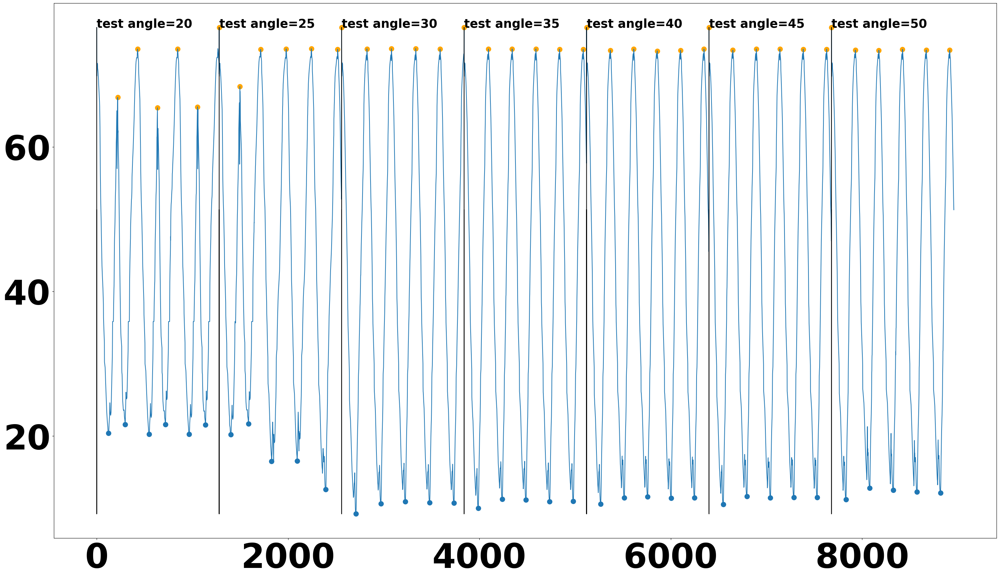

A2
maxima [ 119  297  543  717  963 1136 1384 1586 1849 2114 2396 2710 2971 3227
 3481 3735 3988 4240 4488 4736 4982 5269 5515 5760 6005 6249 6549 6797
 7043 7287 7531 7832 8081 8327 8575 8820]
minima [ 219  426  635  845 1053 1280 1496 1712 1980 2243 2517 2560 2824 3080
 3334 3588 3840 4094 4342 4590 4837 5120 5368 5613 5857 6102 6347 6400
 6648 6894 7140 7384 7629 7680 7929 8174 8422 8669 8914]


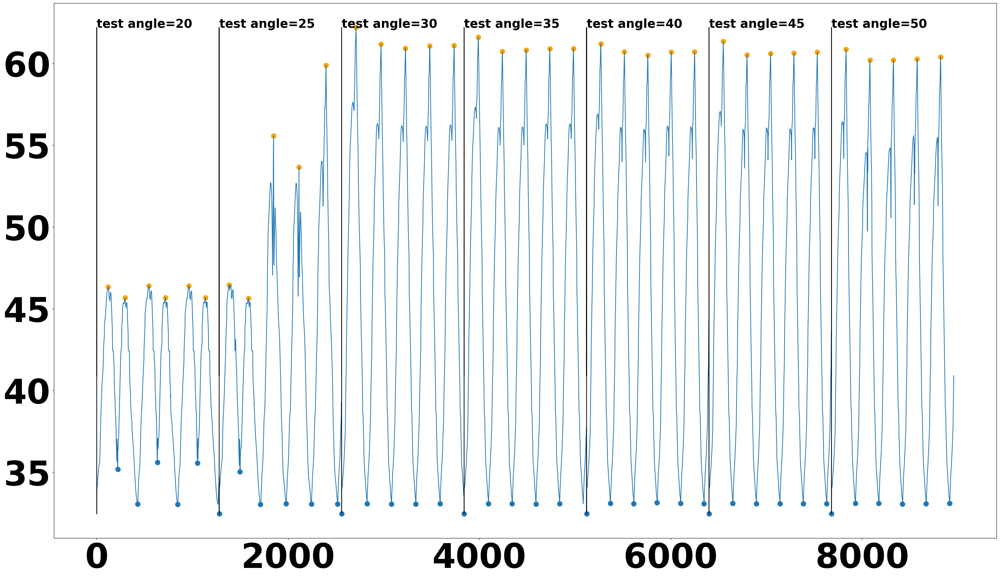

A3
maxima [ 119  297  543  717  962 1136 1398 1586 1864 2130 2396 2710 2971 3227
 3481 3735 3989 4240 4488 4736 4983 5269 5515 5760 6005 6249 6549 6797
 7043 7287 7531 7832 8081 8327 8575 8820]
minima [ 219  426  635  845 1053 1280 1496 1712 1980 2243 2560 2824 3080 3334
 3588 3840 4094 4342 4590 4837 5120 5368 5613 5857 6102 6400 6648 6894
 7140 7384 7680 7929 8174 8422 8669]


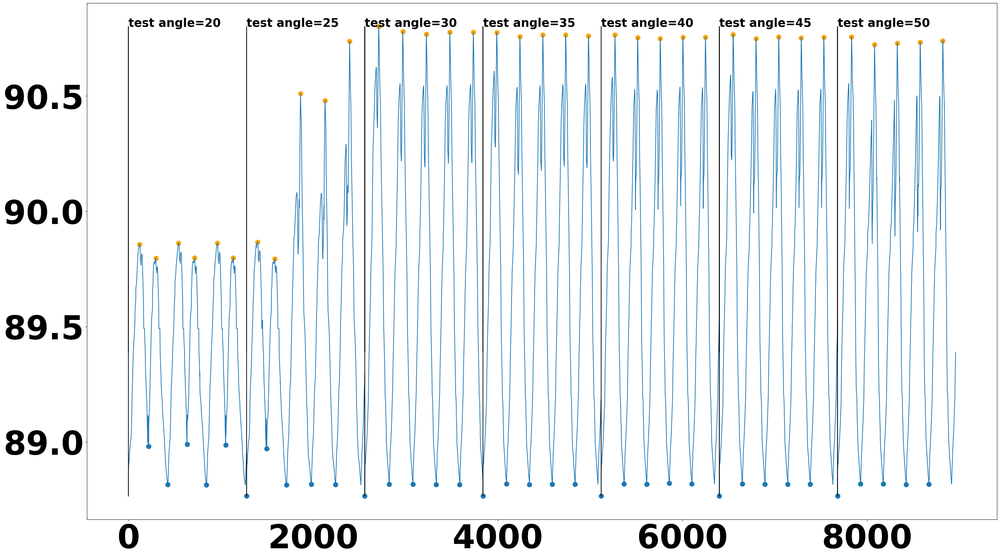

C1
maxima [ 165  330  775 1183 1633 2414 2735 2993 3232 3503 3757 4012 4261 4509
 4757 5004 5305 5536 5780 6026 6270 6817 7063 7308 7552 7856 8597]
minima [ 460  879 1316 1516 1740 2007 2270 2580 2902 3108 3363 3666 3922 4171
 4399 4667 4894 5202 5446 5642 5915 6180 6376 6482 6726 6972 7462 7658
 7721 7986 8253 8501 8748]


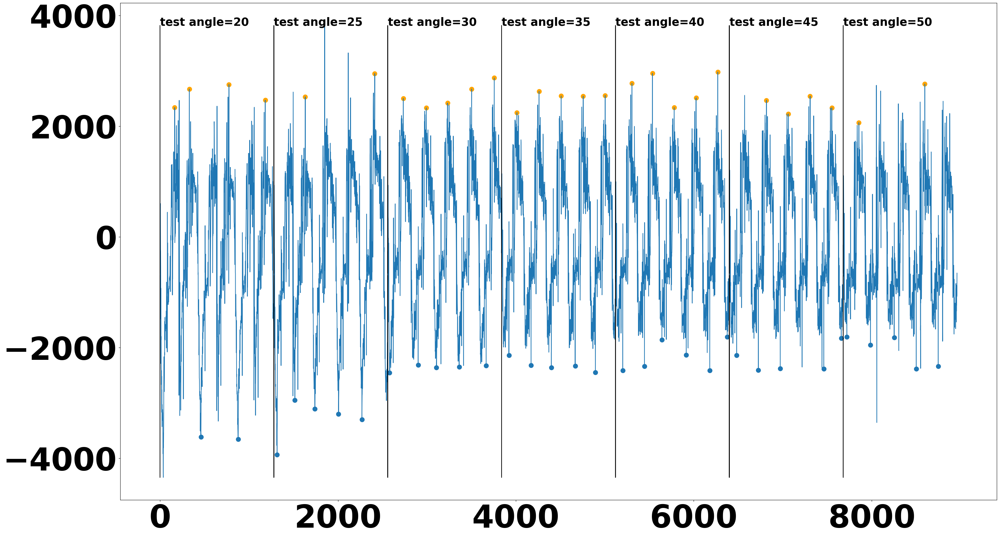

C2
maxima [ 262  459  654  878 1074 1349 1549 1790 1793 2051 2320 2641 2904 3157
 3411 3668 3921 4150 4419 4666 4888 5172 5418 5669 5906 6151 6454 6706
 6943 7190 7434 7762 7985 8232 8471 8726]
minima [ 843 1264 1706 1978 2210 2517 2824 3080 3334 3588 3805 4094 4342 4590
 4837 5084 5368 5613 5820 6065 6347 6613 6894 7140 7384 7629 7875 8104
 8600 8876]


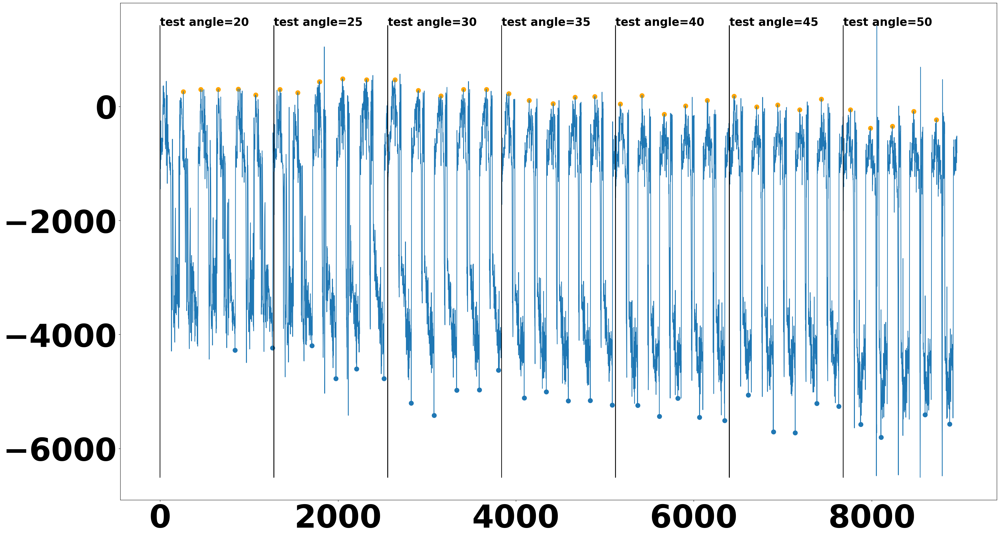

C3
maxima [ 224  438  637  858 1724 1878 1991 2254 2528 2571 2834 3090 3344 3598
 3849 4104 4352 4600 4847 5094 5129 5378 5623 5867 6112 6357 6404 6658
 6903 7150 7394 7639 7689 7939 8080 8185 8327 8432 8553 8679]
minima [ 845 1877 2142 2400 5521 6255 6802 7049 7293 7839 8106 8353 8619 8863]


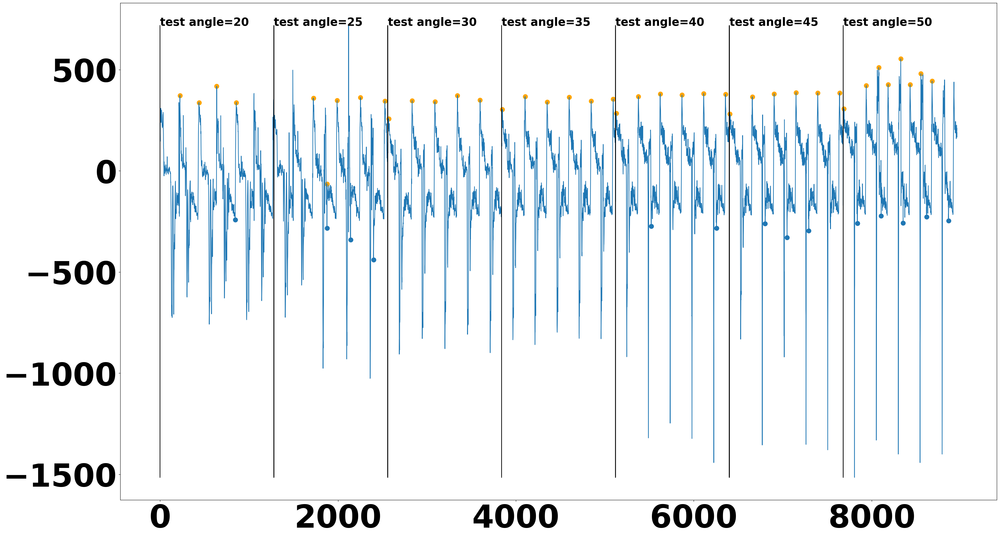

In [22]:
import numpy as np
import matplotlib.pyplot as plt
# from scipy import electrocardiogram
import scipy
# import scipy.datasets as electrocardiogram
from scipy.signal import find_peaks
from scipy.signal import find_peaks
i = "angle"
j= 0
x =  data_mg[a_i[i][j]+"_"]#electrocardiogram()[2000:4000]
# x = electrocardiogram()[17000:18000]
def get_peaks(k,df_p,p=0.8,w=20):
    x= df_p[k]
    peaks, properties = find_peaks(x, prominence=p, width=w)
    # properties["prominences"], properties["widths"]
    print("maxima",peaks)
    peaks_, properties_ = find_peaks(-1*x, prominence=p, width=w)
    print("minima",peaks_)

    # properties["prominences"], properties["widths"]
    # (array([1.495, 2.3  ]), array([36.93773946, 39.32723577]))
    plt.figure(figsize=(35,20))
    plt.plot(x)
    plt.scatter(peaks, x[peaks], marker ="o",s=100,color = "orange")
    plt.scatter(peaks_, x[peaks_], marker ="o",s=100)
    for cycle,cy in enumerate(range(0,x.shape[0],1280)):
        # plt.plot(time_x,x1,lw=3,linestyle="--",label="Test_angle="+str(angles_list[d])+"_Designated_Motion="+des_angle_)#,,color=c
        # plt.plot(time_x,y1,lw=3,linestyle="-.",label="Test_angle="+str(angles_list[d])+"_Motion_Generation")#,color=c1 #
        # plt.plot(time_x,y1_,lw=3,label="Test_angle="+str(angles_list[d])+"_Predicted_Value")

        plt.plot([cy]*len(x),x,linestyle="-",color = "k")
        plt.annotate(
            "test angle="+str(angles_list[cycle]),  # this is the text
            (
                cy,
            x.max()# max(x1d.max(),y1_d.max(),y1d.max()),
            ),  # these are the coordinates to position the label
            textcoords="offset points",
            fontsize=25,  # how to position the text
            xytext=(0, 0),  # distance from text to points (x,y)
            # rotation=90,
            # ha="center",
        ) 
    # plt.vlines(x=peaks, ymin=x[peaks] - properties["prominences"],
    #        ymax = x[peaks], color = "C1")
    # plt.hlines(y=properties["width_heights"], xmin=properties["left_ips"],
    #         xmax=properties["right_ips"], color = "C1")

    # plt.vlines(x=peaks_, ymin=(x[peaks_] - properties_["prominences"]),
    #         ymax = x[peaks_], color = "C1")
    # plt.hlines(y=properties_["width_heights"], xmin=properties_["left_ips"],
    #         xmax=properties_["right_ips"], color = "C1")
    plt.show()
    # plt.savefig("./peaks/data_mg"+k+".png")
    return x[peaks],x[peaks_]

# for df in 
p_ = [0.8,1,0.8]
for i in a_i.keys():
    for j in range(3):
        print(a_i[i][j])
        get_peaks(a_i[i][j]+"_",data_mg,p_[j],50)
# _,__=get_peaks("A2_",data_mg,1,50)

no-scale Mean Mean angle


,50,35,20,Realized motion (output of servomotor),Generated motion (input of servomotor),Train data
test_angle,,,,,,
20,1225.571630,216.266281,0.000000,406.120874,406.118320,0.0
25,997.226751,109.959952,18.239417,241.660789,241.660636,0.0
30,377.016145,20.459553,342.152288,105.243646,105.246278,0.0
35,463.640514,0.000000,216.266281,63.687675,63.688989,0.0
40,23.585348,281.127890,967.222335,203.497321,203.501815,0.0
45,2.057733,500.213629,1320.975215,130.530465,130.532906,0.0
50,0.000000,463.640514,1274.187514,109.863469,109.864265,0.0


no-scale Mean Mean current


,50,35,20,MG,PRED,AC
test_angle,,,,,,
20,4.617369e+06,966647.15,50677.70,1.767089e+06,4.205663e+06,0.0
25,4.361816e+06,475194.05,120925.45,1.170723e+06,2.657520e+06,0.0
30,1.745218e+06,355277.70,2989074.90,1.915373e+06,9.910966e+05,0.0
35,2.198275e+06,64606.05,1593868.25,4.599051e+05,1.742633e+06,0.0
40,2.289915e+05,1211840.95,4759167.65,1.746475e+06,2.379877e+06,0.0
45,6.465289e+05,1154401.05,7070556.60,2.295883e+06,6.079480e+06,0.0
50,7.863558e+05,1541527.10,17610836.20,2.413123e+06,9.589450e+06,0.0


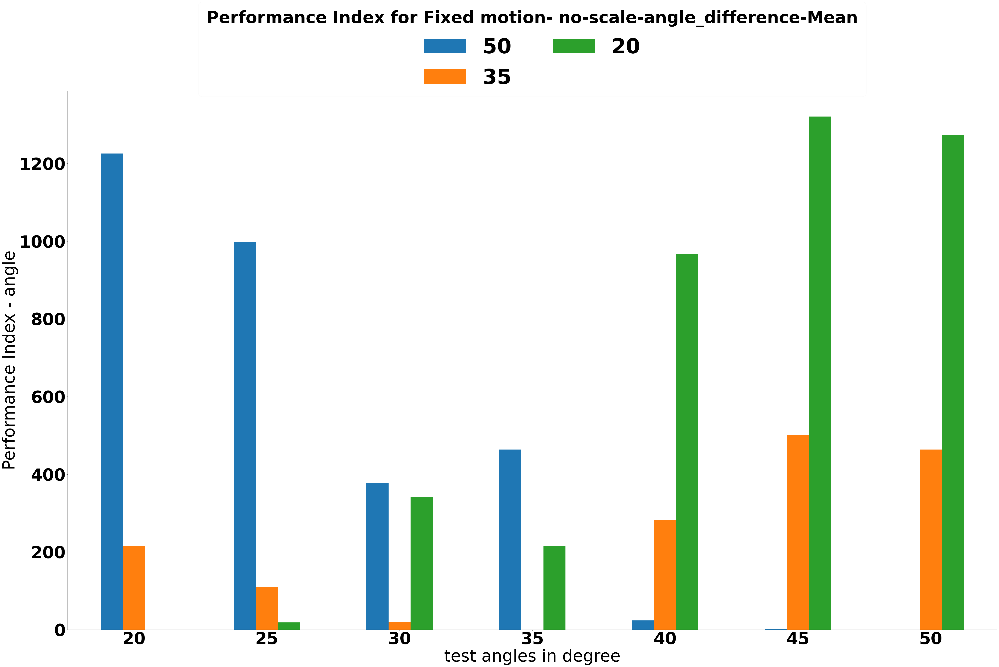

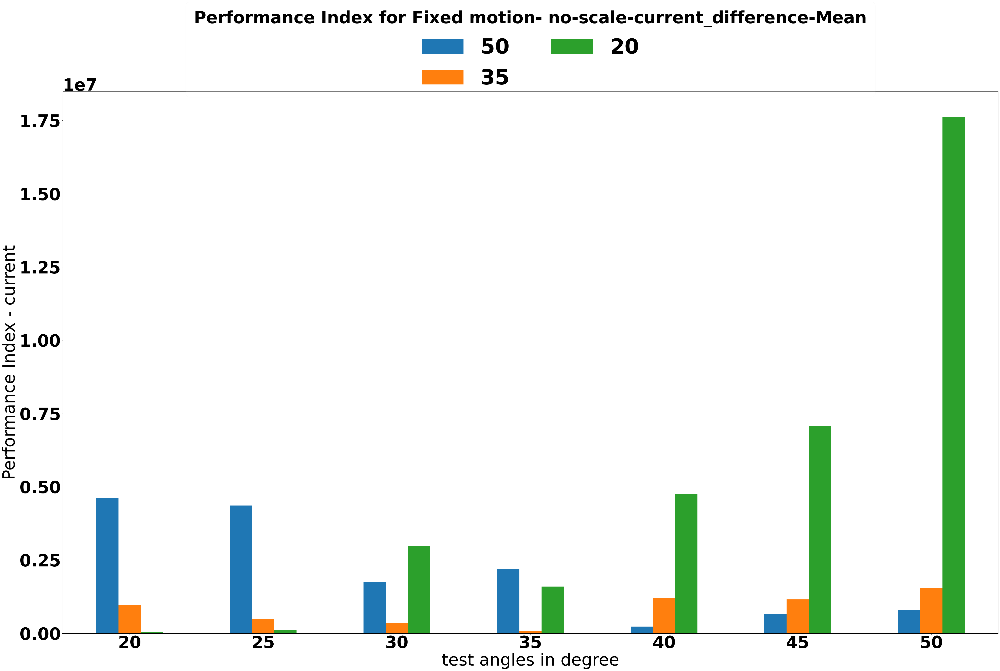

In [61]:
#bar plots for peaks 1280 only DM
scaling = "no-scale"
func= "Mean"

for scaling in ["no-scale"]:#,"nz","mm"]:
    for funcvar in ["Mean"]:#func_var.keys():#
        for func in functions.keys():
            # fig, ax = plt.subplots(nrows=2, ncols=1)
            # ax =ax.reshape(-1)
            for kk_,k in enumerate(list(a_i.keys())):
                df_3d_sum_all= df_d_dict_agg[scaling][funcvar][func][k]
                print(scaling,funcvar,func,k)
                display(df_3d_sum_all)
                # df_3d_sum_all.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\503520_MG_PRED_T_{}-{}-{}_.csv".format(scaling,func,k),index=True)
                # plt.subplot(2,1,kk_+1)
                # df_3a.reset_index().plot(x="test_angle",y=["50","35","20"],subplots=True,layout=(1,3),kind="bar",figsize=(90,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index")#.legend(title = "Adaptability Index for designated motion",ncol = 3)legend =True
                df_3d_sum_all.columns=["50","35","20","Realized motion (output of servomotor)","Generated motion (input of servomotor)","Train data"]#,"Motion Generation","Predicted"
                # # df1.columns =["Weight","Top-Bottom","Side-Bottom","Side-Side","6plate"]
                # if k 
                df_3d_sum_all.reset_index().plot(x="test_angle",y=["50","35","20"] ,kind="bar",legend =True,figsize=(60,35),rot=0,xlabel="test angles in degree",ylabel="Performance Index - "+k)#funcvar+"("+k+"_difference)^2")
                # if k == "current":ax=ax[kk_],,"Realized motion (output of servomotor)"
                plt.legend(title = "Performance Index for Fixed motion- "+scaling+"-"+ k+"_difference-"+funcvar,ncol = 2,fontsize = 75, fancybox=True, framealpha=0.1,bbox_to_anchor=[0.5,0.97],loc="lower center")
                # plt.savefig("./peaks/bar/Performance Index for Fixed motion- "+scaling+"-"+ k+"_difference-"+funcvar+"-"+func+".pdf")#+"-"+func
                # break
            break
    #     break
    # break


no-scale Mean Mean angle


,50,35,20,Realized motion (output of servomotor),Generated motion (input of servomotor),Train data
test_angle,,,,,,
20,1225.571630,216.266281,0.000000,406.120874,406.118320,0.0
25,997.226751,109.959952,18.239417,241.660789,241.660636,0.0
30,377.016145,20.459553,342.152288,105.243646,105.246278,0.0
35,463.640514,0.000000,216.266281,63.687675,63.688989,0.0
40,23.585348,281.127890,967.222335,203.497321,203.501815,0.0
45,2.057733,500.213629,1320.975215,130.530465,130.532906,0.0
50,0.000000,463.640514,1274.187514,109.863469,109.864265,0.0


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


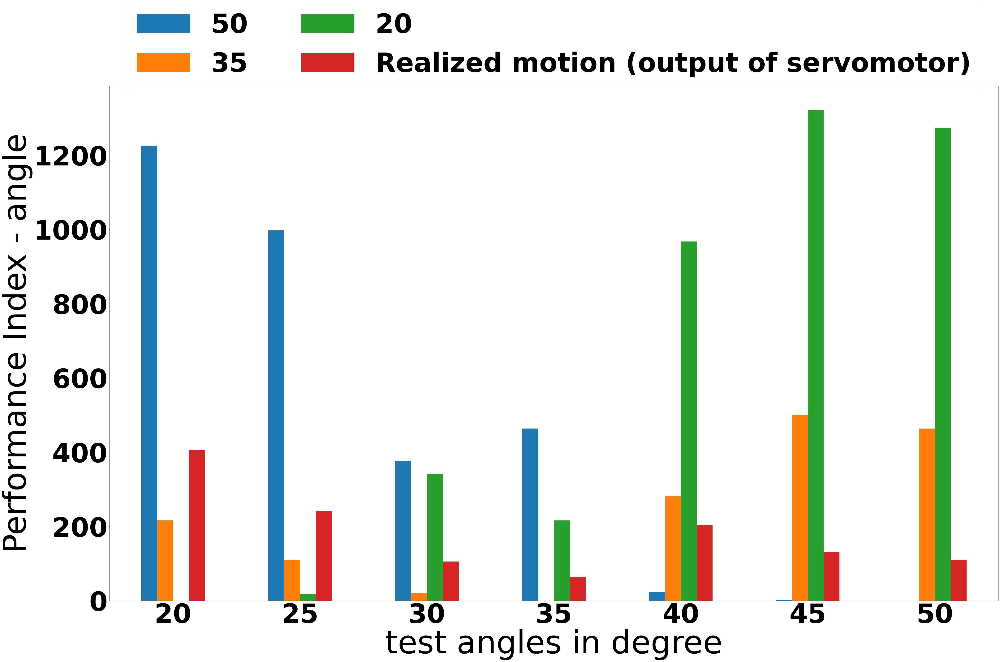

In [71]:
#bar plots for peaks 1280
scaling = "no-scale"
func= "Mean"

for scaling in ["no-scale"]:#,"nz","mm"]:
    for funcvar in ["Mean"]:#func_var.keys():#
        for func in functions.keys():
            # fig, ax = plt.subplots(nrows=2, ncols=1)
            # ax =ax.reshape(-1)
            for kk_,k in enumerate(list(a_i.keys())):
                df_3d_sum_all= df_d_dict_agg[scaling][funcvar][func][k]
                print(scaling,funcvar,func,k)
                display(df_3d_sum_all)
                df_3d_sum_all.to_csv("./peaks/Performance Index for Fixed motion vs Learning motion - "+scaling+"-"+ k+"_difference-"+funcvar+"-"+func+".csv")#r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\503520_MG_PRED_T_{}-{}-{}_.csv".format(scaling,func,k),index=True)
                # plt.subplot(2,1,kk_+1)
                # df_3a.reset_index().plot(x="test_angle",y=["50","35","20"],subplots=True,layout=(1,3),kind="bar",figsize=(90,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index")#.legend(title = "Adaptability Index for designated motion",ncol = 3)legend =True
                df_3d_sum_all.columns=["50","35","20","Realized motion (output of servomotor)","Generated motion (input of servomotor)","Train data"]#,"Motion Generation","Predicted"
                # # df1.columns =["Weight","Top-Bottom","Side-Bottom","Side-Side","6plate"]
                # if k 
                df_3d_sum_all.reset_index().plot(x="test_angle",y=["50","35","20","Realized motion (output of servomotor)"] ,kind="bar",legend =True,figsize=(60,35),rot=0,xlabel="test angles in degree",ylabel="Performance Index - "+k,fontsize=100)#funcvar+"("+k+"_difference)^2")
                # if k == "current":ax=ax[kk_],
                plt.legend(ncol = 2,fontsize = 100, fancybox=True, framealpha=0.1,bbox_to_anchor=[0.5, 0.97],loc="lower center")#title = "Performance Index for Fixed motion vs Learning motion ",
                plt.savefig("./peaks/Performance Index for Fixed motion vs Learning motion - "+scaling+"-"+ k+"_difference-"+funcvar+"-"+func+".pdf")#+"-"+func
                break
            break
        break
    break


,test_angle,50,35,20,Realized motion (output of servomotor),Generated motion (input of servomotor),Train data
0,20,1225.571630,216.266281,0.000000,406.120874,406.118320,0.0
1,25,997.226751,109.959952,18.239417,241.660789,241.660636,0.0
2,30,377.016145,20.459553,342.152288,105.243646,105.246278,0.0
3,35,463.640514,0.000000,216.266281,63.687675,63.688989,0.0
4,40,23.585348,281.127890,967.222335,203.497321,203.501815,0.0
5,45,2.057733,500.213629,1320.975215,130.530465,130.532906,0.0
6,50,0.000000,463.640514,1274.187514,109.863469,109.864265,0.0


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


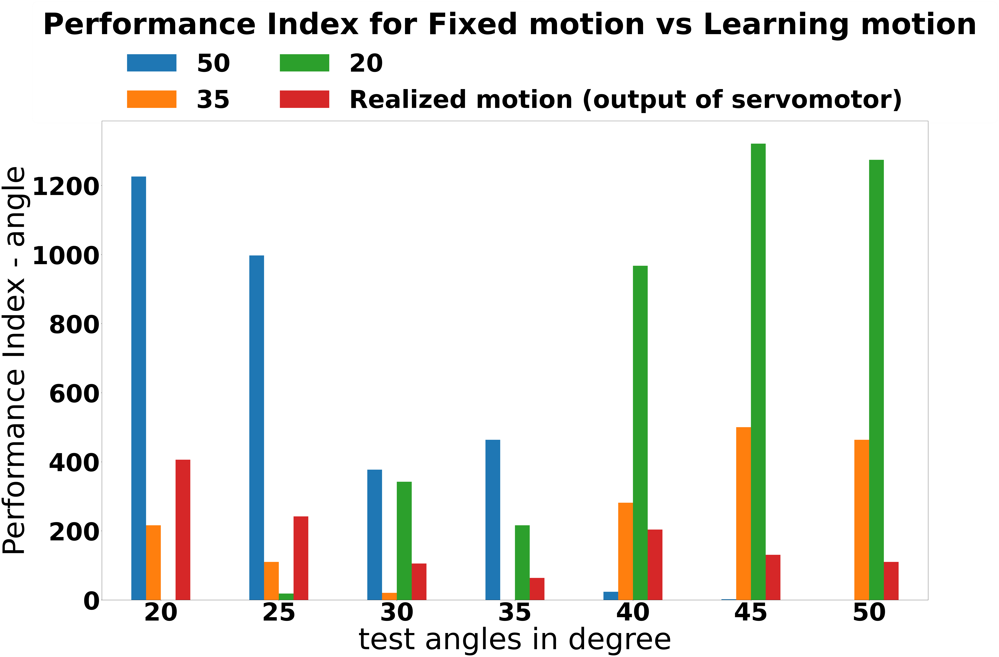

In [73]:
# df_3d_sum_all= df_d_dict_agg[scaling][funcvar][func][k]
scaling="no-scale"
funcvar="Mean"
func="Mean"
k="angle"

#################
font = {'family' : 'normal',
            'weight' : 'bold',
            'size'   : 120}
plt.rc('font', **font)
#################
# print(scaling,funcvar,func,k)
# display(df_3d_sum_all)
import pandas as pd
df_3d_sum_all= pd.read_csv("./peaks/Performance Index for Fixed motion vs Learning motion - "+scaling+"-"+ k+"_difference-"+funcvar+"-"+func+".csv")#r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\503520_MG_PRED_T_{}-{}-{}_.csv".format(scaling,func,k),index=True)
display(df_3d_sum_all)
# plt.subplot(2,1,kk_+1)
# df_3a.reset_index().plot(x="test_angle",y=["50","35","20"],subplots=True,layout=(1,3),kind="bar",figsize=(90,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index")#.legend(title = "Adaptability Index for designated motion",ncol = 3)legend =True
# df_3d_sum_all.columns=["test_angle","50","35","20","Realized motion (output of servomotor)","Generated motion (input of servomotor)","Train data"]#,"Motion Generation","Predicted"
df_3d_sum_all.plot(x="test_angle",y=["50","35","20","Realized motion (output of servomotor)"] ,kind="bar",legend =True,figsize=(60,35),rot=0,xlabel="test angles in degree",ylabel="Performance Index - "+k,fontsize=100)#funcvar+"("+k+"_difference)^2")
# if k == "current":ax=ax[kk_],
plt.legend(title = "Performance Index for Fixed motion vs Learning motion ",ncol = 2,fontsize = 100, fancybox=True, framealpha=0.1,bbox_to_anchor=[0.5, 0.97],loc="lower center")
# plt.savefig("./peaks/Performance Index for Fixed motion vs Learning motion - "+scaling+"-"+ k+"_difference-"+funcvar+"-"+func+".pdf")#+"-"+func
               

### min max calc

In [ ]:
#extreme diff min max

import numpy as np
import xarray as xr
fontsize= 60
font = {'family' : 'normal',
            'weight' : 'bold',
            'size'   : fontsize}
plt.rc('font', **font)

def me(df):
    return df.mean()
def ma(df):
    return df.max()

def mdn(df):
    return df.median()
def md(df):
    return df.mode()
def mi(df):
    return df.min()
def inv(df):
    return df#.apply(lambda x: 1/x)
def no(df):
    return df
def va(df):
    return df.var()
def su(df):
    return df.sum()
def cone(df):
    return df.xs(5, level="cycle")
func_var = {'Mean': me,"Var":va,"Max":max, "Sum":su,}
functions = {
    'Mean': me,
    'Max': ma,
    'Median': mdn,
    # 'Mode': md,
    'Min' : mi,
    "1":cone
    # "Var": va,
}
def scale(data_,kk,SF="mm"):
    if SF == "mm":
        data_scale = (data_[kk]-data_[kk].min())/(data_[kk].max()-data_[kk].min())
    elif SF == "nz":
        data_scale =(data_[kk]-data_[kk].mean())/(data_[kk].std())
    else:
        data_scale = data_[kk]
    return data_scale
#make this example reproducible
np.random.seed(1)
df_d_dict={}
df_d_dict_agg={}
df_d_dict_={}
#create 3D dataset
xarray_3d = xr.Dataset(
    {"50": (("test_angle", "servo_values","cycle"), np.zeros((7,6,5)))},
    coords={
        "test_angle": ["20", "25", "30", "35", "40", "45", "50"],
        "servo_values": ["A1","A2","A3","C1","C2","C3"],
        "cycle":[1,2,3,4,5],
        "35": ("test_angle", np.zeros(7)),
        "20": ("test_angle", np.zeros(7)),
        "MG": ("test_angle", np.zeros(7)),
        "PRED": ("test_angle", np.zeros(7)),
        "AC": ("test_angle", np.zeros(7)),
    },
)
print(xarray_3d)
a_i = {"angle":["A1","A2","A3"],"current":["C1","C2","C3"]}
units  ={"angle":"Angle in degree","current":"Current in milli-ampere"}
from sklearn.metrics import mean_squared_error

# rms = mean_squared_error(y_actual, y_predicted, squared=False)
#convert xarray to DataFrame
df_d = xarray_3d.to_dataframe()
# print(df_d)
keyz= list(data_des.keys())
i="current"
j=0
df_diff=pd.DataFrame()
df_diff_=pd.DataFrame()
# i = "angle"
# j= 0
# funcvar="Max"
def minmax(actual,pred):
    min_val_diff = (pred.min() - actual.min())**2
    max_val_diff = (pred.max() - actual.max())**2

    return min_val_diff+max_val_diff
round_val=10
for scaling in ["no-scale","mm","nz"]:
    df_d_dict[scaling]={}
    df_d_dict[scaling]={}
    df_d_dict_agg[scaling]={}
    df_d_dict_[scaling]={}
    # start_ang=[20,20,50,20]
    # agstep=[5,5,-5,5]
    # ss=[2,2,2,10]
    # data_des={}

        # load dataset
    for funcvar in ["Mean"]:#func_var.keys():#
        df_d_dict[scaling][funcvar]={}
        df_d_dict[scaling][funcvar]={}
        df_d_dict_agg[scaling][funcvar]={}
        df_d_dict_[scaling][funcvar]={}
        for ix,k in enumerate(keyz[:3]):
            # # for ix in range(len(des_dir)):
            # _dir=des_dir[ix]
            # csv_=find_csv_mg(mg_dir)
            # # print(csv_)
            # train_list=find_csv_filenames(_dir+r"\train\csv")
            # # print(len(train_list))
            # diff=7
            # test_list=find_csv_filenames(_dir+r"\test\csv")
            # # print(len(test_list))
            
            # angles_list= list(range(start_ang[ix],start_ang[ix]+diff*agstep[ix],agstep[ix])) #list(range(start_ang,start_ang+diff*5,5))
            # # print(angles_list, angles_list[0])
            # train_list =sorted(train_list)
            # tt_list=sorted(train_list+test_list)
            # print(len(tt_list))
            # trail=ss[ix]
            # print()
            # # print(tt_list,"len(angles_list)",len(angles_list))
            # angles_trails={}
            # for val in tt_list:
            #     # print(val)
            #     # print(int((val-tt_list[0])/trail),val,tt_list[0])
            #     angles_trails[val]=angles_list[int((val-tt_list[0])/trail)]
            # print(angles_trails)
            # limit_seq = -1
            print("k",k)
            angles_list= [20, 25, 30, 35, 40, 45, 50]
            angles_list.reverse()
            for i in a_i.keys():#["angle"]:#
                for j in range(3):
                    # des_angle_=des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4]

                        # for i in a_i.keys():
                    kk=a_i[i][j]
                    # print(kk,k,data_des[k].columns,data_des[k][kk].shape)
                    #     data_des[k].reset_index().plot(x="index",y= kk+"_",kind="scatter",label=k,legend =True,figsize=(60,16),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index for designated motion",ncol = 3)
                    #         # break
                    # print(data_mg.columns)
                    # plt.fig(figsize=(60,16))
                    # plt.figure(figsize=(75,30))
                    # x = data_des["20"]["d"+a_i[i][j]+"_"]
                    # ta = data_des["AC"]["d"+a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
                    # # print(q*t,(t+1)*q)
                    # y = data_mg["d"+a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
                    # y_= data_mg["d"+a_i[i][j]+"p"+"_"]#[:int(q*an)]
                    print(k,data_des[k].shape,data_mg.shape)
                    ta = scale(data_des["AC"],a_i[i][j]+"_",scaling)#data_des["AC"][a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
                    x1 =  scale(data_des[k],a_i[i][j]+"_",scaling)#data_des[k][a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
                    # print(q*t,(t+1)*q)
                    y1 =  scale(data_mg,a_i[i][j]+"_",scaling)#data_mg[a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
                    y1_=  scale(data_mg,a_i[i][j]+"p"+"_",scaling)#data_mg[a_i[i][j]+"p"+"_"]#[:int(q*an)]

                    # x1d=x1-ta
                    # y1d=y1-ta
                    # y1_d=y1_-ta
                    # df_diff_["DM"+k+"-Train"]=x1-ta
                    # df_diff_["MG-Train"]=y1-ta
                    # df_diff_["Pred-Train"]=y1_-ta
                    # df_diff_.plot(y=["DM"+k+"-Train","MG-Train","Pred-Train"],legend =True,figsize=(65,30),rot=0,xlabel="steps",ylabel="Angle Change")
                    # plt.legend(title = "difference in "+i + "-" + a_i[i][j]+ "- fixed angle"+k,ncol = 3,bbox_to_anchor=[0.5, 1],loc="lower center")
                    
                    # for cycle,cy in enumerate(range(0,x1.shape[0],1280)):
                    #     # plt.plot(time_x,x1,lw=3,linestyle="--",label="Test_angle="+str(angles_list[d])+"_Designated_Motion="+des_angle_)#,,color=c
                    #     # plt.plot(time_x,y1,lw=3,linestyle="-.",label="Test_angle="+str(angles_list[d])+"_Motion_Generation")#,color=c1 #
                    #     # plt.plot(time_x,y1_,lw=3,label="Test_angle="+str(angles_list[d])+"_Predicted_Value")

                    #     plt.plot([cy]*len(x1d),x1d,linestyle="-",color = "k")
                    #     plt.annotate(
                    #         "test angle="+str(angles_list[cycle]),  # this is the text
                    #         (
                    #             cy,
                    #             max(x1d.max(),y1_d.max(),y1d.max()),
                    #         ),  # these are the coordinates to position the label
                    #         textcoords="offset points",
                    #         fontsize=25,  # how to position the text
                    #         xytext=(0, 0),  # distance from text to points (x,y)
                    #         # rotation=90,
                    #         # ha="center",
                    #     ) 
                    # plt.savefig("./Angle_Diff/difference in "+i + "-" + a_i[i][j]+ "- fixed angle"+k+".pdf")
                    sq=1
                    ssq=2  
                    for d in range(an):
                            # fig =plt.figure(figsize=(60,35))
                            cy =0
                            # qs=0
                            # sq=1
                            # time_xx=time_x[d*q+qs:(1+d)*q-cy]
                            # xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                            # yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                            # yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                            # ta1=ta[d*q+qs:-1+(1+d)*q-cy]**sq

                            # display(df_diff)
                            for cycle,cy in enumerate(range(0,q,256)):#percycle
                                # plt.figure(figsize=(35,20))
                                qs=q-cy-256
                                # print(q,qs,cy)
                                # print("range",d*q+qs,(1+d)*q-cy)
                                time_xx=time_x[d*q+qs:(1+d)*q-cy]
                                # xx=x[d*q+qs:(1+d)*q-cy]**sq
                                # yy=y[d*q+qs:-1+(1+d)*q-cy]**sq
                                # yy_=y_[d*q+qs:-1+(1+d)*q-cy]**sq
                                ta1=ta[d*q+qs:(1+d)*q-cy]**sq
                                xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                                yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                                yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                                # # # zz=[d*q+qs:(1+d)*q-cy]
                                # df_diff["xx1-ta1"]=np.array(xx1)-np.array(ta1)
                                # df_diff["yy1-ta1"]=np.array(yy1)-np.array(ta1)
                                # df_diff["yy1_-ta1"]=np.array(yy1_)-np.array(ta1)
                                # # # display(df_diff)
    
                                # # df_diff.plot(label="MG",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Angle Change").legend(title = "difference in "+i + "-" + a_i[i][j]+ "- fixed angle"+k,ncol = 3)
                                # fn_v =func_var[funcvar]
                                # var_i["DM"]=fn_v(df_diff["xx1-ta1"])
                                # # print(k,"var_i['DM']",var_i["DM"],"-------------------------------")
                                # var_i["MG"]=fn_v(df_diff["yy1-ta1"])
                                # var_i["PRED"]=fn_v(df_diff["yy1_-ta1"])
                                fn_v =func_var[funcvar]
                                # xx1d=fn_v(xx1)-fn_v(ta1)
                                # yy1d=fn_v(yy1)-fn_v(ta1)
                                # yy1_d=fn_v(yy1_)-fn_v(ta1)
                                xx1d=minmax(ta1, xx1)#xx1-ta1
                                yy1d=minmax(ta1, yy1)#yy1-ta1
                                yy1_d=minmax(ta1, yy1_)#yy1_-ta1
                                # # display(df_diff)
    
                                # df_diff.plot(label="MG",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Angle Change").legend(title = "difference in "+i + "-" + a_i[i][j]+ "- fixed angle"+k,ncol = 3)
                                
                                # var_i["DM"]=fn_v(xx1d**ssq)#fn_v(df_diff["xx1-ta1"])
                                # print(k,"var_i['DM']",var_i["DM"],xx1d,"-------------------------------")
                                # var_i["MG"]=fn_v(yy1d**ssq)#fn_v(df_diff["yy1-ta1"])
                                # var_i["PRED"]=fn_v(yy1_d**ssq)#fn_v(df_diff["yy1_-ta1"])
                                # print(ta1.shape,xx1.shape,yy1.shape,yy1_.shape)
                                # xx1d=mean_squared_error(ta1, xx1, squared=False)#xx1-ta1
                                # yy1d=mean_squared_error(ta1, yy1, squared=False)#yy1-ta1
                                # yy1_d=mean_squared_error(ta1, yy1_, squared=False)#yy1_-ta1
                                # # display(df_diff)
    
                                # df_diff.plot(label="MG",legend =True,figsize=(35,20),rot=0,xlabel="test angles in degree",ylabel="Angle Change").legend(title = "difference in "+i + "-" + a_i[i][j]+ "- fixed angle"+k,ncol = 3)
                                
                                var_i["DM"]=xx1d#fn_v(xx1d**ssq)#fn_v(df_diff["xx1-ta1"])
                                print(k,"var_i['DM']",var_i["DM"],xx1d,"-------------------------------")
                                var_i["MG"]=yy1d#fn_v(yy1d**ssq)#fn_v(df_diff["yy1-ta1"])
                                var_i["PRED"]=yy1_d#fn_v(yy1_d**ssq)

                                var_i["des_ang"]=k#des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4]
                                var_i["servo_values"]= a_i[i][j]
                                # for iii in var_i.keys():
                                # print(var_i[iii],iii)
                                # print(q,d,angles_list[d],"shapes,tx,x,y",len(time_xx[qs:q]),xx[qs:q].shape,y[d*q:-1+(1+d)*q][qs:q].shape)
                                # plt.scatter(time_xx,xx,s=30,marker="o",label=str(angles_list[d])+"_Designated_Motion("+var_i["des_ang"]+")",alpha=0.6)#,,color=c
                                # plt.scatter(time_xx,yy,s=30,marker="d",label=str(angles_list[d])+"_MG",alpha=0.6)#,color=c1 #
                                # plt.scatter(time_xx,yy_,s=30,marker="d",label=str(angles_list[d])+"_Prediction",alpha=0.6)
                                # plt.plot(time_xx,xx1,lw=3,label=str(angles_list[d])+"_Designated_Motion("+var_i["des_ang"]+")",alpha=0.6)#,,color=c
                                # plt.plot(time_xx,yy1,lw=3,label=str(angles_list[d])+"_MG",alpha=0.6)#,color=c1 #
                                # plt.plot(time_xx,yy1_,lw=3,label=str(angles_list[d])+"_Prediction",alpha=0.6)

                                # plt.show()
                                df_d[var_i["des_ang"]][str(angles_list[d])][a_i[i][j]][cycle+1]=round(var_i["DM"],round_val)
                                # # # df_3d[var_i["des_ang"]][]["C1"]=0.008
                                # # # df_3d[var_i["des_ang"]][]["C1"]=0.008
                                df_d["MG"][str(angles_list[d])][a_i[i][j]][cycle+1]=round(var_i["MG"],round_val)
                                df_d["PRED"][str(angles_list[d])][a_i[i][j]][cycle+1]=round(var_i["PRED"],round_val)
                                # df_3d["PRED"][str(angles_list[d])][a_i[i][j]]=round(var_i["PRED"],2)
        df_d_dict[scaling][funcvar]=df_d
        # df_3d.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\503520_MG_PRED_AC_{}_.csv".format(scaling),index=True)
        df_d_dict_agg[scaling][funcvar] = {}
        df_d_dict_[scaling][funcvar]={}
        # display(df_3d_dict)
            # df_3d.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\50-35-20_MG_PRED_AC_qs_Cycle_ang_cur_nz.csv",index=True)
        for func in functions.keys():
            df_d_dict_agg[scaling][funcvar][func]={}
            df_d_dict_[scaling][funcvar][func]={}

            f=functions[func]
            if func == "1":
                df_d_=f(df_d)
                print(df_d_)
            else:
                df_d_=f(df_d.groupby(level=["test_angle","servo_values"]))
            # display(df_3d_)
            ##plot
            df_d_SV={}
            df_d_SV_sum={}
            # df_3d_dict_={}

            # df_count = df_3d_.groupby(level=["test_angle","servo_values"]).apply(lambda x: x if "A" in x)
            for k_ in list(a_i.keys()):
                df_d_SV[k_]=df_d_[df_d_.index.get_level_values('servo_values').isin(a_i[k_])]#.xs(2, item=["A1","A2","A3"])
                df_d_SV_sum[k_]=(df_d_SV[k_].groupby(level=["test_angle"])).sum()
                # df_3d_SV_sum[k].to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\tool\DM_ML\DI\sumC\50-35-20_{}_{}_{}.csv".format(k,scaling,func),index=True)
                
                # df_3d_SV_sum[k]=df_3d_SV_sum[k].apply(lambda x: 1/x)
                df_d_dict_[scaling][funcvar][func][k_]=df_d_SV[k_]
                df_d_dict_agg[scaling][funcvar][func][k_]=df_d_SV_sum[k_]

                df_a= df_d_dict_agg[scaling][funcvar][func][k_]#.unstack()
                # print(scaling,func,k_,df_a)

In [ ]:
scaling = "no-scale"
func= "Mean"

for scaling in ["no-scale"]:#,"nz","mm"]:
    for funcvar in ["Mean"]:#func_var.keys():#
        for func in functions.keys():
            # fig, ax = plt.subplots(nrows=2, ncols=1)
            # ax =ax.reshape(-1)
            for kk_,k in enumerate(list(a_i.keys())):
                df_3d_sum_all= df_d_dict_agg[scaling][funcvar][func][k]
                print(scaling,funcvar,func,k)
                # display(df_3d_sum_all)
                # df_3d_sum_all.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\503520_MG_PRED_T_{}-{}-{}_.csv".format(scaling,func,k),index=True)
                # plt.subplot(2,1,kk_+1)
                # df_3a.reset_index().plot(x="test_angle",y=["50","35","20"],subplots=True,layout=(1,3),kind="bar",figsize=(90,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index")#.legend(title = "Adaptability Index for designated motion",ncol = 3)legend =True
                df_3d_sum_all.columns=["50","35","20","Realized motion (output of servomotor)","Generated motion (input of servomotor)","Train data"]#,"Motion Generation","Predicted"
                # # df1.columns =["Weight","Top-Bottom","Side-Bottom","Side-Side","6plate"]
                # if k 
                df_3d_sum_all.reset_index().plot(x="test_angle",y=["50","35","20","Realized motion (output of servomotor)"] ,kind="bar",legend =True,figsize=(75,15),rot=0,xlabel="test angles in degree",ylabel="Performance Index - "+k)#funcvar+"("+k+"_difference)^2")
                # if k == "current":ax=ax[kk_],
                plt.legend(title = "Performance Index for Fixed motion vs Learning motion - "+scaling+"-"+ k+"_difference-"+funcvar+"-"+func,ncol = 2,fontsize = 55, fancybox=True, framealpha=0.1,bbox_to_anchor=[0.5, 0.82],loc="lower center")
                plt.savefig("./MinMax/Performance Index for Fixed motion vs Learning motion - "+scaling+"-"+ k+"_difference-"+funcvar+"-"+func+".pdf")
    #             break
    #         break
    #     break
    # break


## mean(rate of change current)^2

In [ ]:
#3 subplots
# #Normalization 
# # 3 subplots
# ####
# # # print(colm)
# # # df_var=pd.DataFrame({"varience":["DM","ML","Pred"]})
# # var_=dict(DM=[],ML=[],Pred=[],des_ang=[],servo_values= [])
# # import numpy as np
# # import xarray as xr
# data_mg=""
# data_des=""
# fontsize= 60
# font = {'family' : 'normal',
#             'weight' : 'bold',
#             'size'   : fontsize}
# plt.rc('font', **font)

# def me(df):
#     return df.mean()
# def ma(df):
#     return df.max()

# def mdn(df):
#     return df.median()
# def md(df):
#     return df.mode()
# def mi(df):
#     return df.min()
# def inv(df):
#     return df#.apply(lambda x: 1/x)
# def no(df):
#     return df
# def va(df):
#     return df.var()
# def su(df):
#     return df.sum()
# func_var = {'Mean': me,"Var":va,"Sum":su}
# functions = {
#     'Mean': me,
#     'Max': ma,
#     'Median': mdn,
#     # 'Mode': md,
#     'Min' : mi,
#     # "Var": va,
# }
# fun_inv={
#         1: inv,
#         0:no
# }
# Inv_pos= [[1,0,0,0],[0,1,0,0],[0,0,1,0],[0,0,0,1]]
# # #make this example reproducible
# # np.random.seed(1)

# # #create 3D dataset
# # xarray_3d = xr.Dataset(
# #     {50: (("test_angle", "servo_values"), np.random.randn(7,3))},
# #     coords={
# #         "test_angle": [20, 25, 30, 35, 40, 45, 50],
# #         "servo_values": ["C1","C2","C3"],
# #         35: ("test_angle", np.random.randn(7)),
# #         20: ("test_angle", np.random.randn(7)),
# #     },
# # )
# # print(xarray_3d)
# # #convert xarray to DataFrame
# # df_3d = xarray_3d.to_dataframe()

# # #view 3D DataFrame
# # print(df_3d)
# import numpy as np
# import xarray as xr
# def row_based_idx(num_rows, num_cols, idx):
#     return np.arange(1, num_rows*num_cols + 1).reshape((num_rows, num_cols)).transpose().flatten()[idx-1]

# #make this example reproducible
# np.random.seed(1)
# df_3d_dict={}
# df_3d_dict_agg={}
# #create 3D dataset
# xarray_3d = xr.Dataset(
#     {"50": (("test_angle", "servo_values","cycle"), np.zeros((7,6,5)))},
#     coords={
#         "test_angle": ["20", "25", "30", "35", "40", "45", "50"],
#         "servo_values": ["A1","A2","A3","C1","C2","C3"],
#         "cycle":[1,2,3,4,5],
#         "35": ("test_angle", np.zeros(7)),
#         "20": ("test_angle", np.zeros(7)),
#         "MG": ("test_angle", np.zeros(7)),
#         "PRED": ("test_angle", np.zeros(7)),
#         "AC": ("test_angle", np.zeros(7)),
#     },
# )
# print(xarray_3d)
# a_i = {"angle":["A1","A2","A3"],"current":["C1","C2","C3"]}
# units  ={"angle":"Angle in degree","current":"Current in milli-ampere"}
# #convert xarray to DataFrame
# df_3d = xarray_3d.to_dataframe()
# def scale(data_,kk,SF="mm"):
#     if SF == "mm":
#         data_[kk]=(data_[kk]-data_[kk].min())/(data_[kk].max()-data_[kk].min())
#     elif SF == "nz":
#         data_[kk]=(data_[kk]-data_[kk].mean())/(data_[kk].std())
#     else:
#         pass
#     return data_
# #view 3D DataFrame
# # print(df_3d)
# scaling = "no"
# for scaling in ["no-scale"]:#,"mm","nz"]:

        
#     # df_var=pd.DataFrame({"varience":["DM","ML","Pred","des_ang","servo_values"],20:0, 25:0, 30:0, 35:0, 40:0, 45:0, 50:0})#,columns=["varience",20, 25, 30, 35, 40, 45, 50])
#     start_ang=[20,20,50,20]
#     agstep=[5,5,-5,5]
#     ss=[2,2,2,10]
#     # start_ang=[50,50,20,50]
#     # agstep=[-5,-5,5,-5]
#     # ss=[2,2,2,10]
#     data_des={}
#     for ix in range(len(des_dir)):
#         _dir=des_dir[ix]
#         csv_=find_csv_mg(mg_dir)
#         # print(csv_)
#         train_list=find_csv_filenames(_dir+r"\train\csv")
#         # print(len(train_list))
#         diff=7
#         test_list=find_csv_filenames(_dir+r"\test\csv")
#         # print(len(test_list))
        
#         angles_list= list(range(start_ang[ix],start_ang[ix]+diff*agstep[ix],agstep[ix])) #list(range(start_ang,start_ang+diff*5,5))
#         # print(angles_list, angles_list[0])
#         train_list =sorted(train_list)
#         tt_list=sorted(train_list+test_list)
#         print(len(tt_list))
#         trail=ss[ix]
#         print()
#         # print(tt_list,"len(angles_list)",len(angles_list))
#         angles_trails={}
#         for val in tt_list:
#             # print(val)
#             # print(int((val-tt_list[0])/trail),val,tt_list[0])
#             angles_trails[val]=angles_list[int((val-tt_list[0])/trail)]
#         print(angles_trails)
#         limit_seq = -1
#         # load dataset
#         data_mg= pd.read_csv(csv_,skiprows=2, dtype="float64")#.set_index('step')
#         header = [
#                     "time",
#                     "A1",
#                     "A2",
#                     "A3",
#                     "A1p",
#                     "A2p",
#                     "A3p",
#                     "C1",
#                     "C2",
#                     "C3",
#                     "C1p",
#                     "C2p",
#                     "C3p",
#                 ] + ["Hid" + str(k) for k in range(26)]
#         data_mg.columns=header
#         # data_=T2
#         an=diff

#         des_angle_=des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4]


#         # data_.plot(x="step",y=["train_"+i+"_loss","test_"+i+"_loss"])
        
#         # steps = list(range(len(data_rows)))

#         # print(tt_list[0::ss[ix]])
#         for t,a in enumerate(tt_list[1::ss[ix]]):#range(67,0,-10)):#[7,17,27,37,47,57,67]:#
#             print(t,"trailnm",a)
#             # data1 = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\test\csv\{}.csv".format(_dir,str(a)),skiprows=2)#.zfill(2)
#             if a in train_list:
#                 tts="train"
#             else:
#                 tts = "test"
#             # data = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\{}\csv\{}.csv".format(_dir,tts,str(a)),skiprows=2)#.zfill(2)
            
#             # print(t,a,data_des[des_angle_].shape,data.shape)
#             # data1=data

            
#             if t ==0:
#                 data_des[des_angle_] = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\{}\csv\{}.csv".format(_dir,tts,str(a)),skiprows=2)#.zfill(2)
#                 # data_des[des_angle_]["trail"]=a

#                 # print(t,a,tt_list[0],data_des[des_angle_].head(-5))
#                 # data1[a_i[i][j]+"_"] = data1[a_i[i][j]].apply( lambda n: n*0.00035862)
#                 # data_des[des_angle_][a_i[i][j]+"_"]=(data_des[des_angle_][a_i[i][j]+"_"]-data_des[des_angle_][a_i[i][j]+"_"].min())/(data_des[des_angle_][a_i[i][j]+"_"].max()-data_des[des_angle_][a_i[i][j]+"_"].min())
#                 # data["C1_"]=data["C1_"].diff()
#                 for j in range(3):
#                     for i in ["angle", "current"]:
#                         if i == "angle":
                            
#                             data_des[des_angle_][a_i[i][j]+"_"] = data_des[des_angle_][a_i[i][j]].apply( lambda n: n*0.00035862)
#                             data_des[des_angle_]=scale(data_des[des_angle_],a_i[i][j]+"_",scaling)#[a_i[i][j]+"_"]=(data_des[des_angle_][a_i[i][j]+"_"]-data_des[des_angle_][a_i[i][j]+"_"].min())/(data_des[des_angle_][a_i[i][j]+"_"].max()-data_des[des_angle_][a_i[i][j]+"_"].min())

#                             data_des[des_angle_]["d"+a_i[i][j]+"_"] =data_des[des_angle_][a_i[i][j]+"_"].diff()


#                         else:

#                             data_des[des_angle_][a_i[i][j]+"_"] = data_des[des_angle_][a_i[i][j]]#.apply( lambda n: n*0.00035862)
#                             data_des[des_angle_]=scale(data_des[des_angle_],a_i[i][j]+"_",scaling)#[a_i[i][j]+"_"]=(data_des[des_angle_][a_i[i][j]+"_"]-data_des[des_angle_][a_i[i][j]+"_"].min())/(data_des[des_angle_][a_i[i][j]+"_"].max()-data_des[des_angle_][a_i[i][j]+"_"].min())

#                             data_des[des_angle_]["d"+a_i[i][j]+"_"] =data_des[des_angle_][a_i[i][j]+"_"].diff()
#                             # display(data_des[des_angle_]["d"+a_i[i][j]+"_"])
#                             # print(data_des[des_angle_]["d"+a_i[i][j]+"_"].describe(),data_des[des_angle_]["d"+a_i[i][j]+"_"].var())
#                             # quit()
                
#             else:   
#                 data = pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\{}\{}\csv\{}.csv".format(_dir,tts,str(a)),skiprows=2)#.zfill(2)
#                 for j in range(3):
#                     for i in ["angle", "current"]:
#                         if i == "angle":
                            
#                             data[a_i[i][j]+"_"] = data[a_i[i][j]].apply( lambda n: n*0.00035862)
#                             # data[a_i[i][j]+"_"]=(data[a_i[i][j]+"_"]-data[a_i[i][j]+"_"].min())/(data[a_i[i][j]+"_"].max()-data[a_i[i][j]+"_"].min())
#                             data=scale(data,a_i[i][j]+"_",scaling)
#                             data["d"+a_i[i][j]+"_"] =data[a_i[i][j]+"_"].diff()


#                         else:
#                             data[a_i[i][j]+"_"] = data[a_i[i][j]]
#                             # data[a_i[i][j]+"_"]=(data[a_i[i][j]+"_"]-data[a_i[i][j]+"_"].min())/(data[a_i[i][j]+"_"].max()-data[a_i[i][j]+"_"].min())
#                             data=scale(data,a_i[i][j]+"_",scaling)
#                             data["d"+a_i[i][j]+"_"] =data[a_i[i][j]+"_"].diff()
                            
#                             #.apply( lambda n: n*0.00035862)
#                             # data["trail"]=a
#                 data_des[des_angle_] = pd.concat([data_des[des_angle_],data], ignore_index=True)#.reset_index()


#                 # print("concat",t,a,data_des[des_angle_].shape,data.shape)
#                 # print(data.columns)
#             # print(t,a,data_des[des_angle_].shape,data.shape)
            

#             #


#             # break
#         # fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(75*2,30*3))
#         # plt.subplots_adjust(hspace=0.5)
#         fig =plt.figure(figsize=(75*2,35*3))

#         j_=0
#         for i_,i in enumerate(["angle", "current"]):
#             for j in range(3):
#                 j_=j_+1
#                 seq = data_mg.shape[0]
#                 # print(a_i[i][j],"dara_des",data_des[des_angle_].shape,"dara_mg",data_mg.shape,seq)
#                 # print(data_mg.columns)
#                 if i == "angle":
                    
#                     data_mg[a_i[i][j]+"_"] = data_mg[a_i[i][j]].apply( lambda n: n*0.00035862)
#                     data_mg[a_i[i][j]+"p"+"_"] = data_mg[a_i[i][j]+"p"].apply( lambda n: n*0.00035862)

#                     # data_mg[a_i[i][j]+"_"]=(data_mg[a_i[i][j]+"_"]-data_mg[a_i[i][j]+"_"].min())/(data_mg[a_i[i][j]+"_"].max()-data_mg[a_i[i][j]+"_"].min())
#                     data_mg=scale(data_mg,a_i[i][j]+"_",scaling)
#                     # data_mg[a_i[i][j]+"p"+"_"]=(data_mg[a_i[i][j]+"p"+"_"]-data_mg[a_i[i][j]+"p"+"_"].min())/(data_mg[a_i[i][j]+"p"+"_"].max()-data_mg[a_i[i][j]+"p"+"_"].min())
#                     data_mg=scale(data_mg,a_i[i][j]+"p"+"_",scaling)

#                     data_mg["d"+a_i[i][j]+"_"] =data_mg[a_i[i][j]+"_"].diff()
#                     data_mg["d"+a_i[i][j]+"p"+"_"] =data_mg[a_i[i][j]+"p_"].diff()
#                     # data_mg["trail"]=a
#                 else:
#                     # data_mg[a_i[i][j]+"_"] = data_mg[a_i[i][j]]#.apply( lambda n: n*0.00035862)
#                     data_mg[a_i[i][j]+"_"] = data_mg[a_i[i][j]]#.apply( lambda n: n*0.00035862)
#                     data_mg[a_i[i][j]+"p"+"_"] = data_mg[a_i[i][j]+"p"]#.apply( lambda n: n*0.00035862)
                    
#                     # data_mg[a_i[i][j]+"_"]=(data_mg[a_i[i][j]+"_"]-data_mg[a_i[i][j]+"_"].min())/(data_mg[a_i[i][j]+"_"].max()-data_mg[a_i[i][j]+"_"].min())
#                     data_mg=scale(data_mg,a_i[i][j]+"_",scaling)
#                     # data_mg[a_i[i][j]+"p"+"_"]=(data_mg[a_i[i][j]+"p"+"_"]-data_mg[a_i[i][j]+"p"+"_"].min())/(data_mg[a_i[i][j]+"p"+"_"].max()-data_mg[a_i[i][j]+"p"+"_"].min())
#                     data_mg=scale(data_mg,a_i[i][j]+"p"+"_",scaling)

#                     data_mg["d"+a_i[i][j]+"_"] =data_mg[a_i[i][j]+"_"].diff()
#                     data_mg["d"+a_i[i][j]+"p"+"_"] =data_mg[a_i[i][j]+"p_"].diff()
#                     # data_mg["trail"]=a
                    
                
                

#                 q=int(seq/an)
#                 # cyc=q/256
#                 x = data_des[des_angle_]["d"+a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
#                 # print(q*t,(t+1)*q)
#                 y = data_mg["d"+a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
#                 y_= data_mg["d"+a_i[i][j]+"p"+"_"]#[:int(q*an)]

#                 x1 = data_des[des_angle_][a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
#                 # print(q*t,(t+1)*q)
#                 y1 = data_mg[a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
#                 y1_= data_mg[a_i[i][j]+"p"+"_"]#[:int(q*an)]
#                 print("q",q,x1.shape,y1.shape)
#                 time_x=list(range(x1.shape[0]))
#                 # plt.figure(figsize=(27,20))
#                 # plt.scatter(time_x,x,s=30,marker=".",label="Designated Motion_"+a_i[i][j])#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
#                 # plt.scatter(time_x,y,s=30,marker="*",label="Motion Generation")
#                 # plt.scatter(time_x,y_,s=30,marker="*",label="PRED")
#                 # plt.plot(time_x,x,s=30,marker=".",label="Designated Motion_"+a_i[i][j])#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
#                 # plt.plot(time_x,y,s=30,marker="*",label="Motion Generation")
#                 # plt.plot(time_x,y_,s=30,marker="*",label="PRED")
#                 # plt.show()
#                 # fig =plt.figure(figsize=(75,30))
#                 row_based_plot_idx = row_based_idx(3, 2, j_)
#                 # plt.subplot(num_rows, num_cols, row_based_plot_idx)
#                 plt.subplot(3, 2,row_based_plot_idx)
#                 plt.subplots_adjust(hspace=0.5)
#                 plt.plot(time_x,x1,lw=3,linestyle="--",label=a_i[i][j]+"_Designated_Motion="+des_angle_)#,,color=c
#                 plt.plot(time_x,y1,lw=3,linestyle="-.",label=a_i[i][j]+"_Motion_Generation")#,color=c1 #
#                 plt.plot(time_x,y1_,lw=3,label=a_i[i][j]+"_Predicted_Value")
#                 for cycle,cy in enumerate(range(0,x1.shape[0],1280)):
#                         # plt.plot(time_x,x1,lw=3,linestyle="--",label="Test_angle="+str(angles_list[d])+"_Designated_Motion="+des_angle_)#,,color=c
#                         # plt.plot(time_x,y1,lw=3,linestyle="-.",label="Test_angle="+str(angles_list[d])+"_Motion_Generation")#,color=c1 #
#                         # plt.plot(time_x,y1_,lw=3,label="Test_angle="+str(angles_list[d])+"_Predicted_Value")
                
#                         plt.plot([cy]*len(x1),x1,linestyle="-",color = "k")
#                         plt.annotate(
#                             "test angle="+str(angles_list[cycle]),  # this is the text
#                             (
#                                 cy,
#                                 max(x1.max(),y1_.max(),y1.max()),
#                             ),  # these are the coordinates to position the label
#                             textcoords="offset points",
#                             fontsize=45,  # how to position the text
#                             xytext=(0, 0),  # distance from text to points (x,y)
#                             # rotation=90,
#                             # ha="center",
#                         )   
#                 plt.xlabel("Steps")
#                 plt.ylabel(units[i])
#                 # plt.legend(title = "Adaptability Index - "+ i+"-"+str(j)+"-"+scaling,ncol = 3)
#                 plt.legend(
#                 loc="lower center",
#                 bbox_to_anchor=[0.5, 1],
#                 ncol=3,#int(q/2)+1,
#                 fontsize=fontsize-8,
#                 title= "Designated vs Learning - "+ i+"-"+a_i[i][j]+"-DM-"+des_angle_#name+"-"+des_angle_+"-"+ang_list[j],# dts +str(angles_list[d])
#                 )
                

#         plt.savefig("./fig/plots/DMvsML/DM"+des_angle_+"/"+"Train_vs_Designated_vs_Learning"+"-DM-"+des_angle_+".pdf")#scaling+
#         plt.close()
              



In [ ]:
scaling = "no-scale"
func= "Mean"
for scaling in ["no-scale"]:#,"nz","mm"
    for func in ["Mean","Max","Min"]:
        for k in list(a_i.keys()):
            df_3d_sum_all= df_3d_dict_agg[scaling][func][k]
            print(scaling,func,k)
            display(df_3d_sum_all)
            # df_3d_sum_all.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\503520_MG_PRED_T_{}-{}-{}_.csv".format(scaling,func,k),index=True)

            # df_3a.reset_index().plot(x="test_angle",y=["50","35","20"],subplots=True,layout=(1,3),kind="bar",figsize=(90,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index")#.legend(title = "Adaptability Index for designated motion",ncol = 3)legend =True
            df_3d_sum_all.columns=["50","35","20","Motion Generation","Predicted","Train data"]#,"Motion Generation","Predicted"
            # # df1.columns =["Weight","Top-Bottom","Side-Bottom","Side-Side","6plate"]
            df_3d_sum_all.reset_index().plot(x="test_angle",y=["50","35","20","Motion Generation","Predicted"] ,kind="bar",legend =True,figsize=(75,15),rot=0,xlabel="test angles in degree",ylabel="mean(rate of change current)^2").legend(title = "Recorded motion vs Learning motion-" + k+"-"+scaling+"-"+func,ncol = 2,fontsize = 55,bbox_to_anchor=[0.5, .9],loc="lower center")
            # df_3d_sum_all.reset_index().plot(x="test_angle",y=["50","35","20"],subplots=True,layout=(1,3),kind="bar",figsize=(90,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index",title = "Recorded motion vs Learning motion-" + k+"-"+scaling+"-"+func)#.legend(title = "Recorded motion vs Learning motion-" + k+"-"+scaling+"-"+func,ncol = 2,fontsize = 55,bbox_to_anchor=[0.5, .9],loc="lower center")#.legend(title = "Adaptability Index for designated motion",ncol = 3)legend =True

            # plt.savefig(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\Bar-503520_MG_PRED_T_{}-{}-{}_.pdf".format(scaling,func,k))
        # plt.legend(
    #     loc="lower center",
    #     bbox_to_anchor=[0.5, 0.8],
    #     ncol=3,
    #     title = "Recorded vs Learning",
    #     markerscale=1)

## table

In [ ]:
import pandas as pd
import numpy as np
import matplotlib as mpl

In [ ]:
weather_df = pd.DataFrame(np.random.rand(10,2)*5,
                          index=pd.date_range(start="2021-01-01", periods=10),
                          columns=["Tokyo", "Beijing"])
weather_df

,Tokyo,Beijing
2021-01-01,4.003723,4.841308
2021-01-02,1.567121,3.461613
2021-01-03,4.381946,4.473033
2021-01-04,0.425221,0.195274
2021-01-05,0.849152,4.390713
2021-01-06,0.491734,2.105538
2021-01-07,4.789448,2.665826
2021-01-08,3.459386,1.577578
2021-01-09,3.432505,4.173128
2021-01-10,0.091441,3.750722


In [ ]:


def adi_condition(v):
    print(v)
    if v < 1.75:
        return v
    elif v < 2.75:
        return v
    return v

def make_pretty(styler):
    styler.set_caption("adi Conditions")
    styler.format(adi_condition)
    styler.format_index(lambda v: v.strftime("%A"))
    styler.background_gradient(axis=None, vmin=1, vmax=5, cmap="YlGnBu")
    return styler

weather_df
# df_3d_dict_agg[scaling][func][k]

,Tokyo,Beijing
2021-01-01,4.003723,4.841308
2021-01-02,1.567121,3.461613
2021-01-03,4.381946,4.473033
2021-01-04,0.425221,0.195274
2021-01-05,0.849152,4.390713
2021-01-06,0.491734,2.105538
2021-01-07,4.789448,2.665826
2021-01-08,3.459386,1.577578
2021-01-09,3.432505,4.173128
2021-01-10,0.091441,3.750722


In [ ]:
weather_df.loc["2021-01-04":"2021-01-08"].style.pipe(make_pretty)


0.42522105684888956
0.1952739161644118
0.8491520978228445
4.390712517147065
0.4917341691652505
2.105538125025261
4.78944765075251
2.6658264248650854
3.4593855697523668
1.5775781550303147


,Tokyo,Beijing
Monday,0.42522105684888956,0.1952739161644118
Tuesday,0.8491520978228445,4.390712517147065
Wednesday,0.4917341691652505,2.105538125025261
Thursday,4.78944765075251,2.6658264248650854
Friday,3.4593855697523668,1.5775781550303147


In [ ]:
df_3d.style

In [ ]:
# df_3d_dict_agg.keys()
# i=dict(current = "curr")
# j=0

# a_i[i][j]

In [17]:
keyz

dict_keys(['20', '35', '50', 'AC'])

In [28]:
display(data_mg)
data_mg.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\Data_Motion_Generation.csv".format(scaling),index=True)


,time,A1,A2,A3,A1p,A2p,A3p,C1,C2,C3,C1p,C2p,C3p,Hid0,Hid1,Hid2,Hid3,Hid4,Hid5,Hid6,Hid7,Hid8,Hid9,Hid10,Hid11,Hid12,Hid13,Hid14,Hid15,Hid16,Hid17,Hid18,Hid19,Hid20,Hid21,Hid22,Hid23,Hid24,Hid25,A1_,A1p_,dA1_,dA1p_,A2_,A2p_,dA2_,dA2p_,A3_,A3p_,dA3_,dA3p_,C1_,C1p_,dC1_,dC1p_,C2_,C2p_,dC2_,dC2p_,C3_,C3p_,dC3_,dC3p_
0.0,1.673533e+09,213360.0,90491.0,247519.0,194696.218750,94688.914062,247850.781250,-700.0,-1150.0,184.0,-824.990479,-2172.701172,-36.115540,0.097643,-0.395170,0.001780,0.043991,-0.033560,0.005715,-0.225919,-0.036258,0.141346,-0.137644,0.172673,0.009112,0.163199,-0.851387,0.002878,0.060579,-0.056061,0.010428,-0.400063,-0.062195,0.255865,-0.201516,0.318747,0.014873,0.0,0.0,76.515163,69.821958,NaN,NaN,32.451882,33.957338,NaN,NaN,88.765264,88.884247,NaN,NaN,-700.0,-824.990479,NaN,NaN,-1150.0,-2172.701172,NaN,NaN,184.0,-36.115540,NaN,NaN
1.0,1.673533e+09,194696.0,94688.0,247850.0,194742.031250,94645.687500,247848.828125,-1484.0,-1242.0,159.0,-850.383545,-2141.986816,-34.045471,0.097293,-0.404923,0.003120,0.044859,-0.031115,0.005376,-0.235545,-0.036595,0.142337,-0.137306,0.180373,0.010687,0.161641,-0.883774,0.005020,0.061890,-0.052083,0.009827,-0.418638,-0.062706,0.257686,-0.201055,0.334112,0.017363,0.0,0.0,69.821880,69.838387,-6.693284,0.016429,33.957011,33.941836,1.505128,-0.015502,88.883967,88.883547,0.118703,-0.000700,-1484.0,-850.383545,-784.0,-25.393066,-1242.0,-2141.986816,-92.0,30.714355,159.0,-34.045471,-25.0,2.070068
2.0,1.673533e+09,194742.0,94645.0,247848.0,196611.078125,94937.171875,247892.796875,-1272.0,-1449.0,146.0,-1168.807861,-1575.659180,19.487061,0.175224,-0.543557,0.004215,0.061302,-0.035891,-0.031468,-0.391778,-0.091122,0.277320,-0.239887,0.363669,-0.016124,0.276278,-1.543150,0.006657,0.086701,-0.060464,-0.056242,-0.743887,-0.162894,0.539444,-0.367058,0.660237,-0.025676,0.0,0.0,69.838376,70.508665,0.016497,0.670278,33.941590,34.046369,-0.015421,0.104532,88.883250,88.899315,-0.000717,0.015768,-1272.0,-1168.807861,212.0,-318.424316,-1449.0,-1575.659180,-207.0,566.327637,146.0,19.487061,-13.0,53.532532
3.0,1.673533e+09,196611.0,94937.0,247892.0,198228.859375,95098.015625,247911.640625,371.0,-1059.0,276.0,-1260.507568,-1350.503906,44.955750,0.224282,-0.586132,-0.027135,0.049164,-0.033448,-0.083895,-0.459205,-0.138340,0.363848,-0.308697,0.477978,-0.054123,0.355984,-1.930156,-0.043118,0.068860,-0.056299,-0.149260,-0.912940,-0.260058,0.802901,-0.493476,0.875271,-0.085619,0.0,0.0,70.508637,71.088834,0.670261,0.580169,34.046307,34.104050,0.104717,0.057682,88.899029,88.906073,0.015779,0.006758,371.0,-1260.507568,1643.0,-91.699707,-1059.0,-1350.503906,390.0,225.155273,276.0,44.955750,130.0,25.468689
4.0,1.673533e+09,198228.0,95098.0,247911.0,199163.890625,95159.507812,247918.953125,603.0,-919.0,308.0,-1285.993164,-1251.528809,56.678406,0.253479,-0.606662,-0.072089,0.029188,-0.025214,-0.137485,-0.507662,-0.172737,0.412208,-0.354642,0.558657,-0.086541,0.401336,-2.278296,-0.113447,0.040715,-0.042798,-0.250739,-1.063455,-0.342508,1.050562,-0.589549,1.066267,-0.134620,0.0,0.0,71.088525,71.424154,0.579889,0.335321,34.104045,34.126103,0.057738,0.022052,88.905843,88.908695,0.006814,0.002622,603.0,-1285.993164,232.0,-25.485596,-919.0,-1251.528809,140.0,98.975098,308.0,56.678406,32.0,11.722656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8955.0,1.673536e+09,149835.0,110650.0,249041.0,147814.437500,111660.195312,249105.937500,-1233.0,-986.0,226.0,-1378.554443,-480.001953,130.633240,-0.756973,-0.624068,-0.739772,-0.047513,0.463086,-0.590737,-0.591021,-0.096815,0.612839,0.669995,0.873853,-0.746835,-1.424056,-8.348938,-2.455936,-0.051025,0.933296,-0.856314,-1.872855,-0.157539,4.537099,1.431756,2.812782,-1.342534,0.0,0.0,53.733828,53.009214,-0.775695,-0.724799,39.681303,40.043579,0.396275,0.362145,89.311083,89.334371,0.0

In [29]:
keyz= data_des.keys()
for k in keyz:
    print(data_des[k].columns,data_des[k],data_des[k]["C1"].shape)
    data_des[k].to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\Data_Fixed_Motion_{}.csv".format(k),index=True)


Index(['step', 'time', 'A1', 'A2', 'A3', 'C1', 'C2', 'C3', 'A1_', 'dA1_', 'C1_', 'dC1_', 'A2_', 'dA2_', 'C2_', 'dC2_', 'A3_', 'dA3_', 'C3_', 'dC3_'], dtype='object')         step          time        A1       A2        A3      C1      C2     C3        A1_      dA1_     C1_   dC1_        A2_      dA2_     C2_   dC2_        A3_      dA3_    C3_  dC3_
0        0.0  1.674141e+09  213360.0  90492.0  247519.0  -286.0 -1297.0 -132.0  76.515163       NaN  -286.0    NaN  32.452241       NaN -1297.0    NaN  88.765264       NaN -132.0   NaN
1        1.0  1.674141e+09  213295.0  90528.0  247520.0  -482.0 -1237.0 -112.0  76.491853 -0.023310  -482.0 -196.0  32.465151  0.012910 -1237.0   60.0  88.765622  0.000359 -112.0  20.0
2        2.0  1.674141e+09  213167.0  90601.0  247523.0  -833.0 -1361.0  -96.0  76.445950 -0.045903  -833.0 -351.0  32.491331  0.026179 -1361.0 -124.0  88.766698  0.001076  -96.0  16.0
3        3.0  1.674141e+09  212974.0  90711.0  247528.0 -1052.0 -1232.0  -54.0  76.376736 -0.0

0 0
1 1
2 2
3 3
4 4
5 5
6 6
7 7
8 8
9 9
10 10
11 11
12 12
13 13
14 14
15 15
16 16
17 17
18 18
19 19


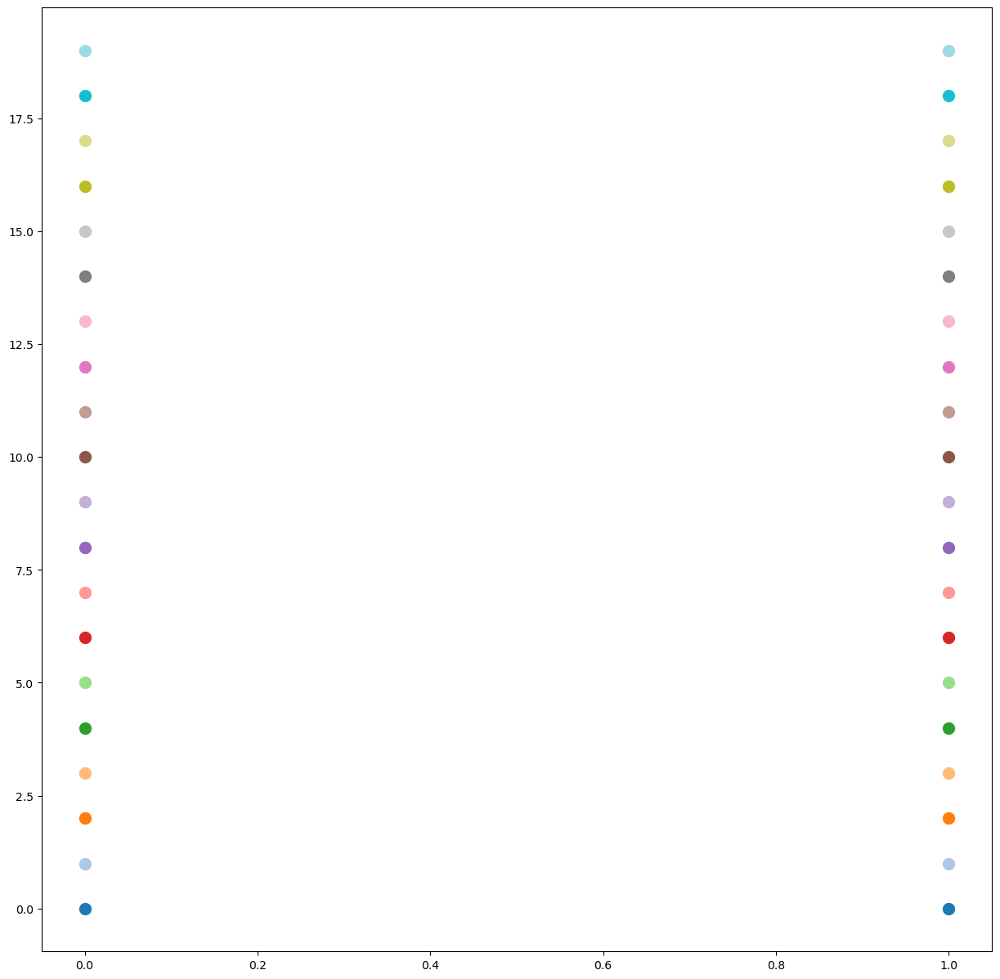

In [89]:
# plt.plot(time_x,ta,lw=3,label=a_i[i][j]+"Train_values")
list(data_des.keys())[:3]
col=cm.tab20(range(20))
x=list(range(20))
plt.figure(figsize=(15,15))
for i,c in enumerate(col):
    print(x[i],i)
    plt.scatter([0, 1], [i, i], color=c,lw=5)

In [23]:
time_xx= np.array(range(0, data.shape[0]))*0.0625
time_xx[::160]
data.shape[0]

1280

A1 20 Index(['step', 'time', 'A1', 'A2', 'A3', 'C1', 'C2', 'C3', 'A1_', 'dA1_', 'C1_', 'dC1_', 'A2_', 'dA2_', 'C2_', 'dC2_', 'A3_', 'dA3_', 'C3_', 'dC3_'], dtype='object') (8960,)
Index(['time', 'A1', 'A2', 'A3', 'A1p', 'A2p', 'A3p', 'C1', 'C2', 'C3', 'C1p', 'C2p', 'C3p', 'Hid0', 'Hid1', 'Hid2', 'Hid3', 'Hid4', 'Hid5', 'Hid6', 'Hid7', 'Hid8', 'Hid9', 'Hid10', 'Hid11', 'Hid12', 'Hid13', 'Hid14', 'Hid15', 'Hid16', 'Hid17', 'Hid18', 'Hid19', 'Hid20', 'Hid21', 'Hid22', 'Hid23', 'Hid24', 'Hid25', 'A1_', 'A1p_', 'dA1_', 'dA1p_', 'A2_', 'A2p_', 'dA2_', 'dA2p_', 'A3_', 'A3p_', 'dA3_', 'dA3p_', 'C1_', 'C1p_', 'dC1_', 'dC1p_', 'C2_', 'C2p_', 'dC2_', 'dC2p_', 'C3_', 'C3p_', 'dC3_', 'dC3p_'], dtype='object')
q 1280 (8960,) (3840,)
[<AxesSubplot:> <AxesSubplot:> <AxesSubplot:>]
0


NameError: name 'p_' is not defined

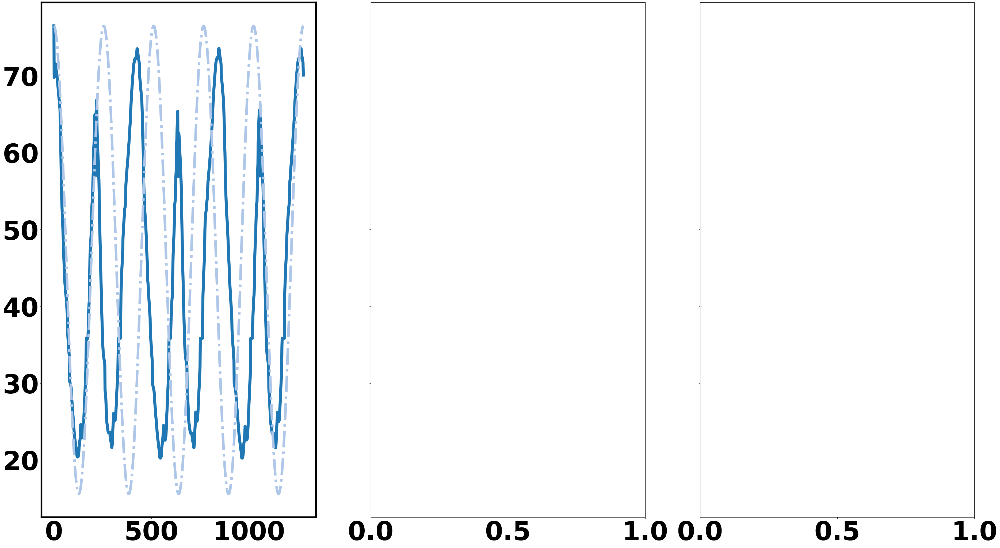

In [20]:
keyz= list(data_des.keys())
# i="current"
# j=0
# df_diff
# i = "angle"
# j= 0
fontsize= 70
font = {'family' : 'normal',
            'weight' : 'bold',
            'size'   : fontsize}
plt.rc('font', **font)
col=cm.tab20(range(14))
q=1280
an=3
# col = ["blue","orange","green"]
for k in keyz[:3]:
    for i in a_i.keys():
        for j in range(3):
            # des_angle_=des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4]

                # for i in a_i.keys():
            kk=a_i[i][j]
            print(kk,k,data_des[k].columns,data_des[k][kk].shape)
            #     data_des[k].reset_index().plot(x="index",y= kk+"_",kind="scatter",label=k,legend =True,figsize=(60,16),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index for designated motion",ncol = 3)
            #         # break
            print(data_mg.columns)
            # plt.fig(figsize=(60,16))
            # plt.figure(figsize=(35,30))
            # x = data_des["20"]["d"+a_i[i][j]+"_"]
            # ta = data_des["AC"]["d"+a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
            # # print(q*t,(t+1)*q)
            # y = data_mg["d"+a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
            # y_= data_mg["d"+a_i[i][j]+"p"+"_"]#[:int(q*an)]
            ta = data_des["AC"][a_i[i][j]+"_"][:int(q*an)]#df_AN[p][e][k][::r]
            # x1 = data_des[k][a_i[i][j]+"_"][:int(q*an)]#df_AN[p][e][k][::r]
            # print(q*t,(t+1)*q)
            y1 = data_mg[a_i[i][j]+"_"][:int(q*an)-1]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
            y1_= data_mg[a_i[i][j]+"p"+"_"][:int(q*an)-1]
            print("q",q,x1.shape,y1.shape)
            time_x=list(range(x1.shape[0]))
            fig, ax = plt.subplots(nrows=1, ncols=3,figsize=(45,25),sharey=True)#plt.figure(figsize=(30,35))
            print(ax)
            # for axis in ['top','bottom','left','right']:
            #     ax2.spines[axis].set_linewidth(4)
            for d in range(an):
                plt.subplot(1,3,d+1)
                cy =0
                qs=0
                sq=1
                [i.set_linewidth(4.5) for i in ax[d].spines.values()]
                print(d)
                # time_xx=time_x[d*q+qs:(1+d)*q-cy]
                # xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                # yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                # yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                # ta1=ta[d*q+qs:-1+(1+d)*q-cy]**sq

                # display(df_diff)
                # for cycle,cy in enumerate(range(0,q,256)):#percycle
                    # plt.figure(figsize=(35,20))
                # qs=q-cy-256
                # print(q,qs,cy)
                # print("range",d*q+qs,(1+d)*q-cy)
                time_xx=time_x[0:1280]#d*q+qs:(1+d)*q-cy]

                # time_xx =list(map(lambda x: x * 0.015, time_xx))
                # xx=x[d*q+qs:(1+d)*q-cy]**sq
                # yy=y[d*q+qs:-1+(1+d)*q-cy]**sq
                # yy_=y_[d*q+qs:-1+(1+d)*q-cy]**sq
                ta1=ta[d*q+qs:(1+d)*q-cy]**sq
                xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                # plt.figure(figsize=(27,20))
                # plt.scatter(time_x,x,s=30,marker=".",label="Designated Motion_"+a_i[i][j])#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
                # plt.scatter(time_x,y,s=30,marker="*",label="Motion Generation")
                # plt.scatter(time_x,y_,s=30,marker="*",label="PRED")
                # plt.plot(time_x,x,s=30,marker=".",label="Designated Motion_"+a_i[i][j])#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
                # plt.plot(time_x,y,s=30,marker="*",label="Motion Generation")
                # plt.plot(time_x,y_,s=30,marker="*",label="PRED")
                # plt.show()
                # fig =plt.figure(figsize=(75,30))
                # row_based_plot_idx = row_based_idx(3, 2, j_)
                # plt.subplot(num_rows, num_cols, row_based_plot_idx)
                # plt.subplot(3, 2,row_based_plot_idx)

                # plt.subplots_adjust(hspace=0.5)
                # plt.plot(time_x,x1,lw=8,linestyle="--",label=a_i[i][j]+"_Fixed_Motion="+k)#,,color=c
                plt.plot(time_xx,yy1,lw=8,c=col[d*2],label=str(angles_list[d])+"_Realized_Motion")#,color=c1 #
                plt.plot(time_xx,ta1,lw=7,linestyle="-.",c=col[d*2+1],label=str(angles_list[d])+"_Train_values")
                #### peaks
                w=50
                x= np.array(yy1)#.reset_index()
                peaks, properties = find_peaks(x, prominence=p_[j], width=w)
                # properties["prominences"], properties["widths"]
                # print("maxima",peaks)
                peaks_, properties_ = find_peaks(-1*x, prominence=p_[j], width=w)
                # print("minima",peaks_)

                # properties["prominences"], properties["widths"]
                # (array([1.495, 2.3  ]), array([36.93773946, 39.32723577]))
                # plt.figure(figsize=(35,20))
                # # plt.plot(x)
                labels = np.array(time_xx[::160])*0.0625
                # # plt.plot(x,y, 'r')
                plt.xticks(time_xx[::160], labels.astype(int), rotation='vertical')
                plt.scatter(peaks, x[peaks], marker ="o",s=500,color = col[d*2])
                plt.scatter(peaks_, x[peaks_], marker ="o",s=500,color = col[d*2])
                plt.subplots_adjust(wspace=0.03, hspace=0.1)

                ######

                # # plt.plot(time_x,y1_,lw=3,label=a_i[i][j]+"_Predicted_Value")
                # for cycle,cy in enumerate(range(0,x1.shape[0],1280)):
                #         # plt.plot(time_x,x1,lw=3,linestyle="--",label="Test_angle="+str(angles_list[d])+"_Designated_Motion="+des_angle_)#,,color=c
                #         # plt.plot(time_x,y1,lw=3,linestyle="-.",label="Test_angle="+str(angles_list[d])+"_Motion_Generation")#,color=c1 #
                #         # plt.plot(time_x,y1_,lw=3,label="Test_angle="+str(angles_list[d])+"_Predicted_Value")

                #         plt.plot([cy]*len(x1),x1,linestyle="-",color = "k")
                #         plt.annotate(
                #             "test angle="+str(angles_list[cycle]),  # this is the text
                #             (
                #                 cy,
                #                 max(x1.max(),y1_.max(),y1.max()),
                #             ),  # these are the coordinates to position the label
                #             textcoords="offset points",
                #             fontsize=45,  # how to position the text
                #             xytext=(0, 0),  # distance from text to points (x,y)
                #             # rotation=90,
                #             # ha="center",
                #         )   
                plt.xlabel("Time in seconds")
                plt.legend(
                loc="lower center",
                bbox_to_anchor=[0.5, 1],
                ncol=1,#int(q/2)+1,
                fontsize=fontsize-10,
                # title= "Big Incline Wipe" + str(angles_list[d])+ i#+"-"+a_i[i][j]
                #"Fixed Motion vs Learned Motion - "+ i+"-"+a_i[i][j]#+"FA-"+k#name+"-"+des_angle_+"-"+ang_list[j],# dts +str(angles_list[d])
                )
                if d == 0: 
                    plt.ylabel(units[i])
                # plt.legend(title = "Adaptability Index - "+ i+"-"+str(j)+"-"+scaling,ncol = 3)

            # plt.savefig("./TDMML/TDM504540/Motion_generation_Binc_"+i+"_"+a_i[i][j]+"_.pdf")
            plt.show()
        #     break
        # break
    break           # data_mg.reset_index().plot(x="index",y= kk+"_",kind="scatter",label="MG",legend =True,figsize=(60,16),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index for designated motion",ncol = 3)
# break
                # data_mg.reset_index().plot(x="index",y= kk+'p_',kind="scatter",label="MG_p",legend =True,figsize=(60,16),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index for designated motion",ncol = 3)



In [33]:
data_des_ ={}
# pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\test\csv\{}.csv".format(_dir,str(a)),skiprows=2)#.zfill(2)
keyz= ['20', '35', '50', 'AC']
for k in keyz:
    # print(data_des[k].columns,data_des[k],data_des[k]["C1"].shape)
    data_des_[k]=  pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\Data_Processed\Data_Fixed_Motion_{}.csv".format(k),skiprows=2)#.zfill(2)
data_mg_= pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\Data_Processed\Data_Motion_Generation.csv",skiprows=2)#.zfill(2)
    
print(data_des_)

print(data_mg_)

{'20':          1     1.0  1674141077.8981633  213295.0  90528.0  247520.0  -482.0  -1237.0  -112.0  76.4918529  -0.023310299999991457  -482.0.1  -196.0  32.46515136  0.01291032000000314  -1237.0.1   60.0  88.7656224  0.0003586200000000872  -112.0.1  20.0
0        2     2.0        1.674141e+09  213167.0  90601.0  247523.0  -833.0  -1361.0   -96.0   76.445950              -0.045903    -833.0  -351.0    32.491331             0.026179    -1361.0 -124.0   88.766698               0.001076     -96.0  16.0
1        3     3.0        1.674141e+09  212974.0  90711.0  247528.0 -1052.0  -1232.0   -54.0   76.376736              -0.069214   -1052.0  -219.0    32.530779             0.039448    -1232.0  129.0   88.768491               0.001793     -54.0  42.0
2        4     4.0        1.674141e+09  212718.0  90858.0  247535.0 -1074.0  -1330.0   -10.0   76.284929              -0.091807   -1074.0   -22.0    32.583496             0.052717    -1330.0  -98.0   88.771002               0.002510     -10.0  44

A1
maxima [ 219  427  635  846 1054 1280 1496 1714 1980 2243 2518 2560 2824 3080
 3334 3588 3840 4094 4342 4590 4837 5084 5120 5369 5613 5858 6102 6347
 6400 6649 6894 7140 7384 7629 7680 7929 8175 8422 8670 8916]
minima [ 122  297  546  717  965 1137 1400 1586 1828 2094 2395 2709 2970 3226
 3480 3734 3988 4238 4487 4734 4981 5268 5514 5758 6003 6248 6548 6795
 7041 7286 7530 7831 8080 8325 8574 8819]


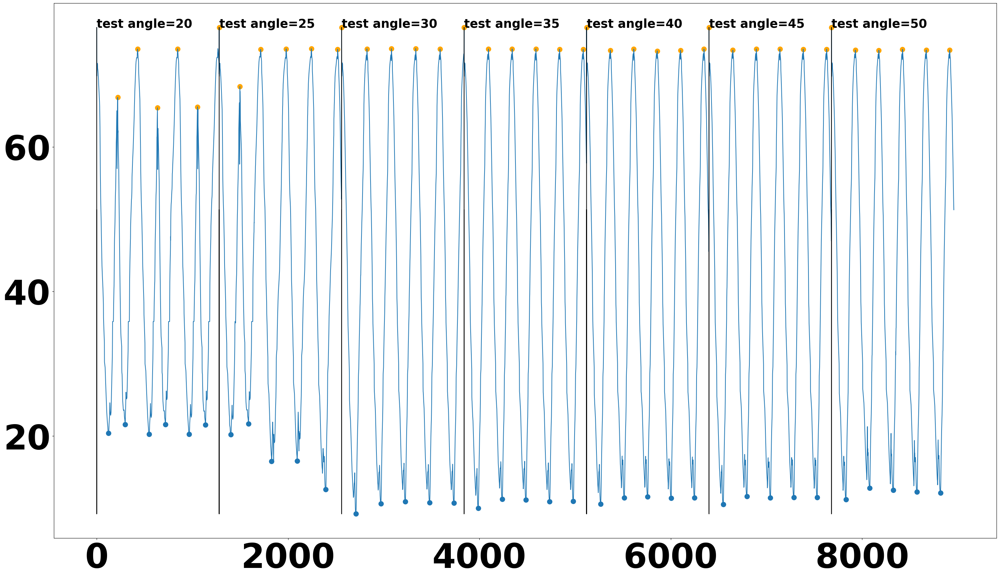

A2
maxima [ 119  297  543  717  963 1136 1384 1586 1849 2114 2396 2710 2971 3227
 3481 3735 3988 4240 4488 4736 4982 5269 5515 5760 6005 6249 6549 6797
 7043 7287 7531 7832 8081 8327 8575 8820]
minima [ 219  426  635  845 1053 1280 1496 1712 1980 2243 2517 2560 2824 3080
 3334 3588 3840 4094 4342 4590 4837 5120 5368 5613 5857 6102 6347 6400
 6648 6894 7140 7384 7629 7680 7929 8174 8422 8669 8914]


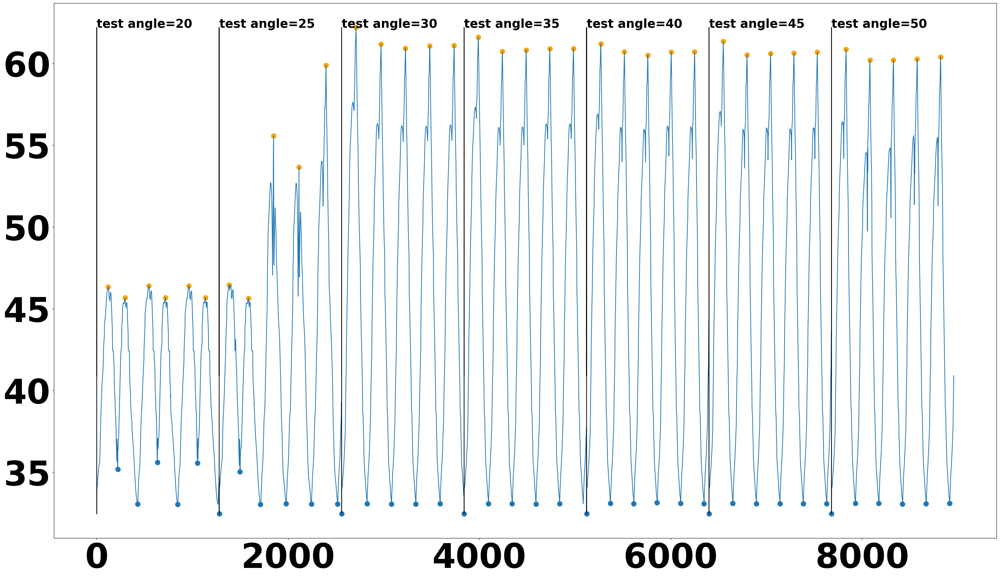

A3
maxima [ 119  297  543  717  962 1136 1398 1586 1864 2130 2396 2710 2971 3227
 3481 3735 3989 4240 4488 4736 4983 5269 5515 5760 6005 6249 6549 6797
 7043 7287 7531 7832 8081 8327 8575 8820]
minima [ 219  426  635  845 1053 1280 1496 1712 1980 2243 2560 2824 3080 3334
 3588 3840 4094 4342 4590 4837 5120 5368 5613 5857 6102 6400 6648 6894
 7140 7384 7680 7929 8174 8422 8669]


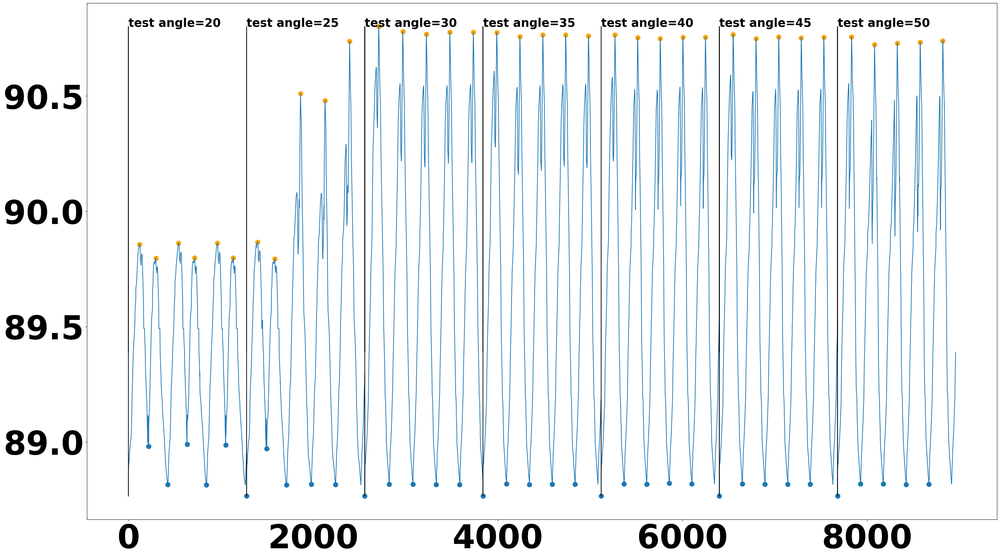

C1
maxima [ 165  330  775 1183 1633 2414 2735 2993 3232 3503 3757 4012 4261 4509
 4757 5004 5305 5536 5780 6026 6270 6817 7063 7308 7552 7856 8597]
minima [ 460  879 1316 1516 1740 2007 2270 2580 2902 3108 3363 3666 3922 4171
 4399 4667 4894 5202 5446 5642 5915 6180 6376 6482 6726 6972 7462 7658
 7721 7986 8253 8501 8748]


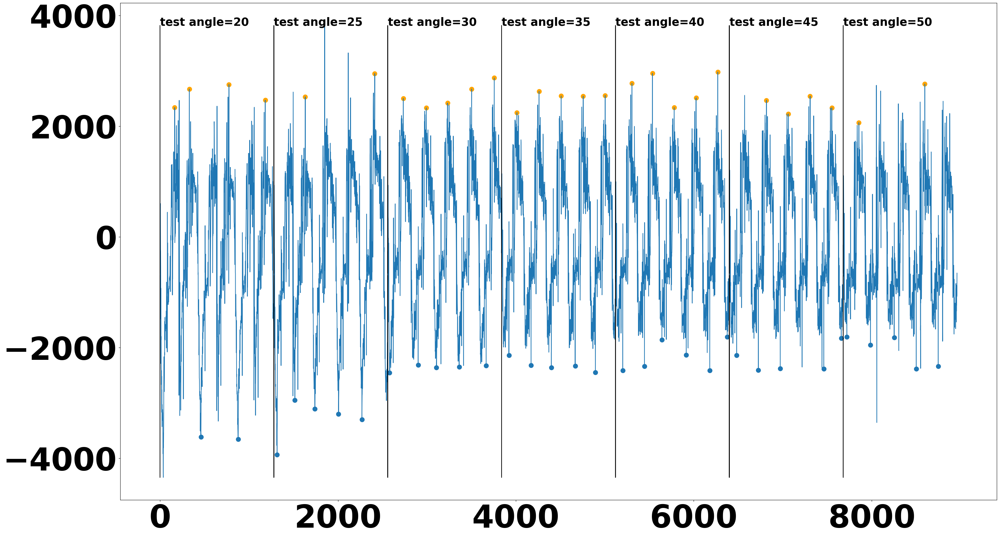

C2
maxima [ 262  459  654  878 1074 1349 1549 1790 1793 2051 2320 2641 2904 3157
 3411 3668 3921 4150 4419 4666 4888 5172 5418 5669 5906 6151 6454 6706
 6943 7190 7434 7762 7985 8232 8471 8726]
minima [ 843 1264 1706 1978 2210 2517 2824 3080 3334 3588 3805 4094 4342 4590
 4837 5084 5368 5613 5820 6065 6347 6613 6894 7140 7384 7629 7875 8104
 8600 8876]


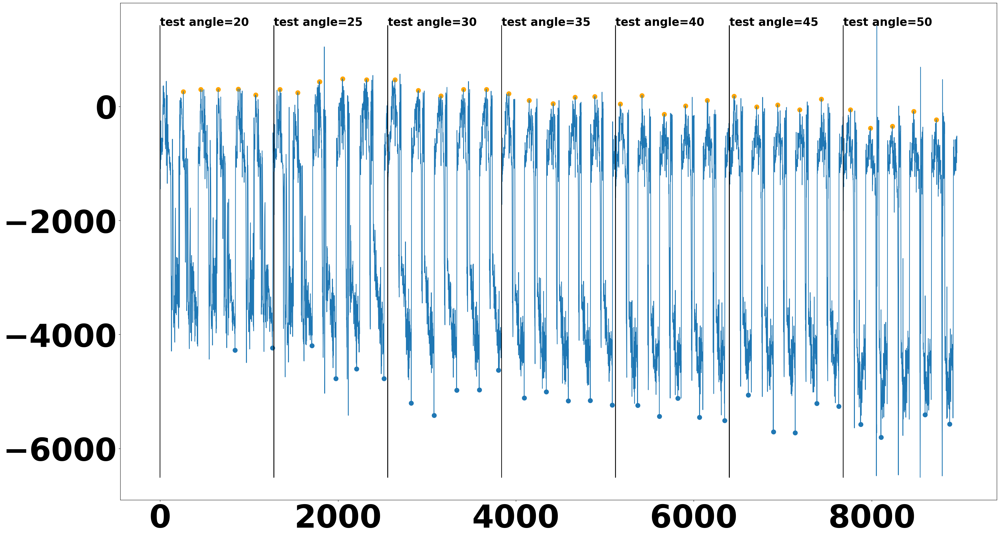

C3
maxima [ 224  438  637  858 1724 1878 1991 2254 2528 2571 2834 3090 3344 3598
 3849 4104 4352 4600 4847 5094 5129 5378 5623 5867 6112 6357 6404 6658
 6903 7150 7394 7639 7689 7939 8080 8185 8327 8432 8553 8679]
minima [ 845 1877 2142 2400 5521 6255 6802 7049 7293 7839 8106 8353 8619 8863]


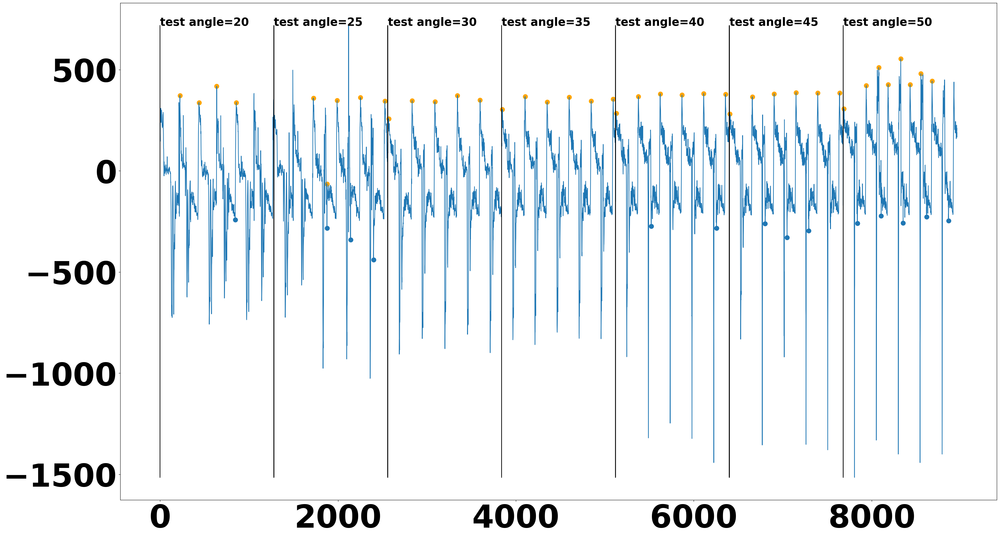

A1 20 Index(['Unnamed: 0', 'step', 'time', 'A1', 'A2', 'A3', 'C1', 'C2', 'C3', 'A1_', 'dA1_', 'C1_', 'dC1_', 'A2_', 'dA2_', 'C2_', 'dC2_', 'A3_', 'dA3_', 'C3_', 'dC3_'], dtype='object') (8960,)
Index(['Unnamed: 0', 'time', 'A1', 'A2', 'A3', 'A1p', 'A2p', 'A3p', 'C1', 'C2', 'C3', 'C1p', 'C2p', 'C3p', 'Hid0', 'Hid1', 'Hid2', 'Hid3', 'Hid4', 'Hid5', 'Hid6', 'Hid7', 'Hid8', 'Hid9', 'Hid10', 'Hid11', 'Hid12', 'Hid13', 'Hid14', 'Hid15', 'Hid16', 'Hid17', 'Hid18', 'Hid19', 'Hid20', 'Hid21', 'Hid22', 'Hid23', 'Hid24', 'Hid25', 'A1_', 'A1p_', 'dA1_', 'dA1p_', 'A2_', 'A2p_', 'dA2_', 'dA2p_', 'A3_', 'A3p_', 'dA3_', 'dA3p_', 'C1_', 'C1p_', 'dC1_', 'dC1p_', 'C2_', 'C2p_', 'dC2_', 'dC2p_', 'C3_', 'C3p_', 'dC3_', 'dC3p_'], dtype='object')
q 1280 (8960,) (3840,)
[<AxesSubplot:> <AxesSubplot:> <AxesSubplot:>]
0


ValueError: x and y must have same first dimension, but have shapes (1280,) and (1279,)

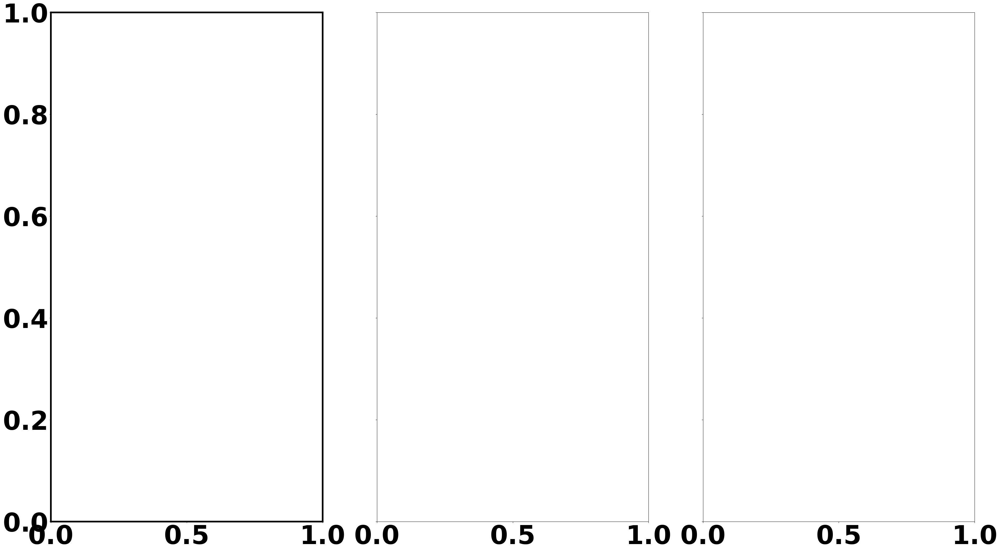

In [40]:
#nagashima rsj code
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

data_des ={}
# pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\test\csv\{}.csv".format(_dir,str(a)),skiprows=2)#.zfill(2)
keyz= ['20', '35', '50', 'AC']
for k in keyz:
    # print(data_des[k].columns,data_des[k],data_des[k]["C1"].shape)
    data_des[k]=  pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\Data_Processed\Data_Fixed_Motion_{}.csv".format(k))#.zfill(2)
data_mg= pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\Data_Processed\Data_Motion_Generation.csv")#.zfill(2)
    
    

p_ = [0.8,1,0.8]
for i in a_i.keys():
    for j in range(3):
        print(a_i[i][j])
        get_peaks(a_i[i][j]+"_",data_mg,p_[j],50)

time_xx= np.array(range(0, data.shape[0]))*0.0625
time_xx[::160]
data.shape[0]

keyz= list(data_des.keys())
# i="current"
# j=0
# df_diff
# i = "angle"
# j= 0
fontsize= 70
font = {'family' : 'normal',
            'weight' : 'bold',
            'size'   : fontsize}
plt.rc('font', **font)
col=cm.tab20(range(14))
q=1280
an=3
# col = ["blue","orange","green"]
for k in keyz[:3]:
    for i in a_i.keys():
        for j in range(3):
            # des_angle_=des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4]

                # for i in a_i.keys():
            kk=a_i[i][j]
            print(kk,k,data_des[k].columns,data_des[k][kk].shape)
            #     data_des[k].reset_index().plot(x="index",y= kk+"_",kind="scatter",label=k,legend =True,figsize=(60,16),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index for designated motion",ncol = 3)
            #         # break
            print(data_mg.columns)
            # plt.fig(figsize=(60,16))
            # plt.figure(figsize=(35,30))
            # x = data_des["20"]["d"+a_i[i][j]+"_"]
            # ta = data_des["AC"]["d"+a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
            # # print(q*t,(t+1)*q)
            # y = data_mg["d"+a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
            # y_= data_mg["d"+a_i[i][j]+"p"+"_"]#[:int(q*an)]
            ta = data_des["AC"][a_i[i][j]+"_"][:int(q*an)]#df_AN[p][e][k][::r]
            # x1 = data_des[k][a_i[i][j]+"_"][:int(q*an)]#df_AN[p][e][k][::r]
            # print(q*t,(t+1)*q)
            y1 = data_mg[a_i[i][j]+"_"][:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
            y1_= data_mg[a_i[i][j]+"p"+"_"][:int(q*an)]
            print("q",q,x1.shape,y1.shape)
            time_x=list(range(x1.shape[0]))
            fig, ax = plt.subplots(nrows=1, ncols=3,figsize=(45,25),sharey=True)#plt.figure(figsize=(30,35))
            print(ax)

            for d in range(an):
                plt.subplot(1,3,d+1)
                cy =0
                qs=0
                sq=1
                [i.set_linewidth(4.5) for i in ax[d].spines.values()]
                print(d)
                # time_xx=time_x[d*q+qs:(1+d)*q-cy]
                # xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                # yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                # yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                # ta1=ta[d*q+qs:-1+(1+d)*q-cy]**sq

                # display(df_diff)
                # for cycle,cy in enumerate(range(0,q,256)):#percycle
                    # plt.figure(figsize=(35,20))
                # qs=q-cy-256
                # print(q,qs,cy)
                # print("range",d*q+qs,(1+d)*q-cy)
                time_xx=time_x[0:1280]#d*q+qs:(1+d)*q-cy]

                # time_xx =list(map(lambda x: x * 0.015, time_xx))
                # xx=x[d*q+qs:(1+d)*q-cy]**sq
                # yy=y[d*q+qs:-1+(1+d)*q-cy]**sq
                # yy_=y_[d*q+qs:-1+(1+d)*q-cy]**sq
                ta1=ta[d*q+qs:(1+d)*q-cy]**sq
                xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                # plt.figure(figsize=(27,20))
                # plt.scatter(time_x,x,s=30,marker=".",label="Designated Motion_"+a_i[i][j])#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
                # plt.scatter(time_x,y,s=30,marker="*",label="Motion Generation")
                # plt.scatter(time_x,y_,s=30,marker="*",label="PRED")
                # plt.plot(time_x,x,s=30,marker=".",label="Designated Motion_"+a_i[i][j])#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
                # plt.plot(time_x,y,s=30,marker="*",label="Motion Generation")
                # plt.plot(time_x,y_,s=30,marker="*",label="PRED")
                # plt.show()
                # fig =plt.figure(figsize=(75,30))
                # row_based_plot_idx = row_based_idx(3, 2, j_)
                # plt.subplot(num_rows, num_cols, row_based_plot_idx)
                # plt.subplot(3, 2,row_based_plot_idx)

                # plt.subplots_adjust(hspace=0.5)
                # plt.plot(time_x,x1,lw=8,linestyle="--",label=a_i[i][j]+"_Fixed_Motion="+k)#,,color=c
                plt.plot(time_xx,yy1,lw=8,c=col[d*2],label=str(angles_list[d])+"_Realized_Motion")#,color=c1 #
                plt.plot(time_xx,ta1,lw=7,linestyle="-.",c=col[d*2+1],label=str(angles_list[d])+"_Train_values")
                # #### peaks
                # w=50
                # x= np.array(yy1)#.reset_index()
                # peaks, properties = find_peaks(x, prominence=p_[j], width=w)
                # # properties["prominences"], properties["widths"]
                # # print("maxima",peaks)
                # peaks_, properties_ = find_peaks(-1*x, prominence=p_[j], width=w)
                # # print("minima",peaks_)

                # # properties["prominences"], properties["widths"]
                # # (array([1.495, 2.3  ]), array([36.93773946, 39.32723577]))
                # # plt.figure(figsize=(35,20))
                # # # plt.plot(x)
                # labels = np.array(time_xx[::160])*0.0625
                # # # plt.plot(x,y, 'r')
                # plt.xticks(time_xx[::160], labels.astype(int), rotation='vertical')
                # plt.scatter(peaks, x[peaks], marker ="o",s=500,color = col[d*2])
                # plt.scatter(peaks_, x[peaks_], marker ="o",s=500,color = col[d*2])
                # plt.subplots_adjust(wspace=0.03, hspace=0.1)

                ######

                # # plt.plot(time_x,y1_,lw=3,label=a_i[i][j]+"_Predicted_Value")
                # for cycle,cy in enumerate(range(0,x1.shape[0],1280)):
                #         # plt.plot(time_x,x1,lw=3,linestyle="--",label="Test_angle="+str(angles_list[d])+"_Designated_Motion="+des_angle_)#,,color=c
                #         # plt.plot(time_x,y1,lw=3,linestyle="-.",label="Test_angle="+str(angles_list[d])+"_Motion_Generation")#,color=c1 #
                #         # plt.plot(time_x,y1_,lw=3,label="Test_angle="+str(angles_list[d])+"_Predicted_Value")

                #         plt.plot([cy]*len(x1),x1,linestyle="-",color = "k")
                #         plt.annotate(
                #             "test angle="+str(angles_list[cycle]),  # this is the text
                #             (
                #                 cy,
                #                 max(x1.max(),y1_.max(),y1.max()),
                #             ),  # these are the coordinates to position the label
                #             textcoords="offset points",
                #             fontsize=45,  # how to position the text
                #             xytext=(0, 0),  # distance from text to points (x,y)
                #             # rotation=90,
                #             # ha="center",
                #         )   
                plt.xlabel("Time in seconds")
                plt.legend(
                loc="lower center",
                bbox_to_anchor=[0.5, 1],
                ncol=1,#int(q/2)+1,
                fontsize=fontsize-10,
                # title= "Big Incline Wipe" + str(angles_list[d])+ i#+"-"+a_i[i][j]
                #"Fixed Motion vs Learned Motion - "+ i+"-"+a_i[i][j]#+"FA-"+k#name+"-"+des_angle_+"-"+ang_list[j],# dts +str(angles_list[d])
                )
                if d == 0: 
                    plt.ylabel(units[i])
                # plt.legend(title = "Adaptability Index - "+ i+"-"+str(j)+"-"+scaling,ncol = 3)

            # plt.savefig("./TDMML/TDM504540/Motion_generation_Binc_"+i+"_"+a_i[i][j]+"_.pdf")
            plt.show()
        #     break
        # break
    break           # data_mg.reset_index().plot(x="index",y= kk+"_",kind="scatter",label="MG",legend =True,figsize=(60,16),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index for designated motion",ncol = 3)
# break
                # data_mg.reset_index().plot(x="index",y= kk+'p_',kind="scatter",label="MG_p",legend =True,figsize=(60,16),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index for designated motion",ncol = 3)



A1
maxima [ 219  427  635  846 1054 1280 1496 1714 1980 2243 2518 2560 2824 3080
 3334 3588 3840 4094 4342 4590 4837 5084 5120 5369 5613 5858 6102 6347
 6400 6649 6894 7140 7384 7629 7680 7929 8175 8422 8670 8916]
minima [ 122  297  546  717  965 1137 1400 1586 1828 2094 2395 2709 2970 3226
 3480 3734 3988 4238 4487 4734 4981 5268 5514 5758 6003 6248 6548 6795
 7041 7286 7530 7831 8080 8325 8574 8819]


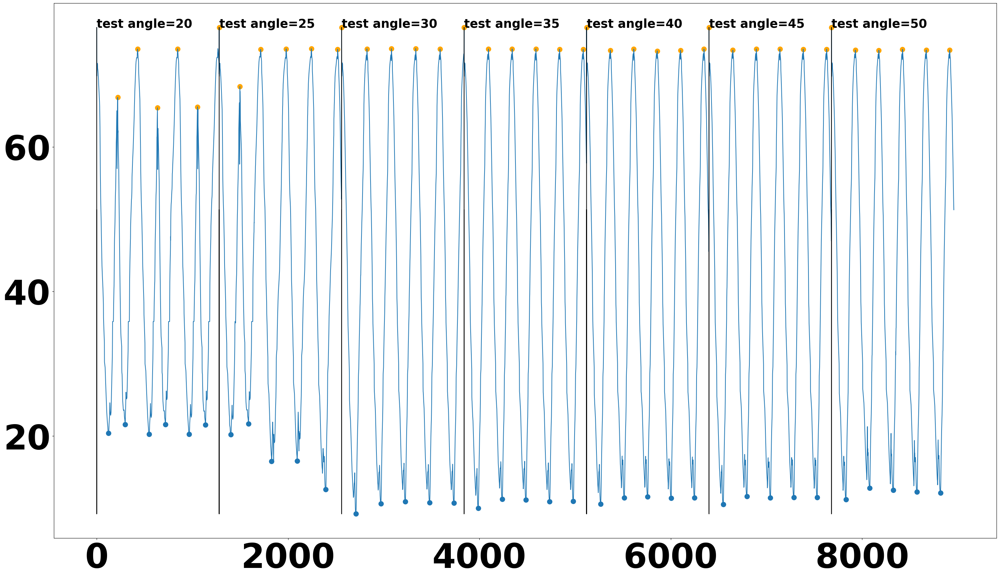

A2
maxima [ 119  297  543  717  963 1136 1384 1586 1849 2114 2396 2710 2971 3227
 3481 3735 3988 4240 4488 4736 4982 5269 5515 5760 6005 6249 6549 6797
 7043 7287 7531 7832 8081 8327 8575 8820]
minima [ 219  426  635  845 1053 1280 1496 1712 1980 2243 2517 2560 2824 3080
 3334 3588 3840 4094 4342 4590 4837 5120 5368 5613 5857 6102 6347 6400
 6648 6894 7140 7384 7629 7680 7929 8174 8422 8669 8914]


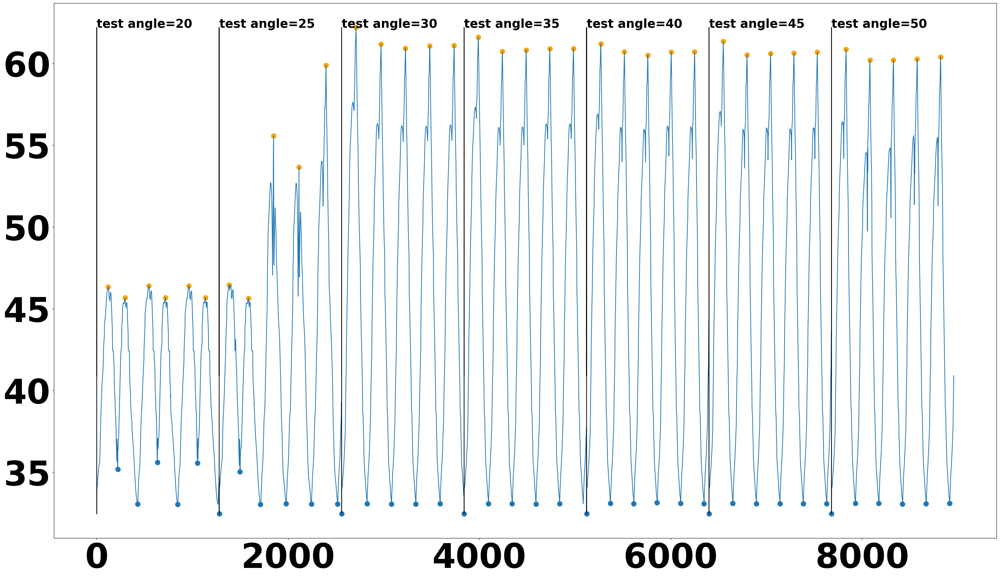

A3
maxima [ 119  297  543  717  962 1136 1398 1586 1864 2130 2396 2710 2971 3227
 3481 3735 3989 4240 4488 4736 4983 5269 5515 5760 6005 6249 6549 6797
 7043 7287 7531 7832 8081 8327 8575 8820]
minima [ 219  426  635  845 1053 1280 1496 1712 1980 2243 2560 2824 3080 3334
 3588 3840 4094 4342 4590 4837 5120 5368 5613 5857 6102 6400 6648 6894
 7140 7384 7680 7929 8174 8422 8669]


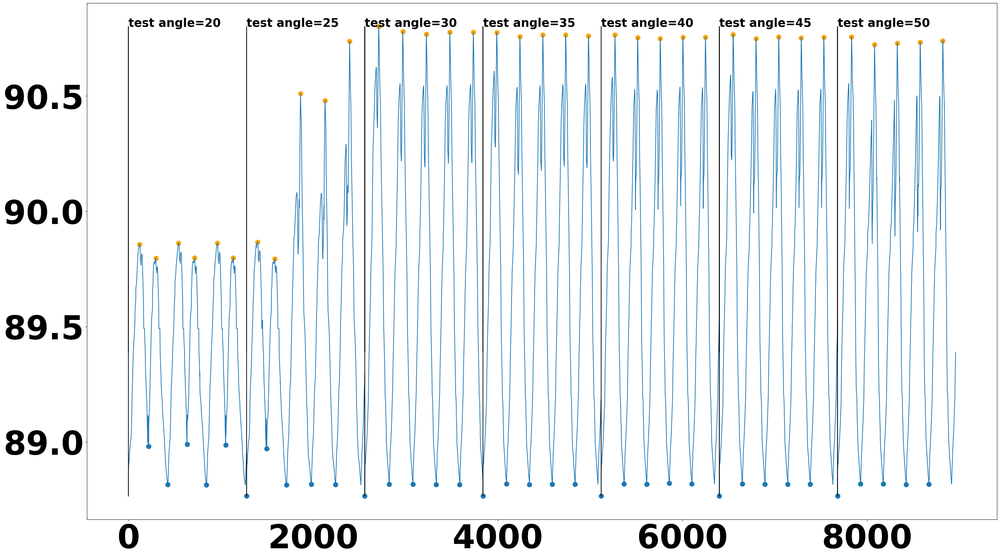

C1
maxima [ 165  330  775 1183 1633 2414 2735 2993 3232 3503 3757 4012 4261 4509
 4757 5004 5305 5536 5780 6026 6270 6817 7063 7308 7552 7856 8597]
minima [ 460  879 1316 1516 1740 2007 2270 2580 2902 3108 3363 3666 3922 4171
 4399 4667 4894 5202 5446 5642 5915 6180 6376 6482 6726 6972 7462 7658
 7721 7986 8253 8501 8748]


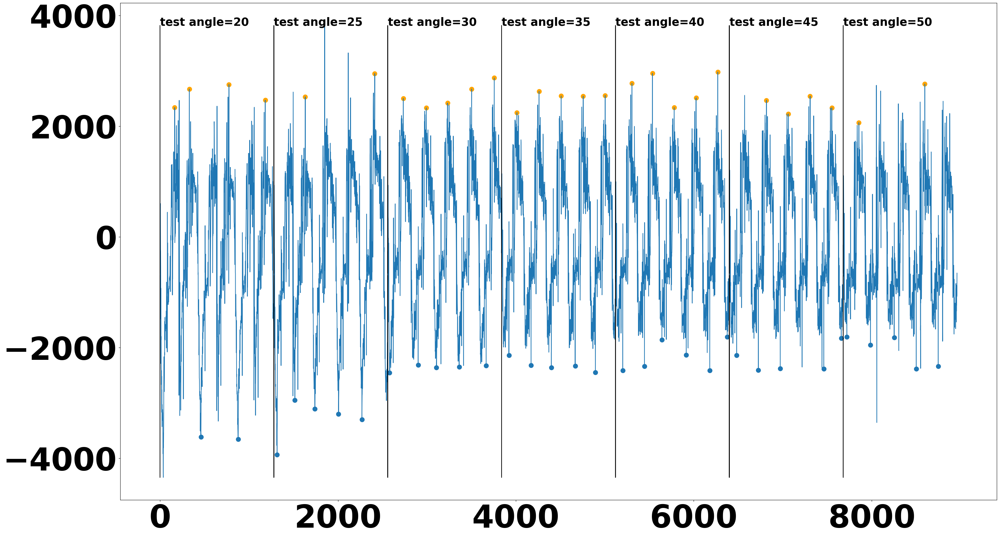

C2
maxima [ 262  459  654  878 1074 1349 1549 1790 1793 2051 2320 2641 2904 3157
 3411 3668 3921 4150 4419 4666 4888 5172 5418 5669 5906 6151 6454 6706
 6943 7190 7434 7762 7985 8232 8471 8726]
minima [ 843 1264 1706 1978 2210 2517 2824 3080 3334 3588 3805 4094 4342 4590
 4837 5084 5368 5613 5820 6065 6347 6613 6894 7140 7384 7629 7875 8104
 8600 8876]


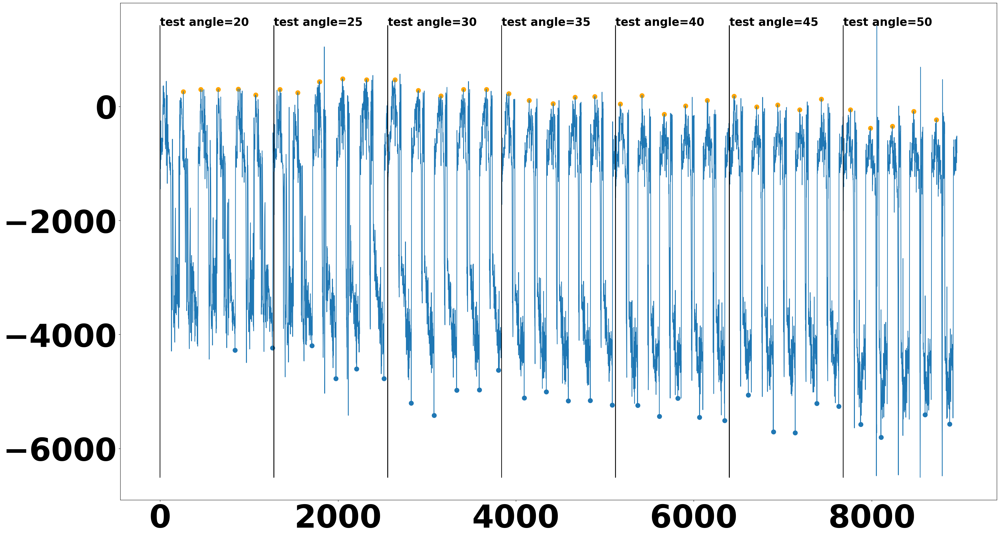

C3
maxima [ 224  438  637  858 1724 1878 1991 2254 2528 2571 2834 3090 3344 3598
 3849 4104 4352 4600 4847 5094 5129 5378 5623 5867 6112 6357 6404 6658
 6903 7150 7394 7639 7689 7939 8080 8185 8327 8432 8553 8679]
minima [ 845 1877 2142 2400 5521 6255 6802 7049 7293 7839 8106 8353 8619 8863]


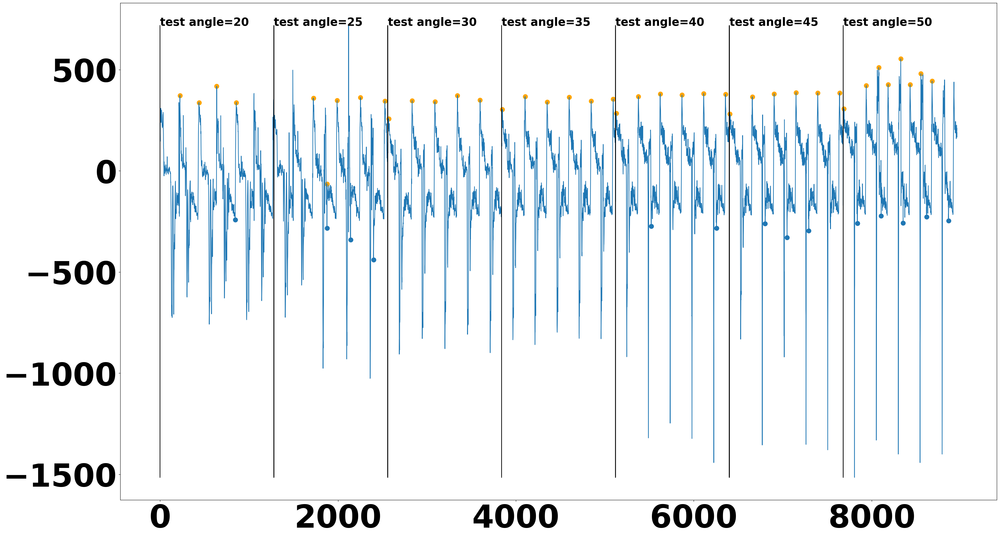

A1 20 Index(['Unnamed: 0', 'step', 'time', 'A1', 'A2', 'A3', 'C1', 'C2', 'C3', 'A1_', 'dA1_', 'C1_', 'dC1_', 'A2_', 'dA2_', 'C2_', 'dC2_', 'A3_', 'dA3_', 'C3_', 'dC3_'], dtype='object') (8960,)
Index(['Unnamed: 0', 'time', 'A1', 'A2', 'A3', 'A1p', 'A2p', 'A3p', 'C1', 'C2', 'C3', 'C1p', 'C2p', 'C3p', 'Hid0', 'Hid1', 'Hid2', 'Hid3', 'Hid4', 'Hid5', 'Hid6', 'Hid7', 'Hid8', 'Hid9', 'Hid10', 'Hid11', 'Hid12', 'Hid13', 'Hid14', 'Hid15', 'Hid16', 'Hid17', 'Hid18', 'Hid19', 'Hid20', 'Hid21', 'Hid22', 'Hid23', 'Hid24', 'Hid25', 'A1_', 'A1p_', 'dA1_', 'dA1p_', 'A2_', 'A2p_', 'dA2_', 'dA2p_', 'A3_', 'A3p_', 'dA3_', 'dA3p_', 'C1_', 'C1p_', 'dC1_', 'dC1p_', 'C2_', 'C2p_', 'dC2_', 'dC2p_', 'C3_', 'C3p_', 'dC3_', 'dC3p_'], dtype='object')
q 1280 (8960,) (3840,)
[<AxesSubplot:> <AxesSubplot:> <AxesSubplot:>]
0


ValueError: x and y must have same first dimension, but have shapes (1280,) and (1279,)

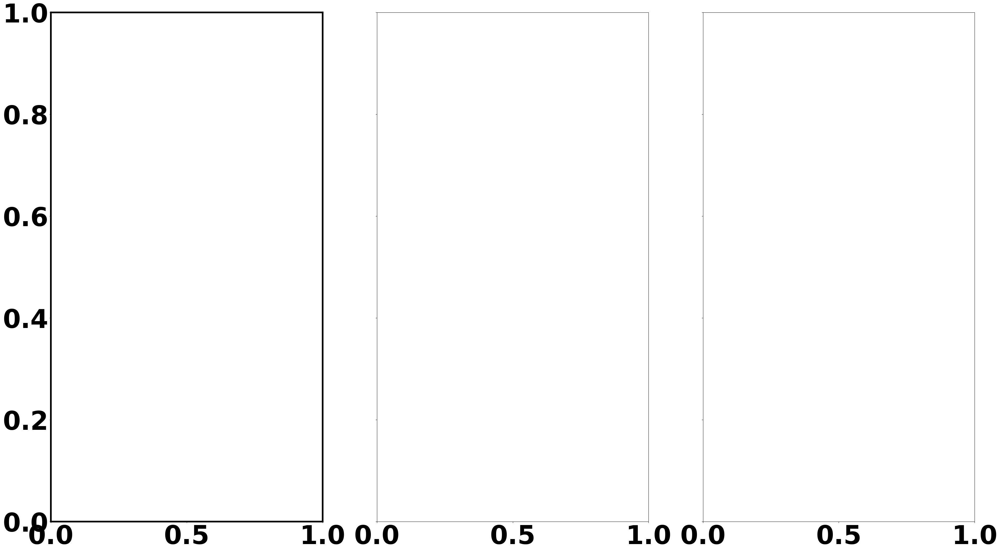

In [41]:
#nagashima rsj code
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

data_des ={}
# pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping{}\test\csv\{}.csv".format(_dir,str(a)),skiprows=2)#.zfill(2)
keyz= ['20', '35', '50', 'AC']
for k in keyz:
    # print(data_des[k].columns,data_des[k],data_des[k]["C1"].shape)
    data_des[k]=  pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\Data_Processed\Data_Fixed_Motion_{}.csv".format(k))#.zfill(2)
data_mg= pd.read_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\Data_Processed\Data_Motion_Generation.csv")#.zfill(2)
    
    

p_ = [0.8,1,0.8]
for i in a_i.keys():
    for j in range(3):
        print(a_i[i][j])
        get_peaks(a_i[i][j]+"_",data_mg,p_[j],50)

time_xx= np.array(range(0, data.shape[0]))*0.0625
time_xx[::160]
data.shape[0]

keyz= list(data_des.keys())
# i="current"
# j=0
# df_diff
# i = "angle"
# j= 0
fontsize= 70
font = {'family' : 'normal',
            'weight' : 'bold',
            'size'   : fontsize}
plt.rc('font', **font)
col=cm.tab20(range(14))
q=1280
an=3
# col = ["blue","orange","green"]
for k in keyz[:3]:
    for i in a_i.keys():
        for j in range(3):
            # des_angle_=des_dir[ix][des_dir[ix].index("B-")+2:des_dir[ix].index("B-")+4]

                # for i in a_i.keys():
            kk=a_i[i][j]
            print(kk,k,data_des[k].columns,data_des[k][kk].shape)
            #     data_des[k].reset_index().plot(x="index",y= kk+"_",kind="scatter",label=k,legend =True,figsize=(60,16),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index for designated motion",ncol = 3)
            #         # break
            print(data_mg.columns)
            # plt.fig(figsize=(60,16))
            # plt.figure(figsize=(35,30))
            # x = data_des["20"]["d"+a_i[i][j]+"_"]
            # ta = data_des["AC"]["d"+a_i[i][j]+"_"]#[:int(q*an)]#df_AN[p][e][k][::r]
            # # print(q*t,(t+1)*q)
            # y = data_mg["d"+a_i[i][j]+"_"]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
            # y_= data_mg["d"+a_i[i][j]+"p"+"_"]#[:int(q*an)]
            ta = data_des["AC"][a_i[i][j]+"_"][:int(q*an)]#df_AN[p][e][k][::r]
            # x1 = data_des[k][a_i[i][j]+"_"][:int(q*an)]#df_AN[p][e][k][::r]
            # print(q*t,(t+1)*q)
            y1 = data_mg[a_i[i][j]+"_"][:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
            y1_= data_mg[a_i[i][j]+"p"+"_"][:int(q*an)]
            print("q",q,x1.shape,y1.shape)
            time_x=list(range(x1.shape[0]))
            fig, ax = plt.subplots(nrows=1, ncols=3,figsize=(45,25),sharey=True)#plt.figure(figsize=(30,35))
            print(ax)

            for d in range(an):
                plt.subplot(1,3,d+1)
                cy =0
                qs=0
                sq=1
                [i.set_linewidth(4.5) for i in ax[d].spines.values()]
                print(d)
                # time_xx=time_x[d*q+qs:(1+d)*q-cy]
                # xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                # yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                # yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                # ta1=ta[d*q+qs:-1+(1+d)*q-cy]**sq

                # display(df_diff)
                # for cycle,cy in enumerate(range(0,q,256)):#percycle
                    # plt.figure(figsize=(35,20))
                # qs=q-cy-256
                # print(q,qs,cy)
                # print("range",d*q+qs,(1+d)*q-cy)
                time_xx=time_x[0:1280]#d*q+qs:(1+d)*q-cy]

                # time_xx =list(map(lambda x: x * 0.015, time_xx))
                # xx=x[d*q+qs:(1+d)*q-cy]**sq
                # yy=y[d*q+qs:-1+(1+d)*q-cy]**sq
                # yy_=y_[d*q+qs:-1+(1+d)*q-cy]**sq
                ta1=ta[d*q+qs:(1+d)*q-cy]**sq
                xx1=x1[d*q+qs:(1+d)*q-cy]**sq
                yy1=y1[d*q+qs:-1+(1+d)*q-cy]**sq
                yy1_=y1_[d*q+qs:-1+(1+d)*q-cy]**sq
                # plt.figure(figsize=(27,20))
                # plt.scatter(time_x,x,s=30,marker=".",label="Designated Motion_"+a_i[i][j])#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
                # plt.scatter(time_x,y,s=30,marker="*",label="Motion Generation")
                # plt.scatter(time_x,y_,s=30,marker="*",label="PRED")
                # plt.plot(time_x,x,s=30,marker=".",label="Designated Motion_"+a_i[i][j])#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
                # plt.plot(time_x,y,s=30,marker="*",label="Motion Generation")
                # plt.plot(time_x,y_,s=30,marker="*",label="PRED")
                # plt.show()
                # fig =plt.figure(figsize=(75,30))
                # row_based_plot_idx = row_based_idx(3, 2, j_)
                # plt.subplot(num_rows, num_cols, row_based_plot_idx)
                # plt.subplot(3, 2,row_based_plot_idx)

                # plt.subplots_adjust(hspace=0.5)
                # plt.plot(time_x,x1,lw=8,linestyle="--",label=a_i[i][j]+"_Fixed_Motion="+k)#,,color=c
                plt.plot(time_xx,yy1,lw=8,c=col[d*2],label=str(angles_list[d])+"_Realized_Motion")#,color=c1 #
                plt.plot(time_xx,ta1,lw=7,linestyle="-.",c=col[d*2+1],label=str(angles_list[d])+"_Train_values")
                # #### peaks
                # w=50
                # x= np.array(yy1)#.reset_index()
                # peaks, properties = find_peaks(x, prominence=p_[j], width=w)
                # # properties["prominences"], properties["widths"]
                # # print("maxima",peaks)
                # peaks_, properties_ = find_peaks(-1*x, prominence=p_[j], width=w)
                # # print("minima",peaks_)

                # # properties["prominences"], properties["widths"]
                # # (array([1.495, 2.3  ]), array([36.93773946, 39.32723577]))
                # # plt.figure(figsize=(35,20))
                # # # plt.plot(x)
                # labels = np.array(time_xx[::160])*0.0625
                # # # plt.plot(x,y, 'r')
                # plt.xticks(time_xx[::160], labels.astype(int), rotation='vertical')
                # plt.scatter(peaks, x[peaks], marker ="o",s=500,color = col[d*2])
                # plt.scatter(peaks_, x[peaks_], marker ="o",s=500,color = col[d*2])
                # plt.subplots_adjust(wspace=0.03, hspace=0.1)

                ######

                # # plt.plot(time_x,y1_,lw=3,label=a_i[i][j]+"_Predicted_Value")
                # for cycle,cy in enumerate(range(0,x1.shape[0],1280)):
                #         # plt.plot(time_x,x1,lw=3,linestyle="--",label="Test_angle="+str(angles_list[d])+"_Designated_Motion="+des_angle_)#,,color=c
                #         # plt.plot(time_x,y1,lw=3,linestyle="-.",label="Test_angle="+str(angles_list[d])+"_Motion_Generation")#,color=c1 #
                #         # plt.plot(time_x,y1_,lw=3,label="Test_angle="+str(angles_list[d])+"_Predicted_Value")

                #         plt.plot([cy]*len(x1),x1,linestyle="-",color = "k")
                #         plt.annotate(
                #             "test angle="+str(angles_list[cycle]),  # this is the text
                #             (
                #                 cy,
                #                 max(x1.max(),y1_.max(),y1.max()),
                #             ),  # these are the coordinates to position the label
                #             textcoords="offset points",
                #             fontsize=45,  # how to position the text
                #             xytext=(0, 0),  # distance from text to points (x,y)
                #             # rotation=90,
                #             # ha="center",
                #         )   
                plt.xlabel("Time in seconds")
                plt.legend(
                loc="lower center",
                bbox_to_anchor=[0.5, 1],
                ncol=1,#int(q/2)+1,
                fontsize=fontsize-10,
                # title= "Big Incline Wipe" + str(angles_list[d])+ i#+"-"+a_i[i][j]
                #"Fixed Motion vs Learned Motion - "+ i+"-"+a_i[i][j]#+"FA-"+k#name+"-"+des_angle_+"-"+ang_list[j],# dts +str(angles_list[d])
                )
                if d == 0: 
                    plt.ylabel(units[i])
                # plt.legend(title = "Adaptability Index - "+ i+"-"+str(j)+"-"+scaling,ncol = 3)

            # plt.savefig("./TDMML/TDM504540/Motion_generation_Binc_"+i+"_"+a_i[i][j]+"_.pdf")
            plt.show()
        #     break
        # break
    break           # data_mg.reset_index().plot(x="index",y= kk+"_",kind="scatter",label="MG",legend =True,figsize=(60,16),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index for designated motion",ncol = 3)
# break
                # data_mg.reset_index().plot(x="index",y= kk+'p_',kind="scatter",label="MG_p",legend =True,figsize=(60,16),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index for designated motion",ncol = 3)



In [21]:
# df_3d_dict_.keys()

dict_keys(['no-scale', 'mm', 'nz'])

In [ ]:
x = data_des["20"][a_i[i][j]][0:256]
xd = data_des["20"]["d"+a_i[i][j]+"_"][0:256]

# yy_=y_[d*q+qs:-1+(1+d)*q-cy]
plt.figure(figsize=(35,20))
plt.scatter(time_xx,x,s=300,marker="o",label=str(angles_list[d])+"_Designated_Motion(20)",alpha=0.6)#,,color=cvar_i["des_ang"]
plt.figure(figsize=(35,20))
plt.scatter(time_xx,xd,s=300,marker="d",label=str(angles_list[d])+"_Train_Data",alpha=0.6)#,color=c1 #
# plt.scatter(time_xx,yy_,s=300,marker="d",label=str(angles_list[d])+"_Prediction",alpha=0.6)
plt.legend(
loc="lower center",
bbox_to_anchor=[0.5, 1],
ncol=diff,
fontsize=50,
title_fontsize=60,
title ="Current Change Designated_Motion-20-" + a_i[i][j])
plt.xlabel("Steps")
# plt.xticks(range(0, 256+32, 32), rotation=60,fontsize=50)
# plt.yticks( fontsize=55-6)
plt.ylabel("Current in milli-ampere")
# plt.plot(time_x,x)#,c=cm.tab10(Part[u]),linewidth=3),color=colr[cc]
# plt.plot(time_x,y)#,color=colr[cc*2]
# plt.plot(time_x,y)
plt.show()

In [61]:
x = data_des["20"]["d"+a_i[i][j]+"_"][8960-256:8960]#[:int(q*an)]#df_AN[p][e][k][::r][0:256]#
# print(q*t,(t+1)*q)
# y = data_mg["d"+a_i[i][j]+"_"][8960-256:8960]#[:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]
y_= data_mg["d"+a_i[i][j]+"p"+"_"][8960-256:8960]#[:int(q*an)] [0:255]#
y = data_des["AC"]["d"+a_i[i][j]+"_"][8960-256:8960]#[0:256]#[:int(q*an)]#df_AN[p][e][k][::r] [0:256]#

print(x.shape,y.shape,y_.shape)
# for xy in [x,y,y_]:
#     xy.plot(x="step",y= 'C1',kind="scatter",legend =True,figsize=(30,16),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index for designated motion",ncol = 3)


(256,) (256,) (256,)


In [62]:
q=1280
i="current"
j=0

time_x=list(range(256))
time_xx=time_x#[d*q+qs:(1+d)*q-cy]
xx=x#[1024:1280]#[d*q+qs:(1+d)*q-cy]
yy=y##[]#[d*q+qs:-1+(1+d)*q-cy]
yy_=y_#[]#[d*q+qs:-1+(1+d)*q-cy]

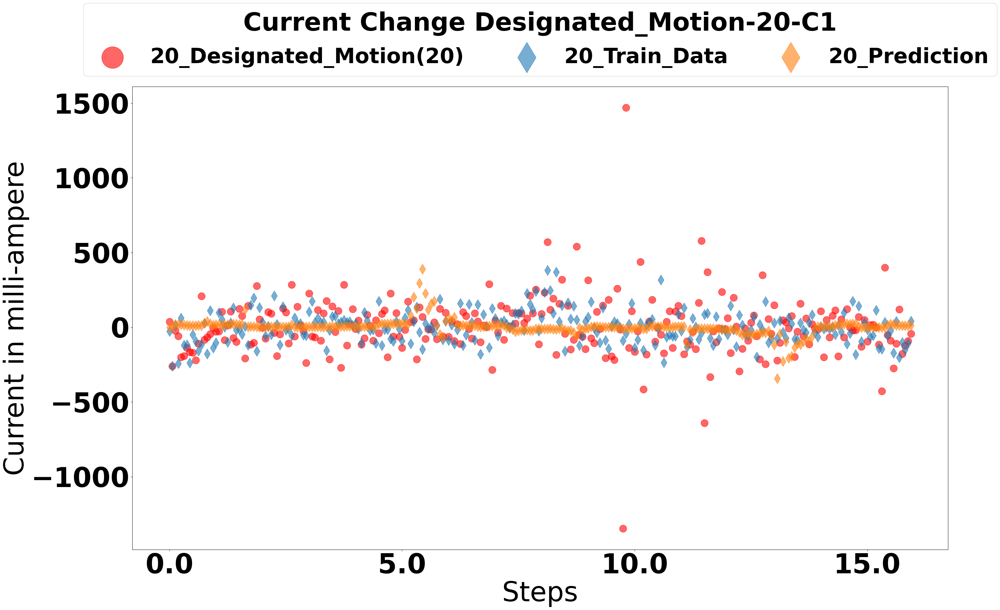

In [64]:
#plot variance
a=65
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : a}
plt.rc('font', **font)

# time_x=list(range(x.shape[0]))
# time_xx=time_x[d*q+qs:(1+d)*q-cy]
# xx=x[d*q+qs:(1+d)*q-cy]
# yy=y[d*q+qs:-1+(1+d)*q-cy]
# yy_=y_[d*q+qs:-1+(1+d)*q-cy]
plt.figure(figsize=(35,20))
plt.scatter(time_xx,xx,s=300,marker="o",color="r",label=str(angles_list[d])+"_Designated_Motion(20)",alpha=0.6)#,,color=cvar_i["des_ang"]
plt.scatter(time_xx,yy,s=300,marker="d",label=str(angles_list[d])+"_Train_Data",alpha=0.6)#,color=c1 #
plt.scatter(time_xx,yy_,s=300,marker="d",label=str(angles_list[d])+"_Prediction",alpha=0.6)
plt.legend(
loc="lower center",
bbox_to_anchor=[0.5, 1],
ncol=diff,
fontsize=50,
title_fontsize=60,
markerscale=3,
title ="Current Change Designated_Motion-20-" + a_i[i][j])
plt.xlabel("Steps")
labels = np.array(time_xx[::80])*0.0625
                # # plt.plot(x,y, 'r')
plt.xticks(time_xx[::80], labels)#, rotation='vertical')
# plt.xticks(range(0, 256+32, 32), rotation=60,fontsize=50)
# plt.yticks( fontsize=55-6)
plt.ylabel("Current in milli-ampere")
# plt.plot(time_x,x)#,c=cm.tab10(Part[u]),linewidth=3),color=colr[cc]
# plt.plot(time_x,y)#,color=colr[cc*2]
# plt.plot(time_x,y)
plt.show()

## variance aggrigation

In [ ]:
def highlight(x,zn="50",z=0):
    # m={}
    # for z,zn in enumerate(["20","35"]):
        
    c1 = 'background-color: red'
    c2 = 'background-color: black' 
    #if want set no default colors 
    #c2 = ''  
    print(x)
    print(x[zn],x[zn][z*3])
    m1 = x[zn] > x[zn][z*3]
    df1 = pd.DataFrame(c2, index=x.index, columns=x.columns)
    df1.loc[m1, zn] = c1
    return df1

df_3d_sum_all.style.apply(highlight, axis=None)

                       50             35             20  Motion Generation     Predicted    Train data
test_angle                                                                                            
20          193412.041529  256988.478969  120056.636595      588668.161075  20671.891459  82769.132690
25          188047.930749  187971.691609  180270.762973      658883.654596  29125.938516  62129.906419
30          212185.851617  156971.029136  206462.218367      381303.703523  21311.535894  77795.841743
35           96470.647672  148924.048254  210961.133845      404327.204105  23848.812089  47772.111271
40          122823.176761  100067.657130  118384.880836      478995.763879  25987.308505  51787.640667
45           79783.916858  151941.346673  143667.318566      485241.398223  28113.298653  49265.786516
50          252032.656309  133925.300597  217619.509252      764088.829396  27409.411808  88566.719334
test_angle
20    193412.041529
25    188047.930749
30    212185.851617
35

,50,35,20,Motion Generation,Predicted,Train data
test_angle,,,,,,
20,193412.041529,256988.478969,120056.636595,588668.161075,20671.891459,82769.132690
25,188047.930749,187971.691609,180270.762973,658883.654596,29125.938516,62129.906419
30,212185.851617,156971.029136,206462.218367,381303.703523,21311.535894,77795.841743
35,96470.647672,148924.048254,210961.133845,404327.204105,23848.812089,47772.111271
40,122823.176761,100067.657130,118384.880836,478995.763879,25987.308505,51787.640667
45,79783.916858,151941.346673,143667.318566,485241.398223,28113.298653,49265.786516
50,252032.656309,133925.300597,217619.509252,764088.829396,27409.411808,88566.719334


no-scale Mean current


,50,35,20,MG,PRED,AC
test_angle,,,,,,
20,166353.395198,177437.885399,129879.390697,483217.839040,15161.940653,50835.801229
25,156851.006215,123653.559257,82466.991452,525781.327246,12812.381385,52031.562449
30,170670.429356,132218.782699,69669.679207,345109.875916,12463.927577,55028.176552
35,86529.655593,145814.411705,67642.678178,381750.157693,13651.956492,42444.005550
40,89479.002465,119897.534659,148606.040623,433071.452944,14312.368445,55709.513170
45,70482.947630,178054.936526,133325.130630,447519.649516,14693.034325,45121.107846
50,130838.136927,127365.389141,109752.387560,578089.237518,15365.037909,52127.464041


no-scale Max current


,50,35,20,MG,PRED,AC
test_angle,,,,,,
20,193412.041529,273680.152604,178283.085882,588668.161075,20671.891459,57166.204601
25,188047.930749,181741.748138,98594.503320,658883.654596,29125.938516,76149.975546
30,212185.851617,172853.364317,85967.782173,381303.703523,21311.535894,67850.889017
35,96470.647672,216107.149969,88404.760202,404327.204105,23848.812089,47363.485846
40,122823.176761,181655.179764,192509.084911,478995.763879,25987.308505,64539.961933
45,79783.916858,279999.414139,202918.082751,485241.398223,28113.298653,50365.641529
50,252032.656309,190691.755484,148945.682103,764088.829396,27409.411808,61692.532950


no-scale Min current


,50,35,20,MG,PRED,AC
test_angle,,,,,,
20,141768.538515,117306.380116,86715.592601,367632.903968,7635.697085,43555.664771
25,99406.367479,87465.507276,67727.298609,387117.680132,7413.424918,41193.130931
30,117564.354246,102437.087056,62089.133963,312347.329213,9994.937957,44600.171293
35,72732.252959,98338.815287,46312.776378,360380.313465,10517.782342,38927.878232
40,64466.009789,85104.339997,102713.518825,378888.736872,10743.608638,46235.575822
45,59536.499075,116325.660738,63471.555781,413825.039001,10963.366737,33850.562913
50,73492.055188,84560.222946,84281.470374,426273.631357,11563.299825,44205.780545


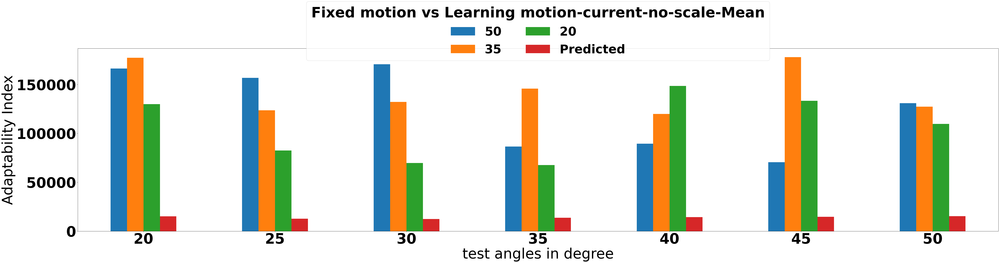

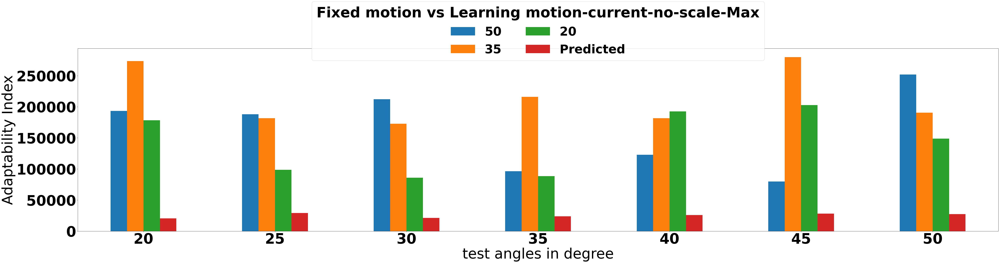

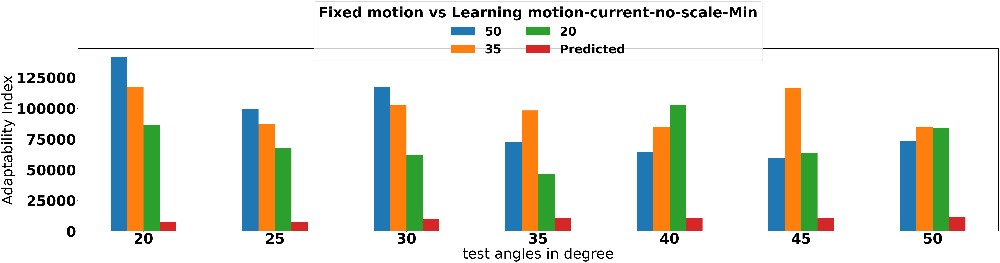

In [36]:
scaling = "nor"
func= "Mean"
for scaling in ["no-scale"]:#,"nz","mm"]:
    for func in ["Mean","Max","Min"]:
        for k in list(a_i.keys())[1:]:
            df_3d_sum_all= df_3d_dict_agg[scaling][func][k]
            print(scaling,func,k)
            display(df_3d_sum_all)
            # df_3d_sum_all.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\503520_MG_PRED_T_{}-{}-{}_.csv".format(scaling,func,k),index=True)

            # df_3a.reset_index().plot(x="test_angle",y=["50","35","20"],subplots=True,layout=(1,3),kind="bar",figsize=(90,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index")#.legend(title = "Adaptability Index for designated motion",ncol = 3)legend =True
            df_3d_sum_all.columns=["50","35","20","Motion Generation","Predicted","Train data"]#,"Motion Generation","Predicted"
            # # df1.columns =["Weight","Top-Bottom","Side-Bottom","Side-Side","6plate"]
            df_3d_sum_all.reset_index().plot(x="test_angle",y=["50","35","20","Predicted"] ,kind="bar",legend =True,figsize=(75,15),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Fixed motion vs Learning motion-" + k+"-"+scaling+"-"+func,ncol = 2,fontsize = 55,bbox_to_anchor=[0.5, .9],loc="lower center")
            # df_3d_sum_all.reset_index().plot(x="test_angle",y=["50","35","20"],subplots=True,layout=(1,3),kind="bar",figsize=(90,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index",title = "Recorded motion vs Learning motion-" + k+"-"+scaling+"-"+func)#.legend(title = "Recorded motion vs Learning motion-" + k+"-"+scaling+"-"+func,ncol = 2,fontsize = 55,bbox_to_anchor=[0.5, .9],loc="lower center")#.legend(title = "Adaptability Index for designated motion",ncol = 3)legend =True

            # plt.savefig(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\Bar-503520_MG_PRED_T_{}-{}-{}_.pdf".format(scaling,func,k))
        # plt.legend(
    #     loc="lower center",
    #     bbox_to_anchor=[0.5, 0.8],
    #     ncol=3,
    #     title = "Recorded vs Learning",
    #     markerscale=1)

In [ ]:
df_3d

In [ ]:
df_3d_sum=df_3d.groupby(level=["test_angle"])
# df_3d_sum.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\50-35-20_MG_PRED_AC_sum.csv",index=True)

df_3d_sum

,50,35,20,MG,PRED,AC
test_angle,,,,,,
20,831773.249335,1.028176e+06,491760.467274,2.416093e+06,75812.849889,304717.529448
25,784256.485876,5.962035e+05,723724.621207,2.628910e+06,64064.951697,249041.089565
30,853353.601580,6.074257e+05,737264.185864,1.725554e+06,62323.427034,282594.774447
35,432649.732764,5.363040e+05,592217.465969,1.908754e+06,68262.422953,225658.037786
40,447396.467126,3.569799e+05,393992.467469,2.165362e+06,71565.326062,234915.803526
45,352416.192950,5.411262e+05,504576.064557,2.237606e+06,73470.863783,234683.848214
50,654192.139434,5.893100e+05,622287.178102,2.890453e+06,76830.938892,297894.562503


In [ ]:
x="A1"
"A" in x

True

,50,35,20,MG,PRED,AC
test_angle,,,,,,
20,0.797023,2.135716,1.702759,1.504704,1.589005,1.702759
25,3.436896,2.135716,1.702759,1.466222,1.642160,1.820351
30,3.436896,2.135716,1.702759,0.986427,1.319558,2.137582
35,3.436896,2.135716,1.702759,1.754194,1.893586,2.135716
40,3.436896,2.135716,1.702759,1.121811,1.435200,3.033343
45,3.436896,2.135716,1.702759,0.683854,0.878402,3.598518
50,3.436896,2.135716,1.702759,0.687232,0.869664,3.436896


,50,35,20,MG,PRED,AC
test_angle,,,,,,
20,0.000006,0.000005,0.000010,0.000002,0.000066,0.000016
25,0.000006,0.000008,0.000007,0.000002,0.000078,0.000020
30,0.000006,0.000008,0.000007,0.000003,0.000080,0.000018
35,0.000012,0.000009,0.000008,0.000003,0.000073,0.000022
40,0.000011,0.000014,0.000013,0.000002,0.000070,0.000021
45,0.000014,0.000009,0.000010,0.000002,0.000068,0.000021
50,0.000008,0.000008,0.000008,0.000002,0.000065,0.000017


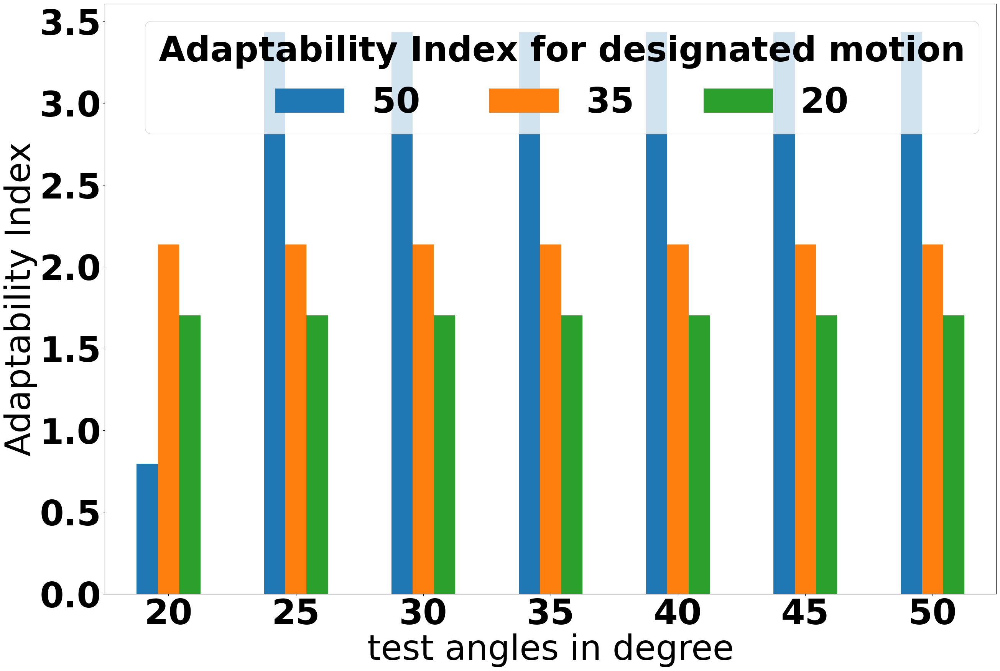

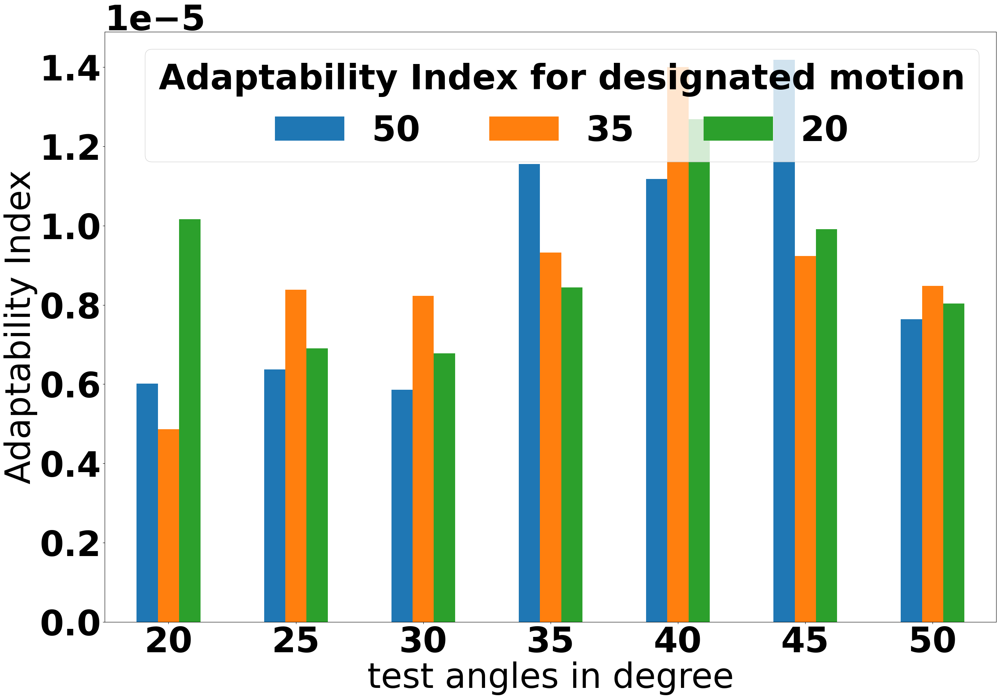

In [ ]:
# df_3d=df_3d_dict_agg
# df_3d_=df_3d.groupby(level=["test_angle","servo_values"]).mean()
# display(df_3d_)
df_3d_SV={}
df_3d_SV_sum={}
# df_count = df_3d_.groupby(level=["test_angle","servo_values"]).apply(lambda x: x if "A" in x)
for k in a_i.keys():
    df_3d_SV[k]=df_3d_[df_3d_.index.get_level_values('servo_values').isin(a_i[k])]#.xs(2, item=["A1","A2","A3"])
    df_3d_SV_sum[k]=df_3d_SV[k].groupby(level=["test_angle"]).sum()
    # df_3d_SV_sum[k]=df_3d_SV_sum[k]#.apply(lambda x: 1/x)

    df_3d_SV_sum[k].reset_index().plot(x="test_angle",y=["50","35","20"	] ,kind="bar",legend =True,figsize=(30,20),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index for designated motion",ncol = 3)

    # df_3d_A
    # display(df_3d_SV[k])
    display(df_3d_SV_sum[k])

# # df_3d_sum.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\50-35-20_MG_PRED_AC_cyc_sum.csv",index=True)

# df_3d_sum
# # df_count

In [ ]:
df_3d_sum_=df_3d_sum[["50","35","20"]]#.plot.bar()
dict_ = {'test_angle':["0", "60"],
        "50":[321761.1, 1046505],
        "35":[6423285.2, 1826925],
        "20":[7102644.2,4183729]
       }
  
df2 = pd.DataFrame(dict_)
display(df2)
  
# df3 = pd.concat([df1, df2], ignore_index = True)
df_3d_sum_n=pd.concat([df_3d_sum_.reset_index(),df2],ignore_index = True)
df_3d_sum_n[["50","35","20"]]=df_3d_sum_n[["50","35","20"]].apply(lambda x: 1/x)
display(df_3d_sum_n.set_index(["test_angle"]))


,test_angle,50,35,20
0,0,321761.1,6423285.2,7102644.2
1,60,1046505.0,1826925.0,4183729.0


,50,35,20
test_angle,,,
20,1.202251e-06,9.725961e-07,2.033510e-06
25,1.275093e-06,1.677280e-06,1.381741e-06
30,1.171847e-06,1.646292e-06,1.356366e-06
35,2.311339e-06,1.864614e-06,1.688569e-06
40,2.235154e-06,2.801278e-06,2.538120e-06
45,2.837554e-06,1.847998e-06,1.981862e-06
50,1.528603e-06,1.696900e-06,1.606975e-06
0,3.107896e-06,1.556836e-07,1.407926e-07
60,9.555616e-07,5.473678e-07,2.390212e-07


In [ ]:
df=df_3d_sum_n
df["new"] = range(1,len(df)+1)
df.loc[df.index==7, 'new'] = 0
df_3d_sum_n=df.sort_values("new").drop('new', axis=1)
df_3d_sum_n
# df

,test_angle,50,35,20
7,0,3.107896e-06,1.556836e-07,1.407926e-07
0,20,1.202251e-06,9.725961e-07,2.033510e-06
1,25,1.275093e-06,1.677280e-06,1.381741e-06
2,30,1.171847e-06,1.646292e-06,1.356366e-06
3,35,2.311339e-06,1.864614e-06,1.688569e-06
4,40,2.235154e-06,2.801278e-06,2.538120e-06
5,45,2.837554e-06,1.847998e-06,1.981862e-06
6,50,1.528603e-06,1.696900e-06,1.606975e-06
8,60,9.555616e-07,5.473678e-07,2.390212e-07


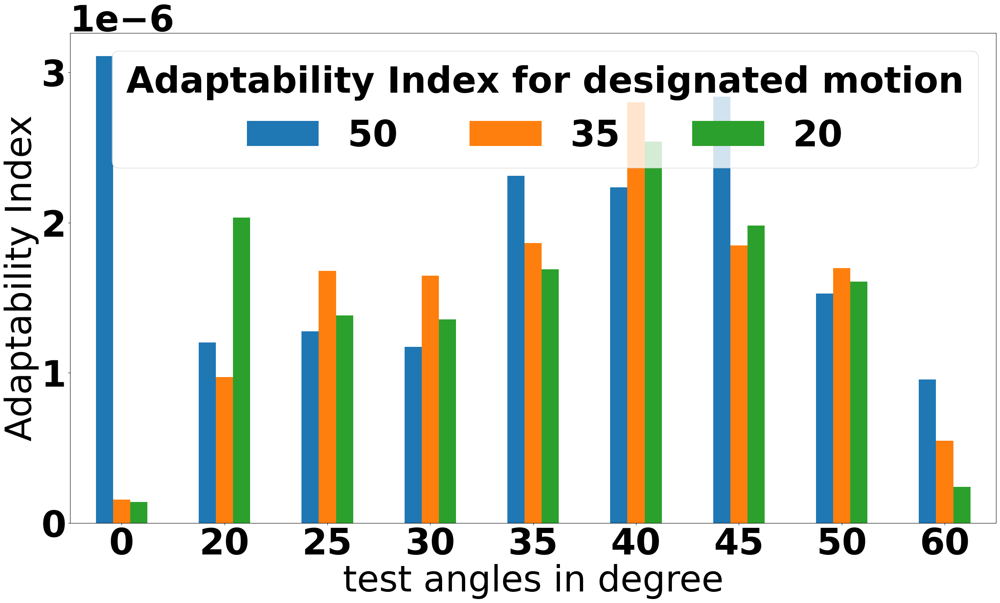

In [ ]:
df_3d_sum_n.plot(x="test_angle" ,kind="bar",legend =True,figsize=(30,16),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Adaptability Index for designated motion",ncol = 3)

#,y=["50","35","20","Motion Generation","Predicted"]

In [ ]:
df_3d_sum_all=df_3d_sum.apply(lambda x: 1/x)
df_3d_sum_all

,50,35,20,MG,PRED,AC
test_angle,,,,,,
20,0.000001,9.725961e-07,0.000002,4.138914e-07,0.000013,0.000003
25,0.000001,1.677280e-06,0.000001,3.803858e-07,0.000016,0.000004
30,0.000001,1.646292e-06,0.000001,5.795239e-07,0.000016,0.000004
35,0.000002,1.864614e-06,0.000002,5.239021e-07,0.000015,0.000004
40,0.000002,2.801278e-06,0.000003,4.618166e-07,0.000014,0.000004
45,0.000003,1.847998e-06,0.000002,4.469063e-07,0.000014,0.000004
50,0.000002,1.696900e-06,0.000002,3.459665e-07,0.000013,0.000003


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


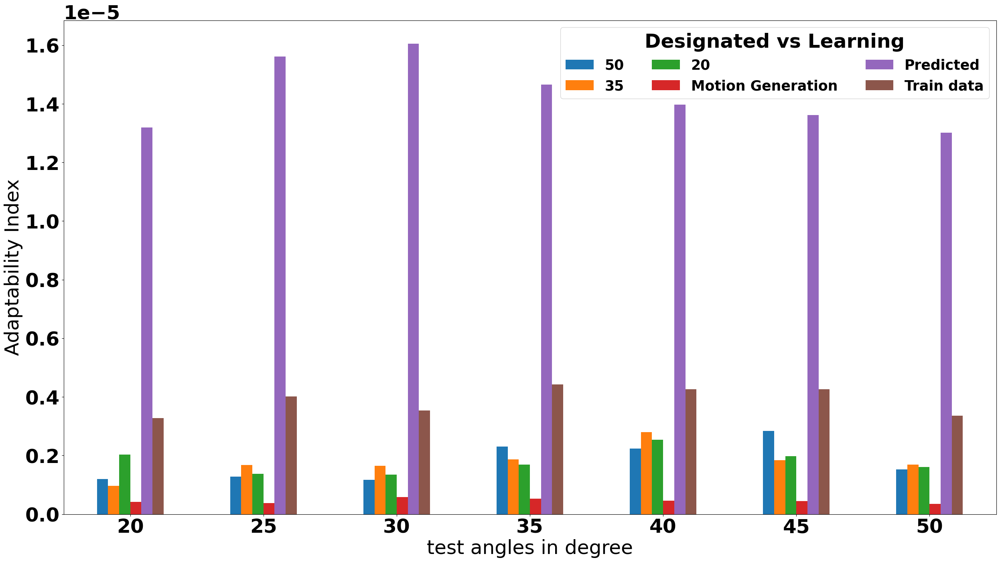

In [ ]:
import matplotlib.cm as cm
a=35
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : a}
plt.rc('font', **font)
# index = ["Weight","Top-Bottom","Side-Bottom","Side-Side"]
# df1= pd.read_csv('B4after.csv')
df_3d_sum_all.columns=["50","35","20","Motion Generation","Predicted","Train data"]
# df1.columns =["Weight","Top-Bottom","Side-Bottom","Side-Side","6plate"]
df_3d_sum_all.reset_index().plot(x="test_angle",y=["50","35","20","Motion Generation","Predicted","Train data"] ,kind="bar",legend =True,figsize=(30,16),rot=0,xlabel="test angles in degree",ylabel="Adaptability Index").legend(title = "Designated vs Learning" ,ncol = 3,fontsize = 25)
# plt.xlabel="test angles in degree"
# plt.ylabel="Adaptability Index"
# plt.legend(title = "Adaptability Index" ,ncol = 1)
# cmap = cm.get_cmap('Spectral') # Colour map (there are many others),c={"Top": cm.tab10("b"), "Bottom": "green", "Middle": "Orange"}

# fig, ax = plt.subplots(1)
# Now

<Figure size 2700x2000 with 0 Axes>

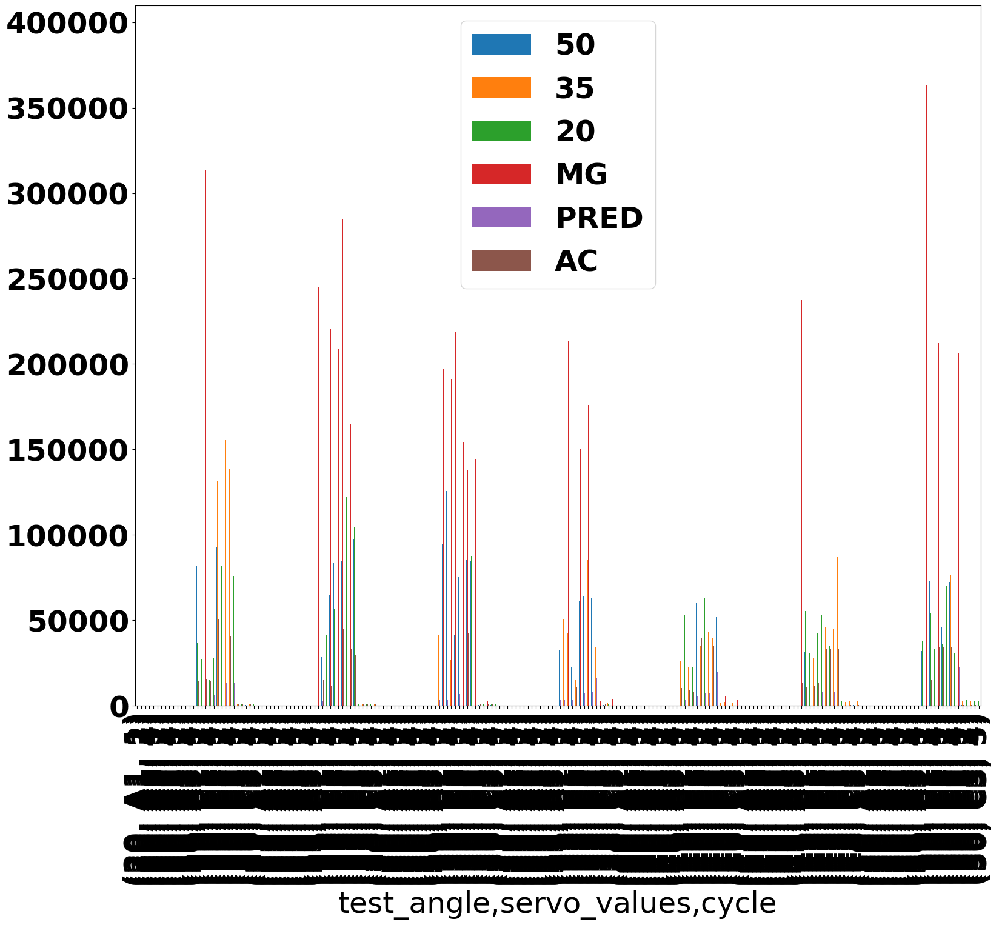

In [ ]:
#save df
%matplotlib inline
plt.figure(figsize=(27,20));
df_3d.plot.bar(figsize=(18,15),label=True)
plt.show()
# df_3d.to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\{}".format(_dir),index=False)

In [ ]:
df_3d.plot.scatter(x=50,y="C1")

IndexError: index 50 is out of bounds for axis 0 with size 6

In [ ]:
# pd.MultiIndex.from_frame(df_3d)
inx = df_3d.index
inx=list(inx)
inx

[('20', 'C1'),
 ('20', 'C2'),
 ('20', 'C3'),
 ('25', 'C1'),
 ('25', 'C2'),
 ('25', 'C3'),
 ('30', 'C1'),
 ('30', 'C2'),
 ('30', 'C3'),
 ('35', 'C1'),
 ('35', 'C2'),
 ('35', 'C3'),
 ('40', 'C1'),
 ('40', 'C2'),
 ('40', 'C3'),
 ('45', 'C1'),
 ('45', 'C2'),
 ('45', 'C3'),
 ('50', 'C1'),
 ('50', 'C2'),
 ('50', 'C3')]

In [ ]:
# %matplotlib 

for ix1,ix2 in inx[:3]:
    plt.figure();
    df_3d_ = df_3d.xs(ix2, level="servo_values")
    # display(df_3d_)
    df_3d_.plot.bar(figsize=(18,15),label=True,title="variance_"+ix2)#to_csv(r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping\Analysis\50-35-20_MG_PRED_AC{}.csv".format(ix2),index=True)


In [61]:
#filter
# display(df_3d.groupby(level=["test_angle","servo_values"]))
# df_3d.xs(1, level="cycle")
print(df_3d.groupby(level=["test_angle","servo_values"]))

In [57]:
df_3dt = df_3d.T

# df_3dt.groupby
df_3dt.xs("C1", level="third")

TypeError: Index must be a MultiIndex

In [64]:
df__=df_3d.groupby(level=["test_angle","servo_values"])#.describe(include="all")
df__

In [ ]:
#analyze the dataframe properties
display(data_des[des_angle_])
display(data_mg)

,step,time,A1,A2,A3,C1,C2,C3,trail,C1_,dC1_,C2_,dC2_,C3_,dC3_
0,0.0,1.674135e+09,213360.0,90492.0,247519.0,-201.0,-1570.0,15.0,30,-201.0,NaN,-1570.0,NaN,15.0,NaN
1,1.0,1.674135e+09,213295.0,90528.0,247520.0,-413.0,-1505.0,10.0,30,-413.0,-212.0,-1505.0,65.0,10.0,-5.0
2,2.0,1.674135e+09,213167.0,90601.0,247523.0,-624.0,-1550.0,52.0,30,-624.0,-211.0,-1550.0,-45.0,52.0,42.0
3,3.0,1.674135e+09,212974.0,90711.0,247528.0,-727.0,-1305.0,53.0,30,-727.0,-103.0,-1305.0,245.0,53.0,1.0
4,4.0,1.674135e+09,212718.0,90858.0,247535.0,-770.0,-1405.0,17.0,30,-770.0,-43.0,-1405.0,-100.0,17.0,-36.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8955,1275.0,1.674141e+09,212707.0,90864.0,247535.0,389.0,-4783.0,-312.0,42,389.0,37.0,-4783.0,-200.0,-312.0,7.0
8956,1276.0,1.674141e+09,212963.0,90717.0,247529.0,174.0,-4813.0,-287.0,42,174.0,-215.0,-4813.0,-30.0,-287.0,25.0
8957,1277.0,1.674141e+09,213156.0,90608.0,247524.0,135.0,-4742.0,-280.0,42,135.0,-39.0,-4742.0,71.0,-280.0,7.0
8958,1278.0,1.674141e+09,213285.0,90534.0,247520.0,-21.0,-4534.0,-281.0,42,-21.0,-156.0,-4534.0,208.0,-281.0,-1.0


,time,A1,A2,A3,A1p,A2p,A3p,C1,C2,C3,...,Hid22,Hid23,Hid24,Hid25,C1_,dC1_,C2_,dC2_,C3_,dC3_
0.0,1.673533e+09,213360.0,90491.0,247519.0,194696.218750,94688.914062,247850.781250,-700.0,-1150.0,184.0,...,0.318747,0.014873,0.0,0.0,-700.0,NaN,-1150.0,NaN,184.0,NaN
1.0,1.673533e+09,194696.0,94688.0,247850.0,194742.031250,94645.687500,247848.828125,-1484.0,-1242.0,159.0,...,0.334112,0.017363,0.0,0.0,-1484.0,-784.0,-1242.0,-92.0,159.0,-25.0
2.0,1.673533e+09,194742.0,94645.0,247848.0,196611.078125,94937.171875,247892.796875,-1272.0,-1449.0,146.0,...,0.660237,-0.025676,0.0,0.0,-1272.0,212.0,-1449.0,-207.0,146.0,-13.0
3.0,1.673533e+09,196611.0,94937.0,247892.0,198228.859375,95098.015625,247911.640625,371.0,-1059.0,276.0,...,0.875271,-0.085619,0.0,0.0,371.0,1643.0,-1059.0,390.0,276.0,130.0
4.0,1.673533e+09,198228.0,95098.0,247911.0,199163.890625,95159.507812,247918.953125,603.0,-919.0,308.0,...,1.066267,-0.134620,0.0,0.0,603.0,232.0,-919.0,140.0,308.0,32.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8955.0,1.673536e+09,149835.0,110650.0,249041.0,147814.437500,111660.195312,249105.937500,-1233.0,-986.0,226.0,...,2.812782,-1.342534,0.0,0.0,-1233.0,-118.0,-986.0,-56.0,226.0,1.0
8956.0,1.673536e+09,147814.0,111660.0,249105.0,146036.953125,112547.460938,249162.593750,-874.0,-745.0,199.0,...,2.772066,-1.372196,0.0,0.0,-874.0,359.0,-745.0,241.0,199.0,-27.0
8957.0,1.673536e+09,146036.0,112547.0,249162.0,144281.546875,113419.187500,249218.265625,-1077.0,-516.0,212.0,...,2.735517,-1.397646,0.0,0.0,-1077.0,-203.0,-516.0,229.0,212.0,13.0
8958.0,1.673536e+09,144281.0,113419.0,249218.0,143048.703125,114068.015625,249260.093750,-1032.0,-813.0,166.0,...,2.699637,-1.421955,0.0,0.0,-1032.0,45.0,-813.0,-297.0,166.0,-46.0


In [ ]:
data_mg.describe(include="all")


,time,A1,A2,A3,A1p,A2p,A3p,C1,C2,C3,...,Hid22,Hid23,Hid24,Hid25,C1_,dC1_,C2_,dC2_,C3_,dC3_
count,8.960000e+03,8960.000000,8960.000000,8960.000000,8960.000000,8960.000000,8960.000000,8960.000000,8960.000000,8960.000000,...,8960.000000,8960.000000,8960.0,8960.0,8960.000000,8959.000000,8960.000000,8959.000000,8960.000000,8959.000000
mean,1.673535e+09,117829.886607,124385.652009,249899.061384,117786.236738,124401.105995,249900.621381,-95.532813,-2103.220536,-28.566071,...,0.844139,-2.076316,0.0,0.0,-95.532813,0.005135,-2103.220536,0.041188,-28.566071,0.000558
std,8.060611e+02,57779.893838,23434.652372,1589.132600,57733.906531,23421.189611,1588.116149,1214.454885,1709.580346,215.792499,...,1.470651,1.122321,0.0,0.0,1214.454885,500.087005,1709.580346,446.729045,215.792499,70.733039
min,1.673533e+09,25780.000000,90491.000000,247519.000000,25780.664062,92104.632812,247653.750000,-4346.000000,-6508.000000,-1515.000000,...,-1.162578,-4.166621,0.0,0.0,-4346.000000,-4453.000000,-6508.000000,-4577.000000,-1515.000000,-1087.000000
25%,1.673534e+09,64035.000000,102016.750000,248402.750000,64035.354492,102049.583984,248406.921875,-964.250000,-3812.000000,-160.000000,...,-0.472337,-3.075865,0.0,0.0,-964.250000,-172.000000,-3812.000000,-156.000000,-160.000000,-15.000000
50%,1.673535e+09,113644.500000,122213.000000,249750.000000,113644.597656,122215.507812,249750.929688,-279.500000,-1196.000000,-2.500000,...,0.711162,-2.212046,0.0,0.0,-279.500000,-2.000000,-1196.000000,-9.000000,-2.500000,-1.000000
75%,1.673535e+09,174772.000000,146409.750000,251231.250000,174699.644531,146410.261719,251231.960938,955.250000,-605.000000,125.250000,...,2.018075,-1.229724,0.0,0.0,955.250000,166.000000,-605.000000,145.000000,125.250000,15.000000
max,1.673536e+09,213360.000000,173442.000000,253196.000000,205242.609375,173442.437500,253196.625000,3819.000000,1421.000000,718.000000,...,4.725295,0.243063,0.0,0.0,3819.000000,4062.000000,1421.000000,4902.000000,718.000000,1020.000000


In [ ]:
data_des[des_angle_].describe(include="all")


,step,time,A1,A2,A3,C1,C2,C3,trail,C1_,dC1_,C2_,dC2_,C3_,dC3_
count,8960.000000,8.960000e+03,8960.000000,8960.000000,8960.000000,8960.000000,8960.000000,8960.000000,8960.000000,8960.000000,8953.000000,8960.000000,8953.000000,8960.000000,8953.000000
mean,639.500000,1.674138e+09,106679.503906,151332.503906,250281.503906,287.663728,-1602.027009,-184.896429,36.000000,287.663728,0.192561,-1602.027009,-2.699765,-184.896429,-0.138724
std,369.524681,2.625095e+03,75440.273513,43024.595418,1953.919229,1720.764120,2274.557776,346.375253,4.000223,1720.764120,206.375783,2274.557776,247.214978,346.375253,42.942744
min,0.000000,1.674135e+09,0.000000,90492.000000,247519.000000,-5559.000000,-6100.000000,-1744.000000,30.000000,-5559.000000,-1932.000000,-6100.000000,-1704.000000,-1744.000000,-334.000000
25%,319.750000,1.674135e+09,31709.000000,108575.750000,248340.000000,-838.250000,-3774.250000,-282.000000,32.000000,-838.250000,-102.000000,-3774.250000,-118.000000,-282.000000,-21.000000
50%,639.500000,1.674140e+09,106679.500000,151332.500000,250281.500000,255.000000,-942.500000,-158.000000,36.000000,255.000000,-8.000000,-942.500000,-13.000000,-158.000000,-2.000000
75%,959.250000,1.674141e+09,181650.000000,194089.250000,252223.000000,1666.250000,339.250000,54.000000,40.000000,1666.250000,93.000000,339.250000,98.000000,54.000000,20.000000
max,1279.000000,1.674141e+09,213360.000000,212174.000000,253045.000000,3460.000000,4033.000000,391.000000,42.000000,3460.000000,3333.000000,4033.000000,1806.000000,391.000000,354.000000


In [ ]:
#add slope angle to differentiate each trail and cycle
# data_mg["step"]=data_mg.index
# data_mg.head(5)

,time,A1,A2,A3,A1p,A2p,A3p,C1,C2,C3,...,Hid23,Hid24,Hid25,C1_,dC1_,C2_,dC2_,C3_,dC3_,step
0.0,1.673533e+09,213360.0,90491.0,247519.0,194696.218750,94688.914062,247850.781250,-700.0,-1150.0,184.0,...,0.014873,0.0,0.0,-700.0,NaN,-1150.0,NaN,184.0,NaN,0.0
1.0,1.673533e+09,194696.0,94688.0,247850.0,194742.031250,94645.687500,247848.828125,-1484.0,-1242.0,159.0,...,0.017363,0.0,0.0,-1484.0,-784.0,-1242.0,-92.0,159.0,-25.0,1.0
2.0,1.673533e+09,194742.0,94645.0,247848.0,196611.078125,94937.171875,247892.796875,-1272.0,-1449.0,146.0,...,-0.025676,0.0,0.0,-1272.0,212.0,-1449.0,-207.0,146.0,-13.0,2.0
3.0,1.673533e+09,196611.0,94937.0,247892.0,198228.859375,95098.015625,247911.640625,371.0,-1059.0,276.0,...,-0.085619,0.0,0.0,371.0,1643.0,-1059.0,390.0,276.0,130.0,3.0
4.0,1.673533e+09,198228.0,95098.0,247911.0,199163.890625,95159.507812,247918.953125,603.0,-919.0,308.0,...,-0.134620,0.0,0.0,603.0,232.0,-919.0,140.0,308.0,32.0,4.0


In [ ]:
# for df in [data_mg,data_des[des_angle_]]:
#     df

data_des[des_angle_]['Slope_Angle'] = data_mg[""]#np.arange(len (data_mg)) // q + 1
# data_mg.drop(columns=['B'])

,time,A1,A2,A3,A1p,A2p,A3p,C1,C2,C3,...,Hid23,Hid24,Hid25,C1_,dC1_,C2_,dC2_,C3_,dC3_,step
0.0,1.673533e+09,213360.0,90491.0,247519.0,194696.218750,94688.914062,247850.781250,-700.0,-1150.0,184.0,...,0.014873,0.0,0.0,-700.0,NaN,-1150.0,NaN,184.0,NaN,0.0
1.0,1.673533e+09,194696.0,94688.0,247850.0,194742.031250,94645.687500,247848.828125,-1484.0,-1242.0,159.0,...,0.017363,0.0,0.0,-1484.0,-784.0,-1242.0,-92.0,159.0,-25.0,1.0
2.0,1.673533e+09,194742.0,94645.0,247848.0,196611.078125,94937.171875,247892.796875,-1272.0,-1449.0,146.0,...,-0.025676,0.0,0.0,-1272.0,212.0,-1449.0,-207.0,146.0,-13.0,2.0
3.0,1.673533e+09,196611.0,94937.0,247892.0,198228.859375,95098.015625,247911.640625,371.0,-1059.0,276.0,...,-0.085619,0.0,0.0,371.0,1643.0,-1059.0,390.0,276.0,130.0,3.0
4.0,1.673533e+09,198228.0,95098.0,247911.0,199163.890625,95159.507812,247918.953125,603.0,-919.0,308.0,...,-0.134620,0.0,0.0,603.0,232.0,-919.0,140.0,308.0,32.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8955.0,1.673536e+09,149835.0,110650.0,249041.0,147814.437500,111660.195312,249105.937500,-1233.0,-986.0,226.0,...,-1.342534,0.0,0.0,-1233.0,-118.0,-986.0,-56.0,226.0,1.0,8955.0
8956.0,1.673536e+09,147814.0,111660.0,249105.0,146036.953125,112547.460938,249162.593750,-874.0,-745.0,199.0,...,-1.372196,0.0,0.0,-874.0,359.0,-745.0,241.0,199.0,-27.0,8956.0
8957.0,1.673536e+09,146036.0,112547.0,249162.0,144281.546875,113419.187500,249218.265625,-1077.0,-516.0,212.0,...,-1.397646,0.0,0.0,-1077.0,-203.0,-516.0,229.0,212.0,13.0,8957.0
8958.0,1.673536e+09,144281.0,113419.0,249218.0,143048.703125,114068.015625,249260.093750,-1032.0,-813.0,166.0,...,-1.421955,0.0,0.0,-1032.0,45.0,-813.0,-297.0,166.0,-46.0,8958.0


In [ ]:
#Color

colr= cm.tab20(range(diff*trail))


In [ ]:
#plot
x = data_des[des_angle_]["d"+a_i[i][j]+"_"][:int(q*an)]#df_AN[p][e][k][::r]
# print(q*t,(t+1)*q)
y = data_des[des_angle_]["d"+a_i[i][j]+"_"][:int(q*an)]#[int(q*t):int((t+1)*q)-1]#y_positions[a_i[i][j]+"_"][int(q*t):int((t+1)*q)]#df_DIL_All[p][e][u][D][::r]

print(x.shape,y.shape)
time_x=list(range(x.shape[0]))
for d in range(an):
    plt.figure(figsize=(27,20))
    c=colr[d]
    c1=colr[d*2]
    print(d,angles_list[d],"shapestx,x,y",len(time_x[d*q:(1+d)*q]),x[d*q:(1+d)*q].shape,y[d*q:(1+d)*q].shape)
    plt.scatter(time_x[d*q:(1+d)*q],x[d*q:(1+d)*q],s=30,marker="o",label=str(angles_list[d])+"_DM")#,,color=c
    plt.scatter(time_x[d*q:(1+d)*q],y[d*q:-1+(1+d)*q],s=30,marker="d",label=str(angles_list[d])+"_ML")#,color=c1 #
# plt.scatter(time_x,y,s=30,label = angle_trails[a])

# plt.scatter(time_x,x,s=30,marker=".",label="Designated Motion")#,color=c,label=angles_list[cc])#,label=str(partz[u]),s=300,c=cm.tab10(Part[u]))#c=cc[Part[u]])
# plt.scatter(time_x,y,s=30,marker="*",label="Motion Generation")
    plt.legend(title ="Change in current for Train data vs Motion generation_" + a_i[i][j]+ "-"+str(angles_list[d]), prop={'size': 20},fontsize=25, ncol=an,handleheight=1.8, labelspacing=0)

    # plt.plot(time_x,x)#,c=cm.tab10(Part[u]),linewidth=3),color=colr[cc]
    # plt.plot(time_x,y)#,color=colr[cc*2]
    # plt.plot(time_x,y)
    plt.show()
    # break
# break

## Video frame extraction

In [73]:
import cv2
import os
# your function
def video2frames( video_file,video, output_path ):
    if not os.path.exists(output_path):
        os.makedirs(output_path)
    cap = cv2.VideoCapture(video_path)
    print(cap,cap.isOpened())
    index = 0        
    while cap.isOpened():
        Ret, Mat = cap.read()
        print(Ret, Mat)
        if Ret:
            index += 1
            if index % 29 != 0:
                continue
            cv2.imwrite(output_path + '/' + str(index) + '.jpg', Mat)
            cv2.waitKey(1)
        else:
            Ret = False
    cap.release()
    return

def multiple_video2frames( video_path, output_path):
    list_videos = os.listdir(video_path)
    print(list_videos)
    for video in list_videos:
        video_base = os.path.basename(video)
        input_file = video_path + '\\' + video
        out_path = output_path + '\\' + video_base
        print(input_file,out_path)
        video2frames(input_file,video, out_path)
    return

# run all
video_path = r'C:\Users\81809\Downloads\Onedrivee\FAll2022\thesis\Revise_th\Videos\Vid' # all videos
output_path = r'C:\Users\81809\Downloads\Onedrivee\FAll2022\thesis\Revise_th\Videos\Frames' # location on ur pc
multiple_video2frames( video_path, output_path )

['Binc50.mp4']
C:\Users\81809\Downloads\Onedrivee\FAll2022\thesis\Revise_th\Videos\Vid\Binc50.mp4 C:\Users\81809\Downloads\Onedrivee\FAll2022\thesis\Revise_th\Videos\Frames\Binc50.mp4
< cv2.VideoCapture 000001CBB41F05D0> False


In [69]:
video2frames( video_path+"\Binc50.mp4", output_path )

< cv2.VideoCapture 000001CBB1BA1BD0>


In [84]:
des_dir

['\\2023-01-19_23-54-29.152547_B-20-_20-50_50F',
 '\\2023-01-20_01-36-02.327921_B-35-_50diffx5x2x7_256',
 '\\2023-01-20_00-34-36.824241_B-50-_50-20x5x2x7_20F_256',
 '\\2023-01-09_20-41-40.094885-B-AC-_50-20x5x10x7_256']

In [96]:
videos= ['Binc40.mp4', 'Binc45.mp4', 'Binc50.mp4', 'Cbowl_mg.mp4', 'Flat_mg.mp4', 'Sinc_mg.mp4']
for video in videos:
    if "B" in video:
        print(video)
        print(video[video.index("Binc")+4:video.index("Binc")+6])

Binc40.mp4
40
Binc45.mp4
45
Binc50.mp4
50


In [64]:
def video2frames( video_file,video, output_path,fr =60 ):
    import cv2
    if not os.path.exists(output_path):
        os.makedirs(output_path)
    des_angle_=""
    if "B" in video:
        des_angle_=str(video[video.index("Binc")+4:video.index("Binc")+6])
        if des_angle_ == "AC":
            name="B"
        else: 
            name="B"
    elif "S" in video:
        des_angle_ = ""
        name = "S"
    elif "C" in video:
        des_angle_ = ""
        name = "C" 
    elif "Flat" in video:
        des_angle_ = ""
        name = "Flat" 
    print(des_angle_,name)
    vc = cv2.VideoCapture(video_file)
    c=1
    fr =fr -1
    if vc.isOpened():
        rval , frame = vc.read()
    else:
        rval = False

    while rval:
        rval, frame = vc.read()
        c = c + 1
        if c % fr  == 0 :
            cv2.imwrite(output_path+"/"+name+str(int(c/fr))+"_" + str(des_angle_)+'.jpg',frame)

            # continue
            cv2.waitKey(1)
        # if c > 200:
        #     break
    vc.release()
    return

def multiple_video2frames( video_path, output_path,fr):
    list_videos = os.listdir(video_path)
    print(list_videos)
    for video in list_videos:
        video = "Binc45.mp4"
        video_base = "Binc45.mp4"
        video_base = os.path.basename(video)
        input_file = video_path + '\\' + video
        out_path = output_path + '\\' + video_base
        print(input_file,out_path)
        video2frames(input_file,video, out_path,fr)
        break
    return

# run all
video_path = r'C:\Users\81809\Downloads\Onedrivee\FAll2022\thesis\Revise_th\Videos\Vid' # all videos
output_path = r'C:\Users\81809\Downloads\Onedrivee\FAll2022\thesis\Revise_th\Videos\Frames' # location on ur pc
multiple_video2frames( video_path, output_path ,30)

['Binc40.mp4', 'Binc45.mp4', 'Binc50.mp4', 'Cbowl_mg.mp4', 'Flat_mg.mp4', 'Sinc_mg.mp4']
C:\Users\81809\Downloads\Onedrivee\FAll2022\thesis\Revise_th\Videos\Vid\Binc45.mp4 C:\Users\81809\Downloads\Onedrivee\FAll2022\thesis\Revise_th\Videos\Frames\Binc45.mp4
45 B


In [24]:
a="a"
b="b"
c="c"
def subfff(a,b,c):
        subfig=r'''\begin{subfigure}{0.2\textwidth}
            \includegraphics[width=5cm,  trim=0 0 0 0, clip, keepaspectratio]{images/'''+a+r'''} 
            \caption{'''+b+r'''}
            \label{fig:'''+c+r'''}
            \end{subfigure}
            \hspace{10mm}
            '''#.format("aa","bb","cc")
        return subfig
print(subfff(a,b,c))

\begin{subfigure}{0.2\textwidth}
            \includegraphics[width=5cm,  trim=0 0 0 0, clip, keepaspectratio]{images/a} 
            \caption{b}
            \label{fig:c}
            \end{subfigure}
            \hspace{10mm}
            


In [27]:
if "B" in video:
    des_angle_=str(video[video.index("Binc")+4:video.index("Binc")+6])
    if des_angle_ == "AC":
        name="B"
    else: 
        name="B"
elif "S" in video:
    des_angle_ = ""
    name = "S"
elif "C" in video:
    des_angle_ = ""
    name = "C" 
elif "Flat" in video:
    des_angle_ = ""
    name = "Flat" 

NameError: name 'list_frames' is not defined

In [33]:
video='B10_40.jpg'
video[video.index("B")+1:video.index("_")]

'10'

In [39]:
test_list = ['B2_40.jpg','B10_40.jpg', 'B1_40.jpg', 'B12_40.jpg', 'B13_40.jpg', 'B14_40.jpg', 'B15_40.jpg', 'B16_40.jpg', 'B17_40.jpg', 'B180_40.jpg', 'B19_40.jpg']

# printing original list
print ("The original list is : " + str (test_list))
 
# using sorted () + key with (len (x), x)
# numeric string sorting
res = sorted (test_list, key = lambda x: (int(x[x.index("B")+1:x.index("_")]),x))

# printing result
print ("The resultant sorted list  : " +  str (res))

The original list is : ['B2_40.jpg', 'B10_40.jpg', 'B1_40.jpg', 'B12_40.jpg', 'B13_40.jpg', 'B14_40.jpg', 'B15_40.jpg', 'B16_40.jpg', 'B17_40.jpg', 'B180_40.jpg', 'B19_40.jpg']
The resultant sorted list  : ['B1_40.jpg', 'B2_40.jpg', 'B10_40.jpg', 'B12_40.jpg', 'B13_40.jpg', 'B14_40.jpg', 'B15_40.jpg', 'B16_40.jpg', 'B17_40.jpg', 'B19_40.jpg', 'B180_40.jpg']


In [77]:
# subfig=r'''\begin{subfigure}{0.2\textwidth}
# \includegraphics[width=5cm,  trim=0 0 0 0, clip, keepaspectratio]{images/small_inc_angles.png} 
# \caption{{}}
# \label{fig:{}}
# \end{subfigure}
# \hspace{10mm}'''
def list_dir_( path_to_dir, suffix=".csv" ):
    # path_dir=r"C:\Users\81809\Desktop\Three_DoF_Robotarm-main\Three_DoF_Robotarm\data\wiping"
    
    filenames = os.listdir(path_to_dir)
    return [ filename for filename in filenames if filename.endswith( suffix ) ]

figz1= r'''\begin{figure}[H]
'''
def dump_json(path,var,name):
    import json

    with open( path + "/_" + str(name) + ".text", "w"
    ) as filehandle:
        json.dump(var, filehandle,indent=4)
    print("Dumped")

def multiple_video2frames2latex( output_path):
    a="a"
    b="b"
    c="c"
    
    list_videos = list_dir_( output_path, suffix=".mp4" )#os.listdir(output_path)
    print(list_videos)
    
    for video in list_videos:
        fullbody=""
        body=""
        if "B" in video:
            des_angle_=str(video[video.index("Binc")+4:video.index("Binc")+6])
            if des_angle_ == "AC":
                name="B"
            else: 
                name="B"
                caption = "Big Incline motion generation for "+des_angle_
        elif "S" in video:
            des_angle_ = ""
            name = "S"
            caption = "Small Incline motion generation"
        elif "C" in video:
            des_angle_ = ""
            name = "C" 
            caption = "Small Curved motion generation"
        elif "Flat" in video:
            des_angle_ = ""
            name = "Flat" 
            caption = "Flat motion generation"

        list_frames =  list_dir_( output_path+"\\"+video, suffix=".jpg" )#os.listdir(output_path+"\\"+video)
        print(list_frames)
        list_frames = sorted (list_frames, key = lambda x: (int(x[x.index(name)+len(name):x.index("_")]),x))
        print("----------------")
        print("sorted",list_frames)
        for t,frame in enumerate (list_frames):
            if t % 3 == 0:
                subfig=r'''\begin{subfigure}{0.2\textwidth}
        \includegraphics[width=5cm,  trim=0 0 0 0, clip, keepaspectratio]{Data_pdf/motion/'''+frame+r'''} 
        \caption{time ='''+str(t)+r'''s}
        \label{fig:'''+frame+r'''}
        \end{subfigure}
        \hspace{10mm}
        '''
                body= body + subfig
            figz2=r'''\caption{'''+caption+r'''}
    \label{fig:'''+video+r'''}
    \vspace{-5mm}
    \end{figure}
    '''
            fullbody = figz1 + body + figz2
            # video2frames(input_file,video, out_path,fr)
            with open(output_path+"\\"+video+"\\"+video+".txt", 'w') as f:
                f.write(fullbody)
            # dump_json(output_path+"\\"+video,fullbody,video)
            # break
    return fullbody
# video_path = r'C:\Users\81809\Downloads\Onedrivee\FAll2022\thesis\Revise_th\Videos\Vid' # all videos
output_path = r'C:\Users\81809\Downloads\Onedrivee\FAll2022\thesis\Revise_th\Videos\Frames' # location on ur pc
print(multiple_video2frames2latex(output_path))


['Binc40.mp4', 'Binc45.mp4', 'Binc50.mp4', 'Cbowl_mg.mp4', 'Flat_mg.mp4', 'Sinc_mg.mp4']
['B54_40.jpg', 'B55_40.jpg', 'B56_40.jpg', 'B57_40.jpg', 'B58_40.jpg', 'B59_40.jpg', 'B60_40.jpg', 'B61_40.jpg', 'B62_40.jpg', 'B63_40.jpg', 'B64_40.jpg', 'B65_40.jpg']
----------------
sorted ['B54_40.jpg', 'B55_40.jpg', 'B56_40.jpg', 'B57_40.jpg', 'B58_40.jpg', 'B59_40.jpg', 'B60_40.jpg', 'B61_40.jpg', 'B62_40.jpg', 'B63_40.jpg', 'B64_40.jpg', 'B65_40.jpg']
['B33_45.jpg', 'B34_45.jpg', 'B35_45.jpg', 'B36_45.jpg', 'B37_45.jpg', 'B38_45.jpg', 'B39_45.jpg', 'B40_45.jpg', 'B41_45.jpg', 'B42_45.jpg', 'B43_45.jpg', 'B44_45.jpg', 'B45_45.jpg']
----------------
sorted ['B33_45.jpg', 'B34_45.jpg', 'B35_45.jpg', 'B36_45.jpg', 'B37_45.jpg', 'B38_45.jpg', 'B39_45.jpg', 'B40_45.jpg', 'B41_45.jpg', 'B42_45.jpg', 'B43_45.jpg', 'B44_45.jpg', 'B45_45.jpg']
['B50_50.jpg', 'B51_50.jpg', 'B52_50.jpg', 'B53_50.jpg', 'B54_50.jpg', 'B55_50.jpg', 'B56_50.jpg', 'B57_50.jpg', 'B58_50.jpg', 'B59_50.jpg']
----------------
s

In [48]:

var = "/aaaa\\"
dump_json("./",var,"path.json")

In [45]:
import pickle as serializer
balance = "aaaaaa"
with open('./some_file.txt', 'w') as f:
    serializer.dump( balance, f)

TypeError: write() argument must be str, not bytes

In [21]:
figz1

NameError: name 'figz1' is not defined